
## All necessary imports

In [3]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm_notebook as tqdm
import networkx as nx

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.nn import Sequential
from torch.distributions import Bernoulli
from torch.nn.utils import clip_grad_norm_
import pyro
import pyro.distributions as dist
from itertools import product
import pickle
from collections import deque
from random import shuffle

# from tools.opera_distance_metric import generate_k_nearest_graph, \
#                                         opera_distance_metric_py, \
#                                         generate_radius_graph

from graph_rnn import bfs_seq, encode_adj, decode_adj

from torch.nn.utils.rnn import pack_padded_sequence, pack_sequence, pad_sequence, pad_packed_sequence
import random
from collections import namedtuple

matplotlib.rcParams.update(
    {
        'text.usetex': False,
        'font.family': 'stixgeneral',
        'mathtext.fontset': 'stix',
    }
)
sns.set(font_scale=2)
sns.set_style("whitegrid")
sns.set_context("talk")


device = torch.device('cuda:0')

SCALE_SPATIAL = 1e5

In [5]:
shower_adj = namedtuple('shower_adj', field_names=['x', 'adj', 'ele_p'])
showers = pickle.load(open("showers_ship.pkl", "rb"))

In [6]:
len(showers)

1000

In [7]:
def bfs_handmade(G, start):
    visited, queue = set(), deque([start])
    bfs = []
    while queue: 
        vertex = queue.popleft()
        bfs.append(vertex)
        edges = [x[1] for x in G.edges(vertex, data=True)]; shuffle(edges)
        # edges = sorted(G.edges(vertex, data=True), key=lambda x: x[2]['weight']); edges = [x[1] for x in edges]
        for neighbour in edges: 
            if neighbour not in visited: 
                visited.add(neighbour) 
                queue.append(neighbour) 
                
    return bfs

In [8]:
DISTANCE = 1293. / SCALE_SPATIAL
EPS = 1e-5
def opera_distance_metric(basetrack_left, basetrack_right):
    # x, y, z, tx, ty
    # 0, 1, 2, 3, 4
    mask_swap = (basetrack_right[:, 2] < basetrack_left[:, 2])
    basetrack_right[mask_swap], basetrack_left[mask_swap] = basetrack_left[mask_swap], basetrack_right[mask_swap]
    dz = basetrack_right[:, 2] - basetrack_left[:, 2]
    
    dx = basetrack_left[:, 0] - (basetrack_right[:, 0] - basetrack_right[:, 3] * dz)
    dy = basetrack_left[:, 1] - (basetrack_right[:, 1] - basetrack_right[:, 4] * dz)
    
    dtx = basetrack_left[:, 3] - basetrack_right[:, 3]
    dty = basetrack_left[:, 4] - basetrack_right[:, 4]
    
    # dz = DISTANCE
    a = (dtx).pow(2) + (dty).pow(2)
    b = 2 * (dtx * dx +  dty * dy)
    c = dx.pow(2) + dy.pow(2)
    
    mask = (a == torch.tensor(0., dtype=torch.float32).to(device))
    result = torch.zeros_like(a)
    result[mask] = (torch.abs(torch.sqrt(c)) * dz / DISTANCE)[mask]
    
    a = a[~mask]
    b = b[~mask]
    c = c[~mask]
    discriminant = (b ** 2. - 4. * a * c)
    log_denominator = 2. * torch.sqrt(a) * torch.sqrt(torch.abs((a * dz + b) * dz + c)) + 2 * a * dz + b + EPS
    log_numerator = 2. * torch.sqrt(a) * torch.sqrt(c) + b + EPS
    first_part = ( (2. * a * dz + b) * torch.sqrt(torch.abs(dz * (a * dz + b) + c)) - b * torch.sqrt(c) ) / (4. * a)
    result[~mask] = torch.abs((discriminant * torch.log(torch.abs(log_numerator / log_denominator)) / (8. * torch.sqrt(a * a * a)) + first_part)) / DISTANCE
    
    return result

In [9]:
def encode_adj(adj, max_prev_node=10, is_full=False):
    '''
    :param adj: n*n, rows means time step, while columns are input dimension
    :param max_degree: we want to keep row number, but truncate column numbers
    :return:
    '''
    if is_full:
        max_prev_node = adj.shape[0] - 1
    
    # pick up lower tri
    adj = np.tril(adj, k=-1)
    n = adj.shape[0]
    adj = adj[1:n, 0:n-1]

    # use max_prev_node to truncate
    # note: now adj is a (n-1) * (n-1) matrix
    adj_output = np.zeros((adj.shape[0], max_prev_node))
    for i in range(adj.shape[0]):
        input_start = max(0, i - max_prev_node + 1)
        input_end = i + 1
        output_start = max_prev_node + input_start - input_end
        output_end = max_prev_node
        adj_output[i, output_start:output_end] = adj[i, input_start:input_end]
        adj_output[i,:] = adj_output[i,:][::-1] # reverse order

    return adj_output

## Model parameters

In [10]:
graphrnn_shower = namedtuple('graphrnn_shower', field_names=['x', 
                                                             'adj', 
                                                             'adj_out', 
                                                             'node_weights',
                                                             'node_in_degree',
                                                             'node_out_degree',
                                                             'ele_p',
                                                             'edge_weights'])

In [11]:
def drop_nodes(G, probability=0.1):
    nodes = list(G.nodes())[1:]
    droped_nodes = np.random.choice(nodes, size=int(probability * len(nodes)), replace=False)
    for node in droped_nodes:
        G.add_edges_from(list(product(list(G.predecessors(node)), list(G.successors(node)))))
        G.remove_node(node)
    return G, droped_nodes

In [12]:
def shower_rotation(X):
    theta = np.random.uniform(0, 2 * np.pi)
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c,-s), (s, c)))
    X[:, [1, 2]] = X[:, [1, 2]].dot(R)
    X[:, [4, 5]] = X[:, [4, 5]].dot(R)
    return X

In [13]:
def preprocess_shower_for_graphrnn(shower, device, 
                                   probability=0.0, 
                                   debug=False):
    X = np.vstack([
        np.arange(len(shower.x.SX)),
        shower.x.SX,
        shower.x.SY,  
        shower.x.SZ, 
        shower.x.TX,
        shower.x.TY]
    ).T.copy()
    
    X = shower_rotation(X)
    #G = nx.DiGraph(shower.adj)
    # not symmetric by construction(i.e.) tree 
    # need symmetrization
    G = nx.bfs_tree(nx.Graph(shower.adj), 0)
    G, droped_nodes = drop_nodes(G, probability=probability)
    mask = np.ones(len(X), bool)
    mask[droped_nodes] = False
    X = X[mask]
    
    G = nx.Graph(G) # track dropout
    adj = np.asarray(nx.to_numpy_matrix(G)) # shower.adj.copy() #

    # here is ok to be DiGraph, becuase in bfs_handmade used edges
    G = nx.DiGraph(adj)
    # add randomness in bfs?
    start_idx = 0
    x_idx = np.array(bfs_handmade(G, start_idx))

    adj = adj[np.ix_(x_idx, x_idx)]
    
    G = nx.bfs_tree(nx.Graph(adj), 0)
    
    node_degrees = dict(G.degree())
    node_in_degree = list(G.in_degree())
    node_in_degree = sorted(node_in_degree, key=lambda x: x[0])
    node_in_degree = torch.tensor([nid[1] for nid in node_in_degree], dtype=torch.float32).to(device)
    
    node_out_degree = list(G.out_degree())
    node_out_degree = sorted(node_out_degree, key=lambda x: x[0])
    node_out_degree = torch.tensor([nod[1] for nod in node_out_degree], dtype=torch.float32).to(device)
    
    edge_weights = []
    for i, j in G.edges():
        edge_weights.append( np.exp(-2 * np.abs((node_degrees[i] + node_degrees[j]) / 4 - 1)) )

    node_weights = [d for n, d in G.degree()]
    node_weights = torch.tensor(node_weights, dtype=torch.float32).view(-1).to(device)
    
    # actual data
    adj_output = encode_adj(adj, max_prev_node=max_prev_node)
    
    if debug:
        adj_recover = decode_adj(adj_output)
        return np.abs((adj_recover - adj)).sum()
    
    
    X = X[x_idx, 1:]
    X = X / np.array([SCALE_SPATIAL, SCALE_SPATIAL, SCALE_SPATIAL, 1, 1])
    
    # for now forget about distances
    # TODO: what to do with distances?
    adj_output[adj_output!=0] = 1.
    
    adj_output_t = torch.tensor(np.append(np.ones((1, max_prev_node)), 
                                          adj_output, axis=0), 
                                dtype=torch.float32).view(1, -1, max_prev_node).to(device)
    
    X_t = torch.tensor(X, dtype=torch.float32).view(1, -1, 5).to(device)

    
    adj_decoded = decode_adj(adj_output)
    
    # adj in/out
    adj_decoded[np.tril_indices_from(adj_decoded)] = 0
    G = nx.Graph(adj_decoded)
    edges = list(nx.bfs_edges(G, 0))
    # print(edges)
    # return 

    # adj_out_t = torch.LongTensor(np.array(edges).T).to(device)
    adj_out_t = torch.index_select(torch.LongTensor(np.array(edges).T).to(device), 0, torch.LongTensor([1, 0]).to(device))
    
    adj_squared_t = torch.tensor(adj, dtype=torch.float32).to(device)
    
    return graphrnn_shower(adj=adj_output_t, 
                           x=X_t, 
                           node_weights=node_weights,
                           adj_out=adj_out_t,
                           node_in_degree=node_in_degree.view(-1, 1),
                           node_out_degree=node_out_degree.view(-1, 1),
                           edge_weights=torch.tensor(edge_weights, 
                                                     dtype=torch.float32).view(-1, 1).to(device),
                           ele_p=torch.tensor(shower.ele_p, dtype=torch.float32).to(device))

In [14]:
from torch.utils.data.dataset import Dataset

class TorchShowers(Dataset):
    def __init__(self, showers, device, probability):
        self.showers = showers
        self.probability = probability
        self.device = device
    def __getitem__(self, index):
        return preprocess_shower_for_graphrnn(self.showers[index], device=self.device,
                                              probability=self.probability)

    def __len__(self):
        return len(self.showers)

In [15]:
max_prev_node = 20

def collate_fn(x):
    return x

dataset_loader = torch.utils.data.DataLoader(TorchShowers(showers, device=device,
                                                          probability=0.05), batch_size=20, 
                                             shuffle=True, 
                                             num_workers=0,
                                             collate_fn=collate_fn)

In [16]:
from IPython.display import clear_output
for shower in tqdm(dataset_loader):
    print(len(shower))

20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20
20



In [17]:
max_prev_node=20
debuged_recovery_rate = []
for shower in tqdm(showers):
    debuged_recovery_rate.append(preprocess_shower_for_graphrnn(shower=shower, device=None, debug=True))
print(np.unique(debuged_recovery_rate, return_counts=True))


(array([  0., 104.]), array([999,   1]))


#### GraphRNN 

Generates embeddings for nodes.

In [18]:
class GraphRNN(nn.Module):
    def __init__(self, input_size, embedding_size, hidden_size, 
                 num_layers, has_input=True, has_output=False, output_size=None):
        super(GraphRNN, self).__init__()
        self.num_layers = num_layers
        self.hidden_size = hidden_size
        self.has_input = has_input
        self.has_output = has_output

        if has_input:
            self.input = nn.Linear(input_size, embedding_size)
            self.rnn = nn.GRU(input_size=embedding_size, hidden_size=hidden_size, 
                              num_layers=num_layers, batch_first=True, dropout=0.35)
        else:
            self.rnn = nn.GRU(input_size=input_size, hidden_size=hidden_size, 
                              num_layers=num_layers, batch_first=True, dropout=0.35)
        if has_output:
            self.output = nn.Sequential(
                nn.Linear(hidden_size, embedding_size),
                nn.ReLU(),
                nn.Linear(embedding_size, output_size)
            )

        self.relu = nn.ReLU()
        # initialize
        self.hidden_emb = nn.Sequential(
            nn.Linear(1, self.hidden_size)
        )
        self.hidden = None  # need initialize before forward run

    def init_hidden(self, input, batch_size):
        hidden_emb = torch.cat([self.hidden_emb(input).view(1, batch_size, self.hidden_size), 
                                torch.zeros(self.num_layers - 1, batch_size, self.hidden_size).to(device)])
        return hidden_emb

    def forward(self, input_raw, pack=False, input_len=None):
        # input_raw = [batch_size, seq_length, input_size]
        output_raw_emb, output_raw, output_len = None, None, None
        
        if self.has_input:
            input = self.input(input_raw)
            input = self.relu(input)
        else:
            input = input_raw
        if pack:
            pass # input = pack_sequence(input)
        
        # output_raw_emb = [batch_size, seq_length, output_size]
        output_raw_emb, self.hidden = self.rnn(input, self.hidden)
        if pack:
            output_raw_emb, output_len = pad_packed_sequence(output_raw_emb, batch_first=True)
        
        if self.has_output:
            output_raw = self.output(output_raw_emb)
            
        if pack:
            output_raw_packed = pack_padded_sequence(output_raw, lengths=output_len, batch_first=True)
            return output_raw_emb, output_raw, output_len
        
        # return hidden state at each time step
        return output_raw_emb, output_raw, output_len

### FeaturesGCN

In [19]:
import torch_geometric.transforms as T
import torch_cluster
import torch_geometric

from torch_geometric.nn import NNConv, GCNConv, GraphConv, global_mean_pool
from torch_geometric.nn import PointConv, EdgeConv, SplineConv


class FeaturesGCN(torch.nn.Module):
    def __init__(self, dim_in, embedding_size=128, 
                 num_layers_gcn=3, 
                 num_layers_dense=4, 
                 dim_out=5, 
                 mixture_size=5, 
                 agg='mean'):
        super().__init__()

        self.wconv_in = EdgeConv(Sequential(nn.Linear(dim_in * 2, embedding_size), 
                                            nn.Dropout(p=0.3), 
                                            nn.ReLU()), agg)
        
        self.layers_gcn = nn.ModuleList(modules=[EdgeConv(
            Sequential(
                nn.Linear(embedding_size * 2, embedding_size), 
                nn.Dropout(p=0.3), 
                nn.ReLU()
            ), 
            agg) for i in range(num_layers_gcn)])
        
        self.layers_dense = nn.ModuleList([
            Sequential(nn.Linear(embedding_size, embedding_size), 
                       nn.ReLU())
            for i in range(num_layers_dense)
        ])
        
#         self.out = GaussianMixtureNetwork(embedding_size * 2, mixture_size, targets=dim_out)
        self.out_linear = nn.Linear(embedding_size * 2, dim_out)
        
    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch
        # x = self.bn1(x)
        x = self.wconv_in(x=x, edge_index=edge_index)
        
        for l in self.layers_gcn:
            x = l(x=x, edge_index=edge_index)
            
        for l in self.layers_dense:
            x = l(x)
        
        x = torch.cat([torch.index_select(x, dim=0, index=edge_index[0]), 
                       torch.index_select(x, dim=0, index=edge_index[1])], dim=1)

        x = self.out_linear(x)
        return x, edge_index, batch

### Discriminator

In [61]:
class DiscriminatorGCN(torch.nn.Module):
    def __init__(self, in_features, out_features,
                 embedding_size = 64,
                 num_layers_gcn = 3,
                 num_layers_dense = 1,
                 agg='mean'):
        super().__init__()

        # Graph convolution layers
        self.gcn = EdgeConv(Sequential(nn.Linear(in_features*2, embedding_size), 
                                            nn.Dropout(p=0.3), 
                                            nn.ReLU()), agg)
        
        self.gcn_layers = nn.ModuleList(modules=[EdgeConv(
            Sequential(
                nn.Linear(embedding_size*2, embedding_size), 
                nn.Dropout(p=0.3), 
                nn.ReLU()
            ), 
            agg) for i in range(num_layers_gcn)])
        
        self.dense_layers = nn.ModuleList([
            Sequential(nn.Linear(embedding_size, embedding_size), 
                       nn.Dropout(p=0.1),
                       nn.ReLU())
            for i in range(num_layers_dense)
        ])
        
        self.logits = nn.Linear(embedding_size, out_features)
        
        
        
        
    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch
        batch = batch.to(device)

        x = self.gcn(x=x, edge_index=edge_index)
        
        for l in self.gcn_layers:
            x = l(x=x, edge_index=edge_index)
            
        x = global_mean_pool(x, batch)  # max pooling over nodes
        
        for l in self.dense_layers:
            x = l(x)

        x = self.logits(x)
        
        return x  

#### Losses

In [21]:
sigmoid = nn.Sigmoid().to(device)
loss_bce = nn.BCELoss(reduction='none').to(device)
loss_mse = torch.nn.MSELoss().to(device)

# def loss_mse_edges(shower, features):
#     return loss_mse((shower.x[0][shower.adj_out[0]] - shower.x[0][shower.adj_out[1]]), 
#                     (features[shower.adj_out[0]] - features[shower.adj_out[1]]))

In [22]:
def generator_loss(generated_data):
    """
    1. generate data given noise
    2. compute log P(real | gen noise)
    3. return generator loss (should be scalar)
    """
    
    disc_on_generated_data = discriminator_nn(generated_data)
    
    logp_gen_is_real = F.logsigmoid(disc_on_generated_data)
    
    loss = - torch.mean(logp_gen_is_real)
    
    return loss

In [23]:
def discriminator_loss(real_data, generated_data):
    """
    1. compute discriminator's output on real & generated data
    2. compute log-probabilities of real data being real, generated data being fake
    3. return discriminator loss (scalar)
    """
    disc_on_real_data = discriminator_nn(real_data)
    disc_on_fake_data = discriminator_nn(generated_data)
    
    logp_real_is_real = F.logsigmoid(disc_on_real_data)
    logp_gen_is_fake = F.logsigmoid(-disc_on_fake_data)
    
    loss = -torch.mean(logp_real_is_real+logp_gen_is_fake)
    return loss

### init

In [62]:
embedding_size = 256
edge_rnn_embedding_size = 64

model = GraphRNN(input_size = max_prev_node, 
                 embedding_size = embedding_size, # embedding_size of linear layer
                 output_size = edge_rnn_embedding_size, 
                 has_output = True, 
                 hidden_size = embedding_size, 
                 num_layers = 4, 
                 has_input = False).to(device)

edge_nn = GraphRNN(input_size = 1, 
                   embedding_size = edge_rnn_embedding_size,
                   hidden_size = edge_rnn_embedding_size, 
                   num_layers = 4, 
                   has_input = True, 
                   has_output = True, 
                   output_size = 1).to(device)


features_nn = FeaturesGCN(dim_in = embedding_size + 2, 
                          embedding_size = 32, 
                          num_layers_gcn = 5, 
                          num_layers_dense = 3,
                          mixture_size = 4,
                          dim_out = 5).to(device = device)

discriminator_nn = DiscriminatorGCN(in_features = 5, 
                                    out_features = 1,
                                    embedding_size = 64,
                                    num_layers_gcn = 3,
                                    num_layers_dense = 1, 
                                    agg='mean').to(device = device)

In [25]:
from torch.nn.utils.rnn import PackedSequence
# ZERO = torch.tensor(0., dtype=torch.float32).to(device)
ZERO = 0.01*torch.randn(1,1).to(device)
def concat_padded_tensors(tensor, lengths):
    return torch.cat([tensor[i, :length, :][1:, :] for i, length in enumerate(lengths)], dim=0)

def process_train_graphrnn(showers_batch):
    batch_size = len(showers_batch)
    
    model.hidden = model.init_hidden(input = torch.stack([ZERO for x in showers_batch]).view(-1, 1), 
                                     batch_size = batch_size)
    # weights
    weights = torch.cat([x.node_weights[1:] for x in showers_batch])
    
    # x.adj = [N, max_nodes]
    # packed_adj_batch = [batch_size, N_max, max_nodes]
    # print('adj', showers_batch[0].adj.shape, showers_batch[1].adj.shape)
    packed_adj_batch = pack_sequence([x.adj[0] for x in showers_batch])
    # print(pad_packed_sequence(packed_adj_batch, batch_first=True)[0][0])
    
    # print(packed_adj_batch.shape)
    # embedding_batch -- padded [batch_size, N_max, hidden_size]
    embedding_batch_raw, embedding_batch, output_len = model(packed_adj_batch, pack=True)
    
    # shower embedding_batch[i, :output_len[i], :]
    packed_embedding_batch = concat_padded_tensors(embedding_batch, output_len)
    packed_adj_batch = torch.cat([x.adj[0][1:] for x in showers_batch], dim=0)
    # print(packed_adj_batch.shape, packed_embedding_batch.shape)
    
    
    hidden_null = 0.01*torch.randn(edge_nn.num_layers - 1, 
                              packed_embedding_batch.shape[0], 
                              packed_embedding_batch.shape[1]).to(device)
    
    edge_nn.hidden = torch.cat((packed_embedding_batch.view(
        1, 
        packed_embedding_batch.size(0), 
        packed_embedding_batch.size(1)
    ), hidden_null), dim=0)
    
    # packed_adj_batch_data = [total_edges, max_num_nodes, 1] // [batch_size, seq_length, input_size]
    packed_adj_batch = packed_adj_batch.view(packed_adj_batch.shape[0], 
                                             packed_adj_batch.shape[1], 1)
    
    # 
    packed_adj_batch = torch.cat((torch.ones(packed_adj_batch.shape[0], 1, 1).to(device), 
                                  packed_adj_batch), dim=1)
    edges_emb, edges, _ = edge_nn(packed_adj_batch)
    
    sliding_index = np.cumsum(np.concatenate([[0], output_len.numpy() - 1])).astype(int)
    # edges_emb_sliced = []
    
    # sliding_index[idx]][:, :-1, :]
    # TODO: not forget
    #for idx in range(1, len(sliding_index)):
    #    edges_emb_sliced.append(edges_emb[sliding_index[idx - 1]:
    #                                      sliding_index[idx]][:, 1:, :].contiguous().view(sliding_index[idx] - sliding_index[idx - 1], -1))
    
    # print(packed_adj_batch[:, 0, 0])
    loss_bc = loss_bce(torch.sigmoid(edges[:, :-1, :]), packed_adj_batch[:, 1:, :])
    loss_bc = (loss_bc.sum(dim=1).view(-1) * weights).mean()
    
    return embedding_batch_raw, \
           output_len, \
           loss_bc

### Optimization of edge predictions

In [26]:
from itertools import chain
SCALE_SPATIAL = 1e5

In [27]:
def loss_edges(shower_t, node_weights):
    x = features_nn.generate(shower_t)
    predictions = torch.zeros(len(shower_t.x), 5).to(device)
    for i, (j, k) in enumerate(shower_t.edge_index.t()):
        predictions[k] = predictions[j] + x[i]
    
    # loss_z = torch.remainder(predictions[:, 2], 1293. / SCALE_SPATIAL).pow(2).mean().sqrt()
    # loss_z = torch.remainder(x[:, 2], 1293. / SCALE_SPATIAL).pow(2).mean().sqrt()
    # weights = (torch.index_select(node_weights, dim=0, index=shower_t.edge_index[0]) + 
    #            torch.index_select(node_weights, dim=0, index=shower_t.edge_index[1])) / 2.
    node_from = torch.index_select(predictions, dim=0, index=shower_t.edge_index[0])
    node_to = torch.index_select(predictions, dim=0, index=shower_t.edge_index[1])
    smoothness = torch.mean(opera_distance_metric(node_from, node_to)) * SCALE_SPATIAL
    IP_left = loss_mse(node_from[:, -2:] * x[:, 2:3], x[:, :2]) * SCALE_SPATIAL
    IP_right = loss_mse(node_to[:, -2:] * x[:, 2:3], x[:, :2]) * SCALE_SPATIAL
    # TODO: special loss!
    return smoothness, IP_left, IP_right

In [27]:
# %load_ext line_profiler

In [29]:
# %lprun -f train_epoch train_epoch(model,edge_nn, features_nn, discriminator_nn, dataset_loader,  optimizer=optimizer, weights={'ll_bce': 0.,  'll_gen': 1., 'll_disc': 1., 'll_mse': 0,'ll_IP_right': 0., 'll_IP_left': 0. }, signal_gen=True)

In [110]:
MINUS_ONE = torch.tensor(-1., dtype=torch.float32).to(device)
def train_epoch(model, edge_nn, features_nn, deiscriminator_nn, dataset_loader, 
                optimizer, weights={}, signal_gen=True):
    model.train()
    edge_nn.train()
    features_nn.train()
    discriminator_nn.train()
    
    loss_average_bce = []
    loss_average_gen = []
    loss_average_disc = []
    loss_mse = []
    loss_IP_left = []
    loss_IP_right = []
    gen_showers = []
    plot_graph = 0
    for showers_batch in tqdm(dataset_loader):
        optimizer.zero_grad()            
        showers_batch = sorted(showers_batch, key=lambda x: -x.adj.shape[1])

        embedding_batch, output_len, ll_bce = process_train_graphrnn(showers_batch)
        # print(embedding_batch.shape, edges_emb[0].shape, edges_emb[1].shape)
        # print(embedding_batch[0], output_len)
        
        ll_gen = []
        ll_disc = []
        ll_mse = []
        ll_IP_right = []
        ll_IP_left = []
        
        if signal_gen:
            # iterate over showers in batch and calc losses
            showers_t = []
            showers_x = []
            for k, l in enumerate(output_len):
                shower = showers_batch[k]
                embedding = embedding_batch[k, :output_len[k]]
                embedding = torch.cat([embedding, shower.node_in_degree, shower.node_out_degree], 1)
                # teacher forcing()
                showers_t.append(torch_geometric.data.Data(x=embedding, 
                                                           edge_index=shower.adj_out,
                                                           edge_attr=shower.edge_weights).to(device))
                showers_x.append(shower.x[0])
            big_shower_t = torch_geometric.data.Batch.from_data_list(showers_t)
            # GCN to recover shower features
            x, edge_index, batch = features_nn.forward(big_shower_t)
            predictions = torch.zeros(len(batch), 5).to(device)
            for i, (j, k) in enumerate(edge_index.t()):
                predictions[j] = predictions[k] + x[i]
            generted_shower = torch_geometric.data.Batch(x = predictions,
                           edge_index = edge_index,
                           batch = batch)
            
            showers_rt = []
            for i in range(len(showers_batch)):
                showers_rt.append(torch_geometric.data.Data(x=showers_batch[i].x[0], 
                                      edge_index=showers_batch[i].adj_out,
                                      edge_attr=showers_batch[i].edge_weights).to(device))
            real_shower_batch = torch_geometric.data.Batch.from_data_list(showers_rt)
#             for i in range(generted_shower.num_graphs):
#                 gen_showers.append(generted_shower.x[generted_shower.batch == i].data.cpu().numpy())
            gen_showers.append(generted_shower.x[generted_shower.batch == 0].data.cpu().numpy())
            ll_gen = generator_loss(generted_shower)
            ll_disc = discriminator_loss(real_shower_batch, generted_shower)
#             ll_mse = loss_mse(real_shower_batch.x, generted_shower.x)
            ll_mse = torch.mean((real_shower_batch.x - generted_shower.x)**2)
            # features prediction loss
            # minus
            # print(logits)
            # smoothness, IP_left, IP_right = loss_edges(big_shower_t, shower.node_weights)
            
            ll_IP_right = MINUS_ONE
            ll_IP_left = MINUS_ONE
#             ll_mse = MINUS_ONE
            #ll_smoothness = smoothness
            #ll_IP_right = IP_right
            #ll_IP_left = IP_left
            #
            #ll_sigmas = torch.mean(torch.sum(sigmas, dim=1))
            if plot_graph == 0:
                plt.title('Generated vs real data')
                D_real = torch.sigmoid(discriminator_nn(real_shower_batch))
                generated_data_batch = generted_shower
                D_fake = torch.sigmoid(discriminator_nn(generated_data_batch))

                plt.hist(D_real.data.cpu().numpy(),
                         label='D(x)', alpha=0.5,range=[0,1])
                plt.hist(D_fake.data.cpu().numpy(),
                         label='D(G(z))',alpha=0.5,range=[0,1])
                plt.legend(loc='best')
                plt.show()
            
        else:
            ll_gen = MINUS_ONE
            ll_disc = MINUS_ONE
            ll_IP_right = MINUS_ONE
            ll_IP_left = MINUS_ONE
            ll_mse = MINUS_ONE
        
        # print(ll_logits)
        loss_average_bce.append(ll_bce.item())
        loss_average_gen.append(ll_gen.item())
        loss_average_disc.append(ll_disc.item())
        loss_mse.append(ll_mse.item())
        loss_IP_left.append(ll_IP_left.item())
        loss_IP_right.append(ll_IP_right.item())

        
        # loss_total = 
        (weights['ll_bce'] * ll_bce + \
         weights['ll_gen'] * ll_gen + \
         weights['ll_disc'] * ll_disc + \
         weights['ll_mse'] * ll_mse + \
         weights['ll_IP_right'] * ll_IP_right + \
         weights['ll_IP_left'] * ll_IP_left ).backward()
        # torch.nn.utils.clip_grad_value_(optimizer.param_groups[0]['params'], 0.2)
        optimizer.step()
        plot_graph += 1
    
    return np.mean(loss_average_bce), np.mean(loss_average_gen), np.mean(loss_average_disc), \
           np.mean(loss_mse), np.mean(loss_IP_left), np.mean(loss_IP_right), gen_showers

In [51]:
PATH = './model3/'

In [63]:
model.load_state_dict(torch.load(PATH + 'graph_nn.pcl'))
edge_nn.load_state_dict(torch.load(PATH + 'edge_nn.pcl'))
# features_nn.load_state_dict(torch.load(PATH + 'features_nn.pcl'))
# discriminator_nn.load_state_dict(torch.load(PATH + 'discriminator_nn.pcl'))

In [72]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
sns.set(font_scale=1)

def plot_graphs(losses):
    # Create 2x2 sub plots
    fig, ax = plt.subplots(3, 2, figsize=(15, 15))
    ax = ax.ravel()
    for i, key in enumerate(losses.keys()):
        ax[i].plot(losses[key])
        ax[i].set_title(key)
    plt.show()

In [73]:
from IPython.display import clear_output

In [74]:
dZ = 205. # 0.0205 cm emulsion
DISTANCE = 1293.

def plot_npframe(data, azim=-84, elev=10):
    """
    Function for plotting shower
    """
    from mpl_toolkits.mplot3d import Axes3D
    from mpl_toolkits.mplot3d.art3d import Line3DCollection
    import matplotlib.pyplot as plt
    x0, y0, z0, sx, sy = data.T

    x1 = x0 + dZ * sx
    y1 = y0 + dZ * sy
    z1 = z0 + dZ
    
    start_points = np.array([z0, y0, x0]).T.reshape(-1, 3)
    end_points = np.array([z1, y1, x1]).T.reshape(-1, 3)

    C = plt.cm.Greys(1.)
    lc = Line3DCollection(list(zip(start_points, end_points)), colors=C, alpha=0.9, lw=3)

    fig = plt.figure(figsize=(15, 15))
    ax = fig.gca(projection='3d')
    ax.view_init(azim=azim, elev=elev)
    ax.add_collection3d(lc)
    
    ax.set_xlabel("z")
    ax.set_ylabel("y")
    ax.set_zlabel("x")
    q = 2
    ax.set_xlim(np.percentile(z0, q=q), np.percentile(z1, q=100 - q))
    ax.set_ylim(np.percentile(y0, q=q), np.percentile(y1, q=100 - q))
    ax.set_zlim(np.percentile(x0, q=q), np.percentile(x1, q=100 - q))
    
    plt.tight_layout()
    plt.show()

In [75]:
sns.set(font_scale=2)
sns.set_style("whitegrid")
sns.set_context("talk")
matplotlib.rcParams.update(
    {
        'text.usetex': False,
        'font.family': 'stixgeneral',
        'mathtext.fontset': 'stix',
    }
)

### Train

Train GraphRNN and EdgeRNN

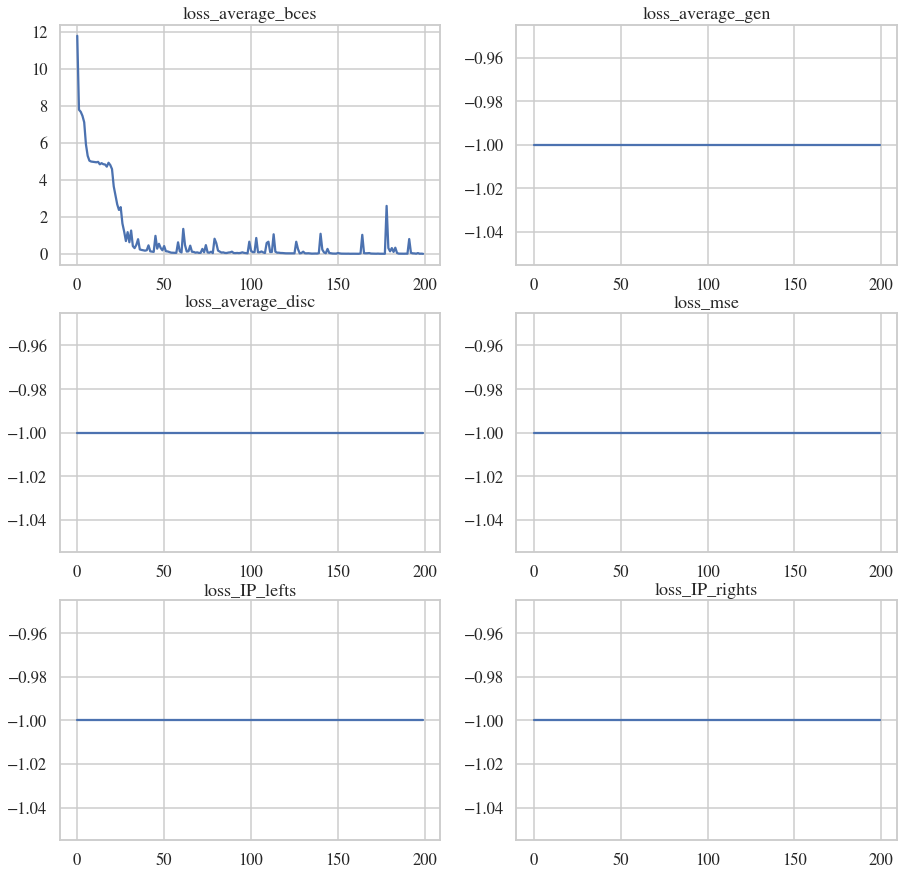

In [34]:
# parameters = list(features_nn.parameters()) + list(model.parameters()) + list(edge_nn.parameters())
optimizer = torch.optim.Adam(list(model.parameters()) + 
                             list(edge_nn.parameters()), 
                                 lr=1e-3)

loss_average_bces = []
loss_average_gens = []
loss_average_discs = []
loss_mses = []
loss_IP_lefts = []
loss_IP_rights = []
for epoch in tqdm(range(200)):
    loss_average_bce, \
    loss_average_gen, \
    loss_average_disc, \
    loss_mse, \
    loss_IP_left, \
    loss_IP_right, \
    gen_showers = train_epoch(model, 
                                edge_nn, 
                                features_nn,
                                discriminator_nn,
                                dataset_loader, 
                                optimizer=optimizer, 
                                weights={
                                    'll_bce': 1., 
                                    'll_gen': 0.,
                                    'll_disc': 0.,
                                    'll_mse': 0,
                                    'll_IP_right': 0.,
                                    'll_IP_left': 0.
                                }, signal_gen=False)
    
    loss_average_bces.append(loss_average_bce)
    loss_average_gens.append(loss_average_gen)
    loss_average_discs.append(loss_average_disc)
    loss_mses.append(loss_mse)
    loss_IP_lefts.append(loss_IP_left)
    loss_IP_rights.append(loss_IP_right)
    if (epoch + 1) % 50 == 0:
        torch.save(model.state_dict(), open(PATH + 'graph_nn.pcl', 'wb+'))
        torch.save(edge_nn.state_dict(), open(PATH + 'edge_nn.pcl', 'wb+'))
        torch.save(features_nn.state_dict(), open(PATH + 'features_nn.pcl', 'wb+'))
        torch.save(discriminator_nn.state_dict(), open(PATH + 'discriminator_nn.pcl', 'wb+'))
    if epoch % 1 == 0:
        clear_output()
        plot_graphs({
            'loss_average_bces': loss_average_bces,
            'loss_average_gen': loss_average_gens,
            'loss_average_disc': loss_average_discs,
            'loss_mse': loss_mses,
            'loss_IP_lefts': loss_IP_lefts,
            'loss_IP_rights': loss_IP_rights
        })

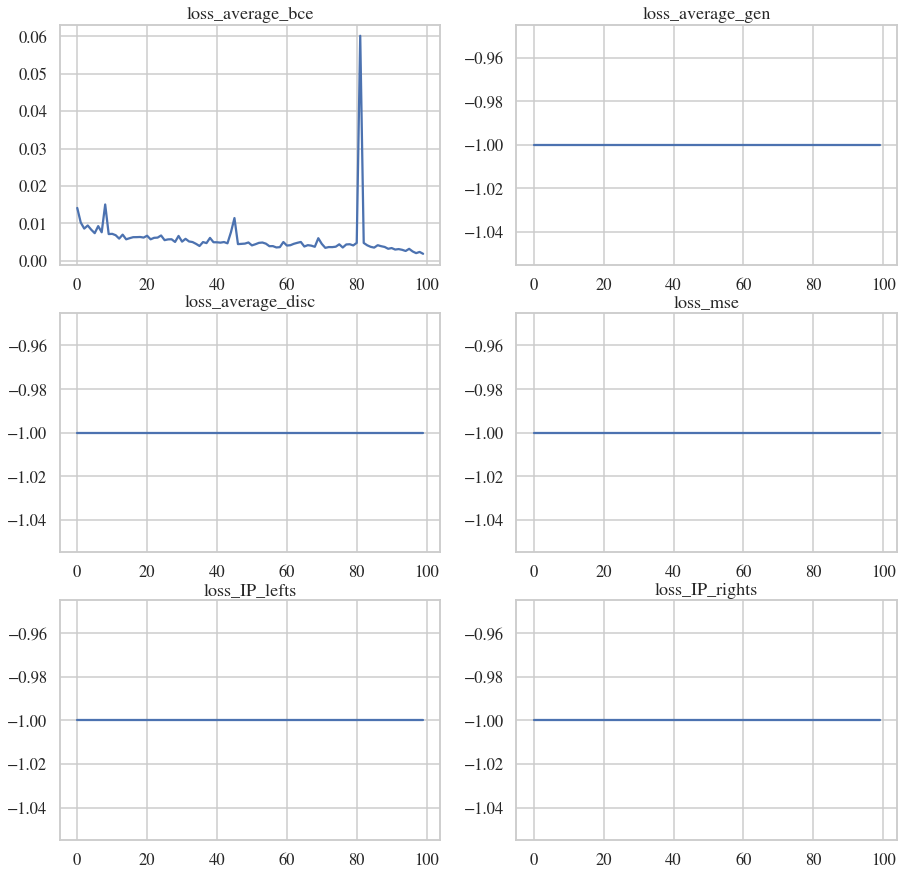

In [35]:
# parameters = list(features_nn.parameters()) + list(model.parameters()) + list(edge_nn.parameters())
optimizer = torch.optim.Adam(list(model.parameters()) + 
                             list(edge_nn.parameters()),
                                 lr=1e-4)

loss_average_bces = []
loss_average_gens = []
loss_average_discs = []
loss_mses = []
loss_IP_lefts = []
loss_IP_rights = []
for epoch in tqdm(range(100)):
    loss_average_bce, \
    loss_average_gen, \
    loss_average_disc, \
    loss_mse, \
    loss_IP_left, \
    loss_IP_right, gen_showers = train_epoch(model, 
                                edge_nn, 
                                features_nn,
                                discriminator_nn,
                                dataset_loader, 
                                optimizer=optimizer, 
                                weights={
                                    'll_bce': 1., 
                                    'll_gen': 0.,
                                    'll_disc': 0.,
                                    'll_mse': 0,
                                    'll_IP_right': 0.,
                                    'll_IP_left': 0.
                                }, signal_gen=False)
    
    loss_average_bces.append(loss_average_bce)
    loss_average_gens.append(loss_average_gen)
    loss_average_discs.append(loss_average_disc)
    loss_mses.append(loss_mse)
    loss_IP_lefts.append(loss_IP_left)
    loss_IP_rights.append(loss_IP_right)
    if (epoch + 1) % 50 == 0:
        torch.save(model.state_dict(), open(PATH + 'graph_nn.pcl', 'wb+'))
        torch.save(edge_nn.state_dict(), open(PATH + 'edge_nn.pcl', 'wb+'))
        torch.save(features_nn.state_dict(), open(PATH + 'features_nn.pcl', 'wb+'))
        torch.save(discriminator_nn.state_dict(), open(PATH + 'discriminator_nn.pcl', 'wb+'))
    if epoch % 1 == 0:
        clear_output()
        plot_graphs({
            'loss_average_bce': loss_average_bces,
            'loss_average_gen': loss_average_gens,
            'loss_average_disc': loss_average_discs,
            'loss_mse': loss_mses,
            'loss_IP_lefts': loss_IP_lefts,
            'loss_IP_rights': loss_IP_rights
        })

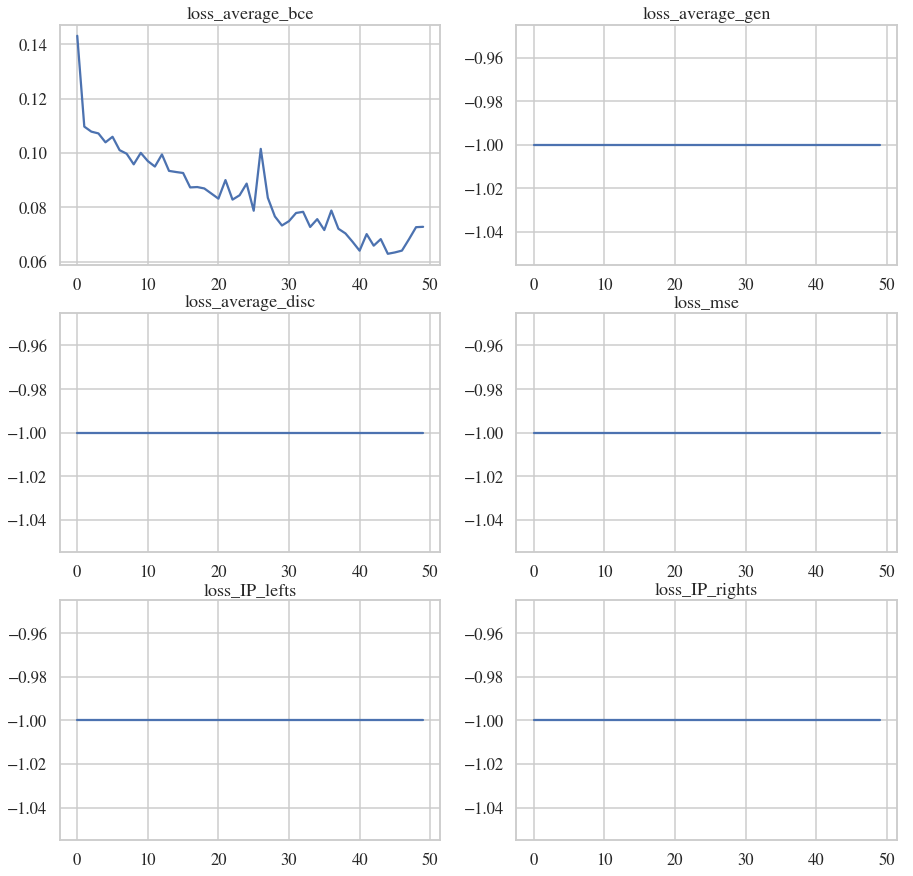

In [55]:
optimizer = torch.optim.Adam(list(model.parameters()) + 
                             list(edge_nn.parameters()),
                                 lr=1e-4)

loss_average_bces = []
loss_average_gens = []
loss_average_discs = []
loss_mses = []
loss_IP_lefts = []
loss_IP_rights = []
for epoch in tqdm(range(50)):
    loss_average_bce, \
    loss_average_gen, \
    loss_average_disc, \
    loss_mse, \
    loss_IP_left, \
    loss_IP_right, gen_showers = train_epoch(model, 
                                edge_nn, 
                                features_nn,
                                discriminator_nn,
                                dataset_loader, 
                                optimizer=optimizer, 
                                weights={
                                    'll_bce': 1., 
                                    'll_gen': 0.,
                                    'll_disc': 0.,
                                    'll_mse': 0,
                                    'll_IP_right': 0.,
                                    'll_IP_left': 0.
                                }, signal_gen=False)
    
    loss_average_bces.append(loss_average_bce)
    loss_average_gens.append(loss_average_gen)
    loss_average_discs.append(loss_average_disc)
    loss_mses.append(loss_mse)
    loss_IP_lefts.append(loss_IP_left)
    loss_IP_rights.append(loss_IP_right)
    if (epoch + 1) % 50 == 0:
        torch.save(model.state_dict(), open(PATH + 'graph_nn.pcl', 'wb+'))
        torch.save(edge_nn.state_dict(), open(PATH + 'edge_nn.pcl', 'wb+'))
        torch.save(features_nn.state_dict(), open(PATH + 'features_nn.pcl', 'wb+'))
        torch.save(discriminator_nn.state_dict(), open(PATH + 'discriminator_nn.pcl', 'wb+'))
    if epoch % 1 == 0:
        clear_output()
        plot_graphs({
            'loss_average_bce': loss_average_bces,
            'loss_average_gen': loss_average_gens,
            'loss_average_disc': loss_average_discs,
            'loss_mse': loss_mses,
            'loss_IP_lefts': loss_IP_lefts,
            'loss_IP_rights': loss_IP_rights
        })

In [ ]:
# features_nn = FeaturesGCN(dim_in=embedding_size + 2, 
#                           embedding_size=16, 
#                           num_layers_gcn=3, 
#                           num_layers_dense=3,
#                           mixture_size=4,
#                           dim_out=5).to(device=device)

# discriminator_nn = DiscriminatorGCN(in_features = 5, 
#                                     out_features = 1,
#                                     filters=[64,64,64],
#                                     n_hidden=64,
#                                     dropout=0.4, 
#                                     agg='add').to(device = device)

### Train GAN

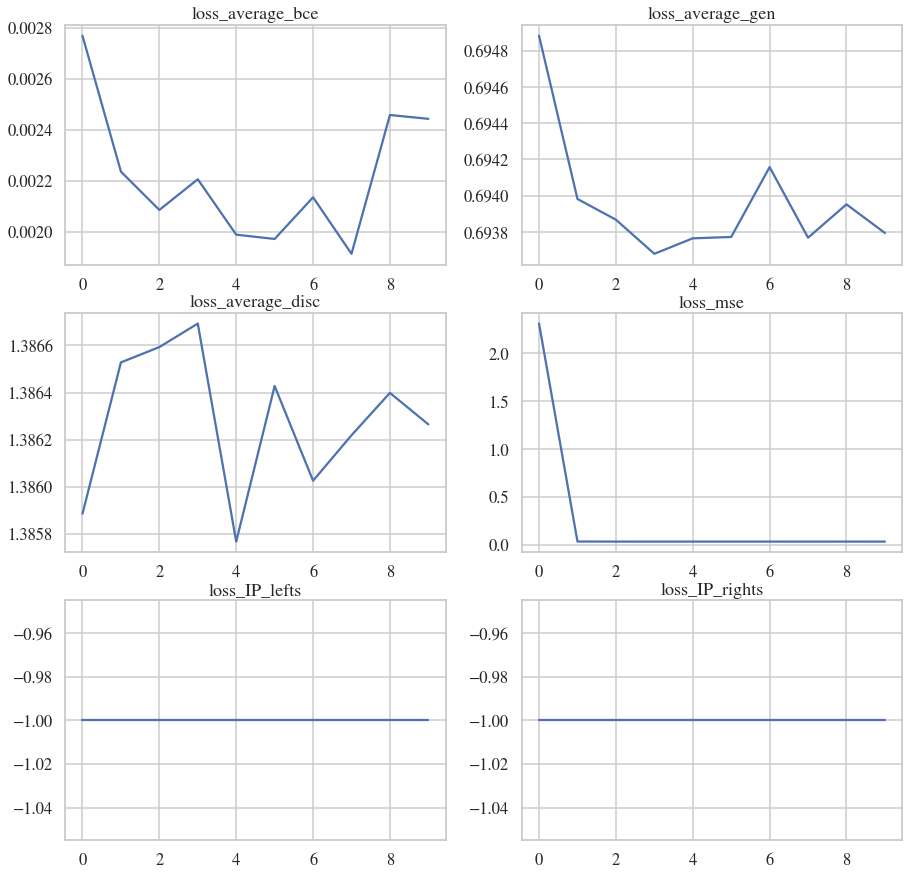

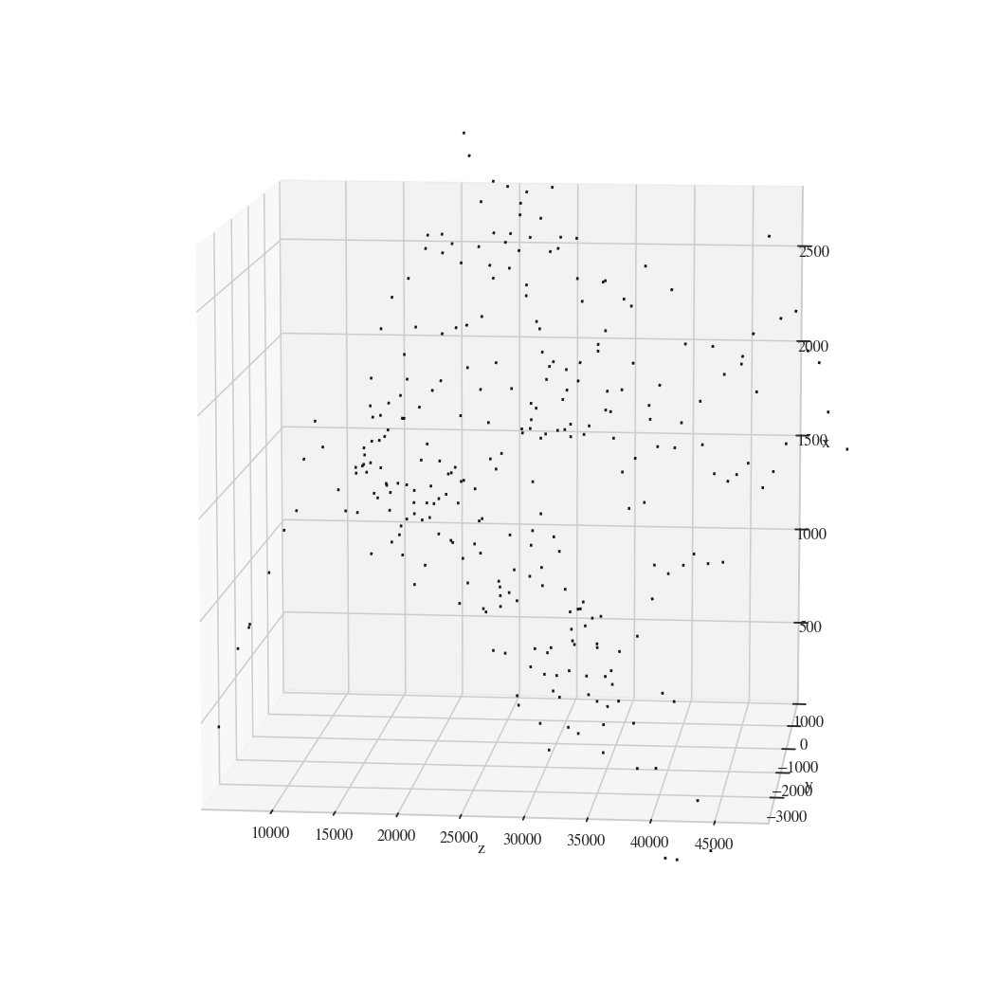

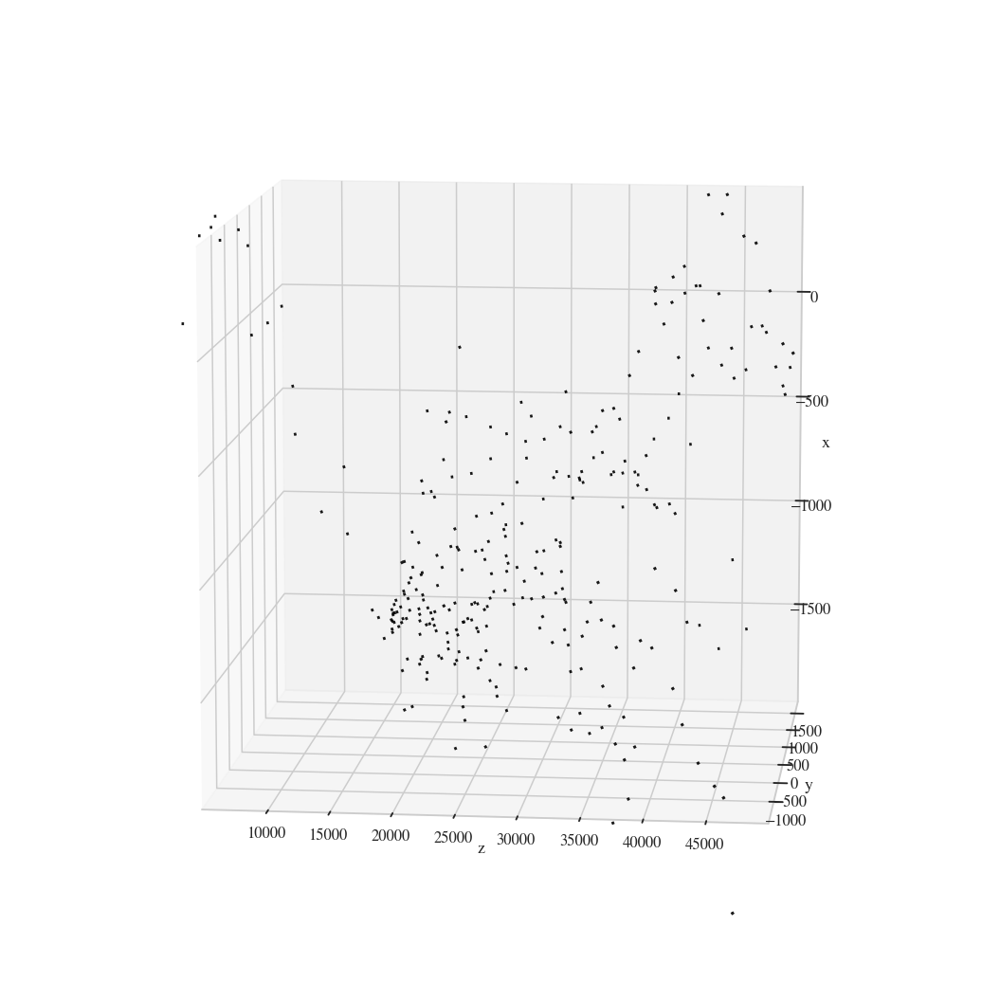

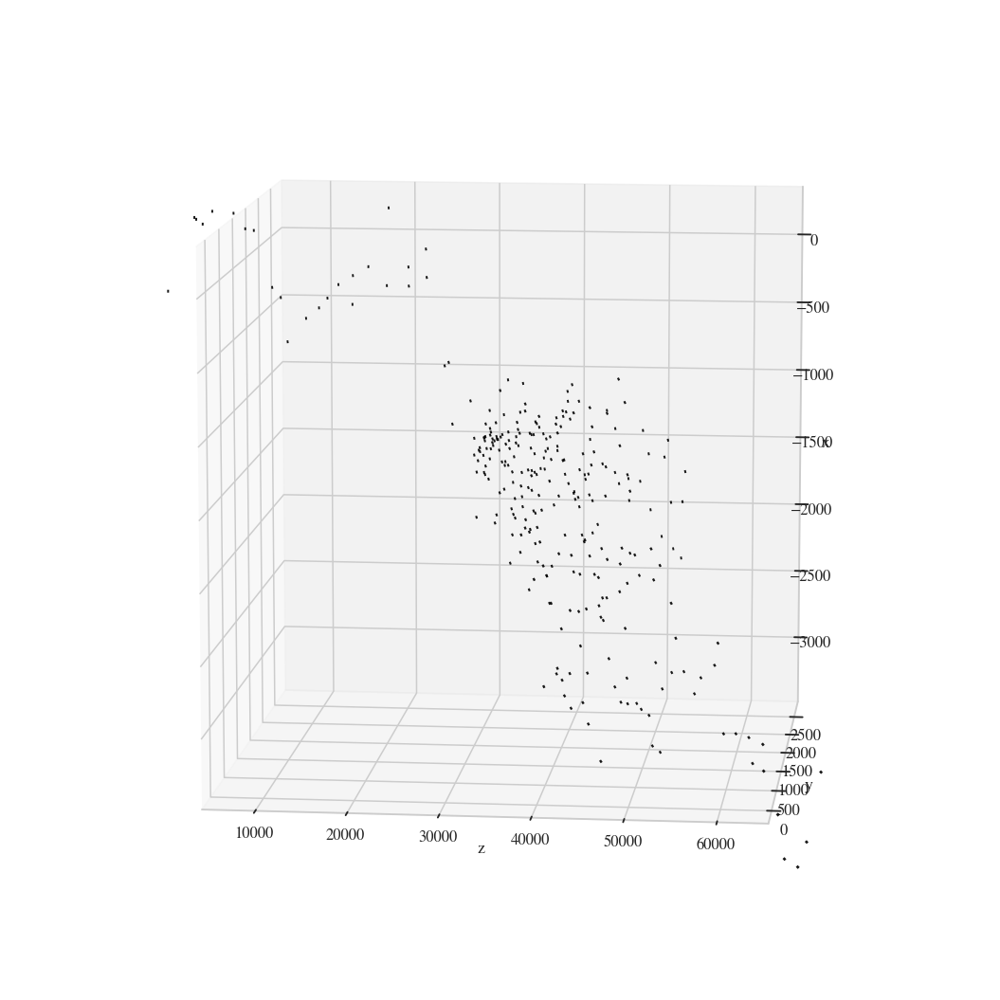

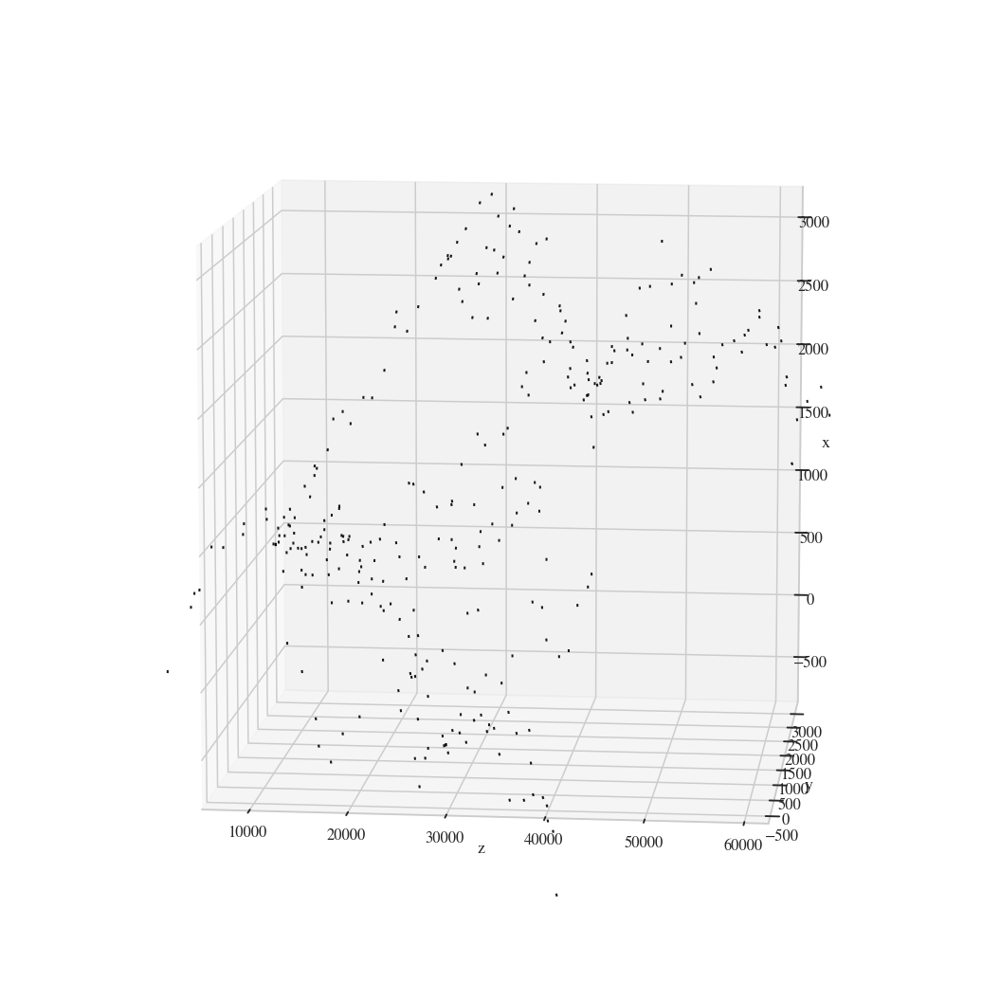

...

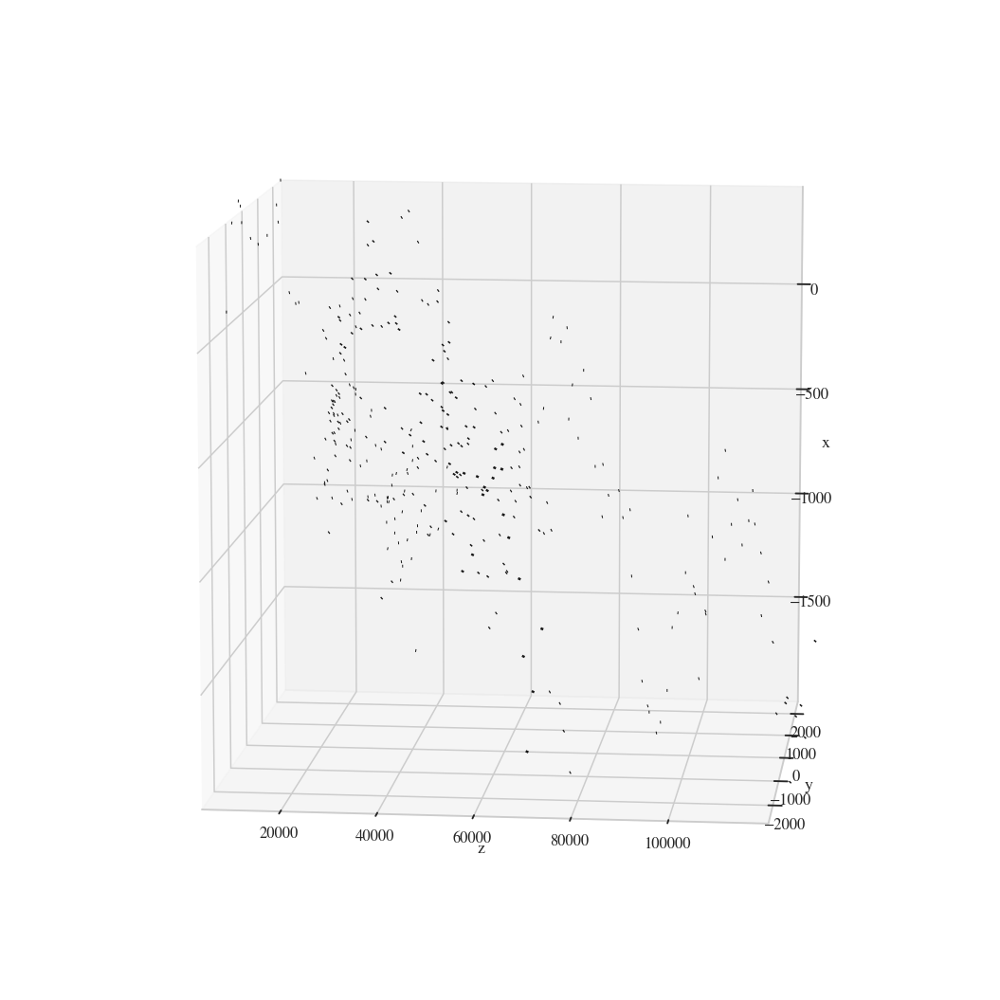

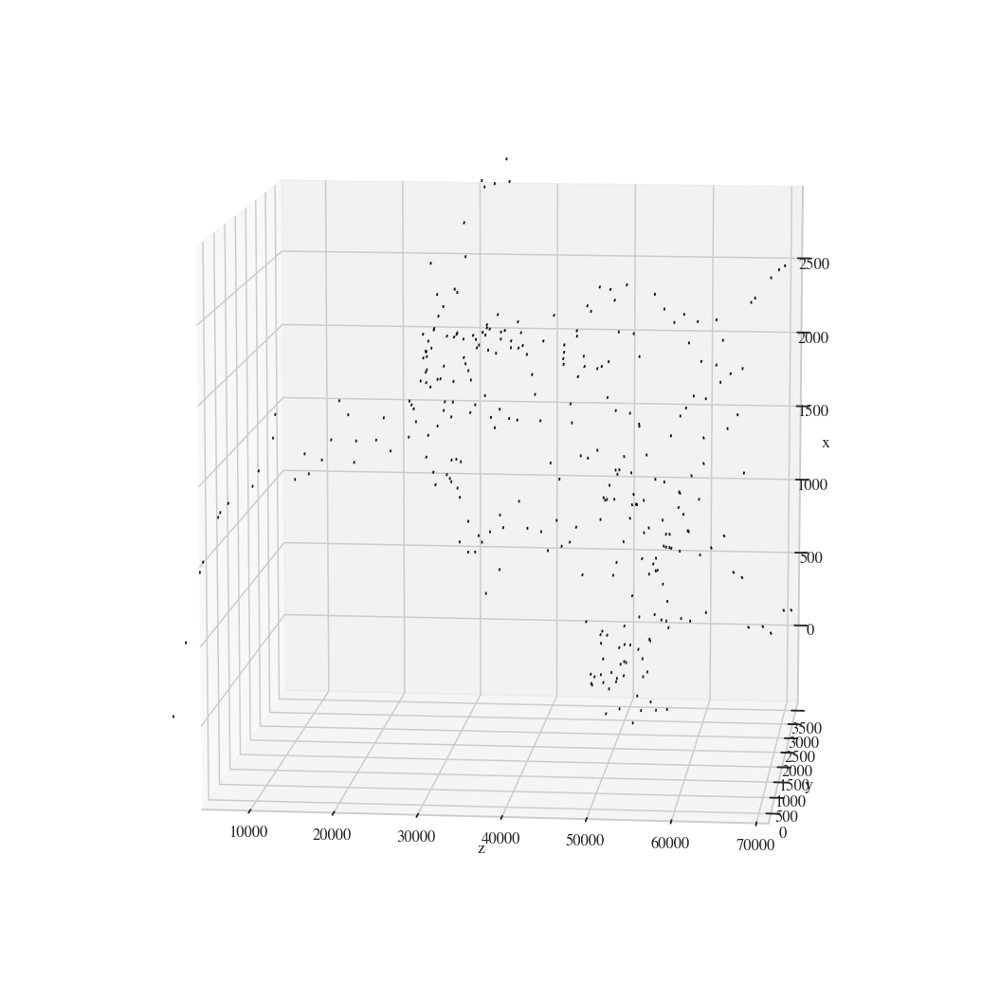

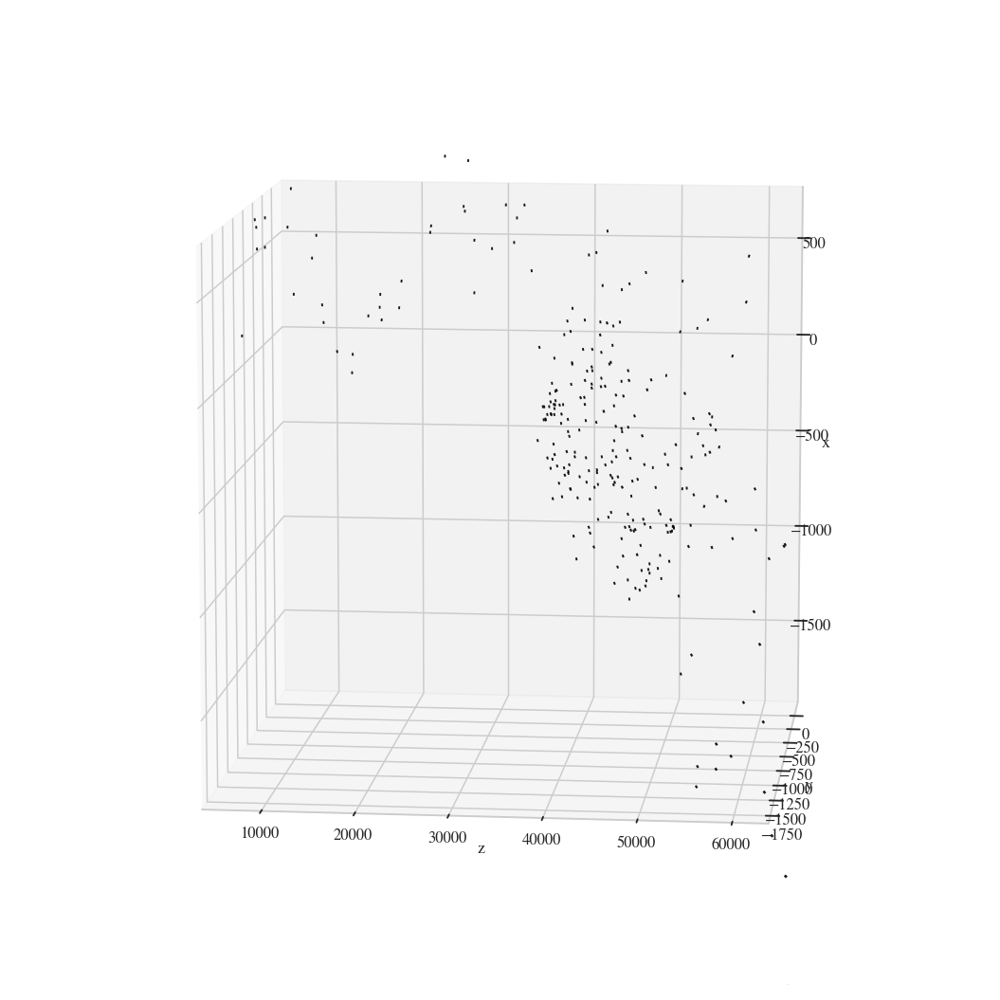

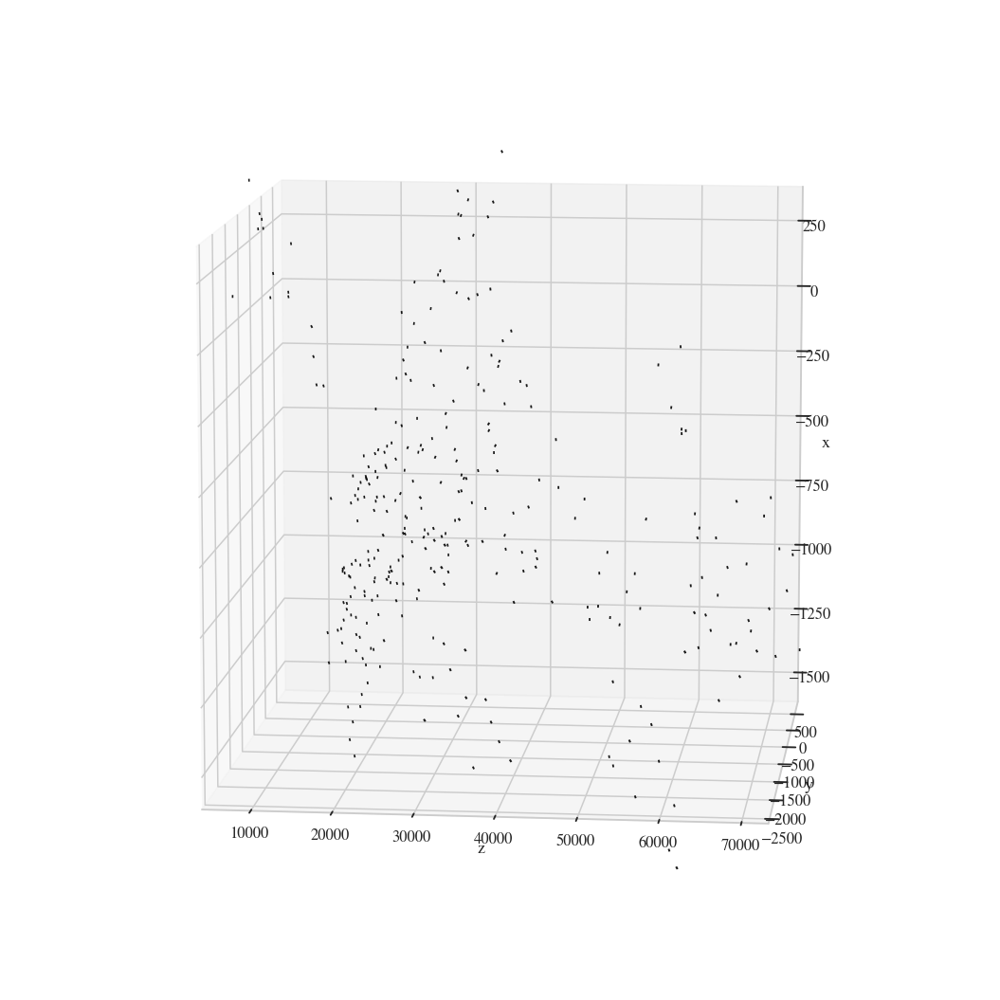

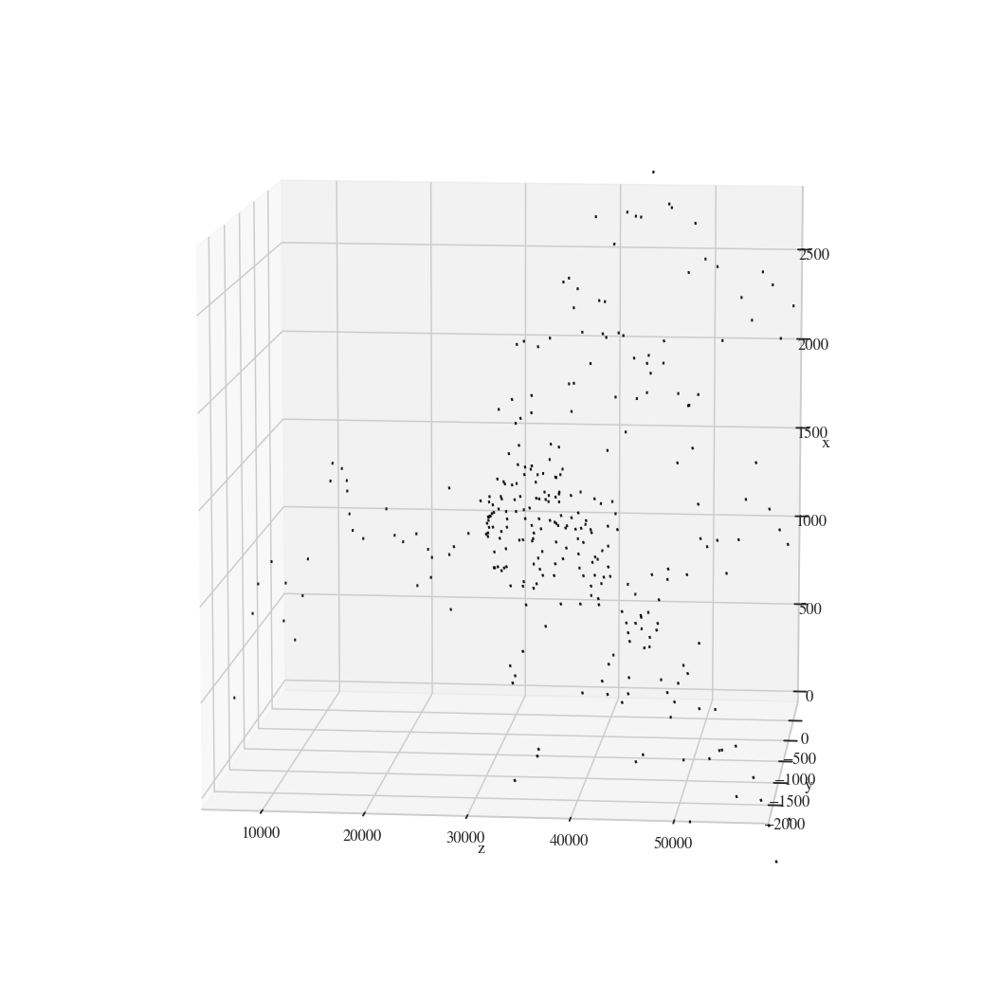

In [76]:
gen_opt = torch.optim.Adam(list(features_nn.parameters()), 
                                 lr=1e-3)

loss_average_bces = []
loss_average_gens = []
loss_average_discs = []
loss_mses = []
loss_IP_lefts = []
loss_IP_rights = []                                                                                                                                                                                                                     
for epoch in tqdm(range(10)):
    loss_average_bce, \
    loss_average_gen, \
    loss_average_disc, \
    loss_mse, \
    loss_IP_left, \
    loss_IP_right, gen_showers = train_epoch(model, 
                                edge_nn, 
                                features_nn,
                                discriminator_nn,
                                dataset_loader, 
                                optimizer=gen_opt, 
                                weights={
                                    'll_bce': 0., 
                                    'll_gen': 0.,
                                    'll_disc': 0.,
                                    'll_mse': 1.,
                                    'll_IP_right': 0.,
                                    'll_IP_left': 0.
                                }, signal_gen=True)
    
    loss_average_bces.append(loss_average_bce)
    loss_average_gens.append(loss_average_gen)
    loss_average_discs.append(loss_average_disc)
    loss_mses.append(loss_mse)
    loss_IP_lefts.append(loss_IP_left)
    loss_IP_rights.append(loss_IP_right)
    if (epoch + 1) % 50 == 0:
        torch.save(model.state_dict(), open(PATH + 'graph_nn.pcl', 'wb+'))
        torch.save(edge_nn.state_dict(), open(PATH + 'edge_nn.pcl', 'wb+'))
        torch.save(features_nn.state_dict(), open(PATH + 'features_nn.pcl', 'wb+'))
    if epoch % 1 == 0:
        clear_output()
        plot_graphs({
            'loss_average_bce': loss_average_bces,
            'loss_average_gen': loss_average_gens,
            'loss_average_disc': loss_average_discs,
            'loss_mse': loss_mses,
            'loss_IP_lefts': loss_IP_lefts,
            'loss_IP_rights': loss_IP_rights
        })
        for j in gen_showers:
            tmp_X = j.copy()
            tmp_X *= np.array([1e5, 1e5, 1e5, 1, 1])
            plot_npframe(tmp_X) 

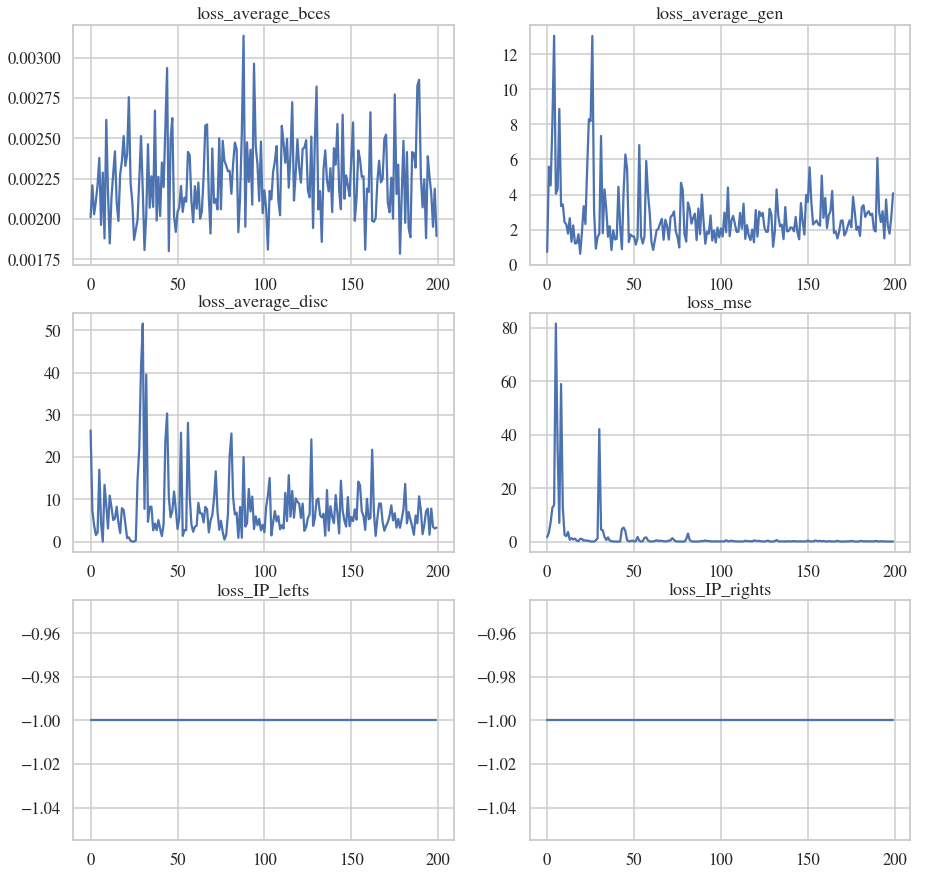

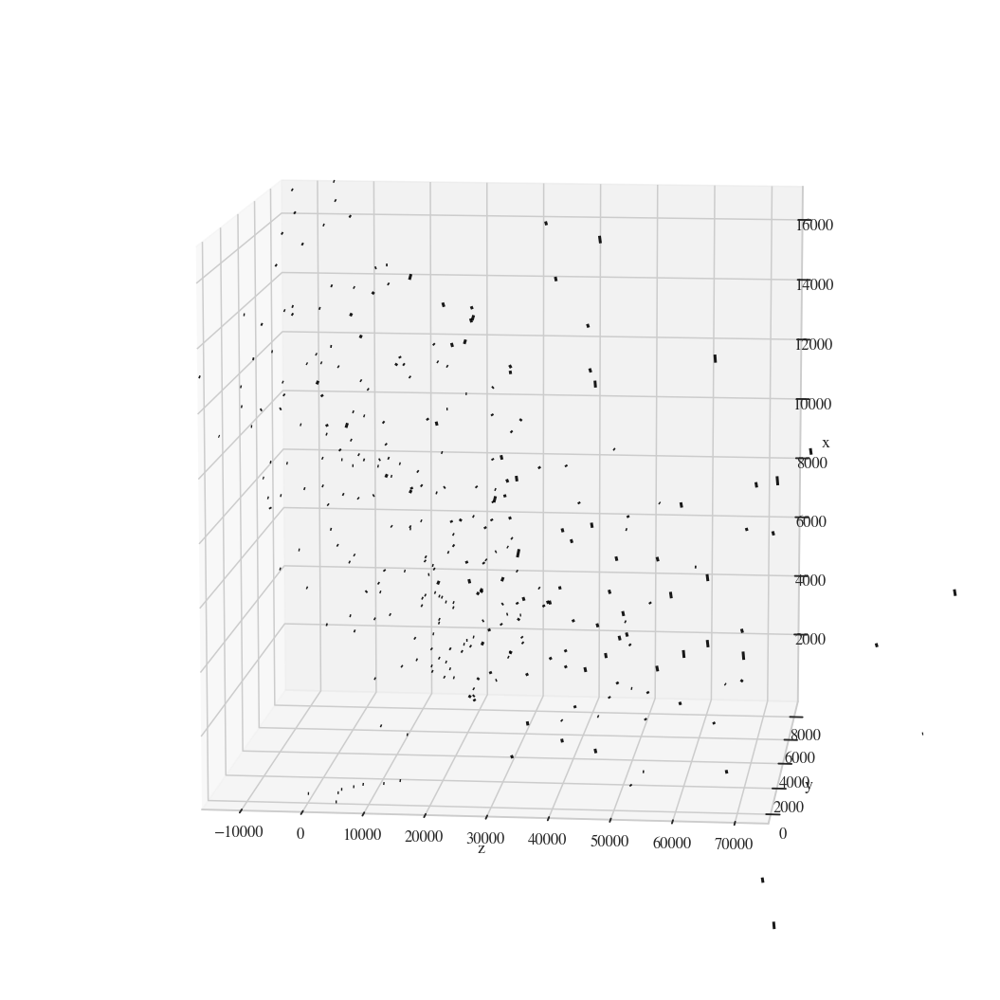

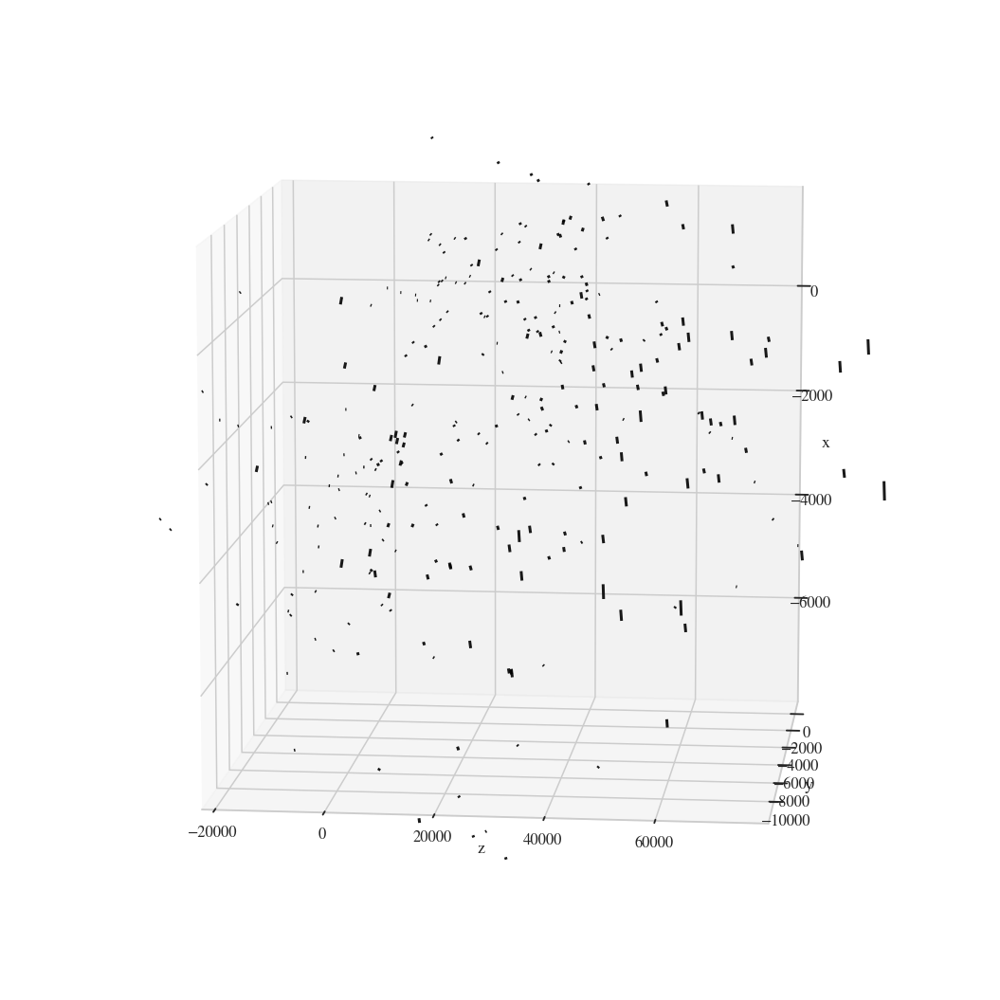

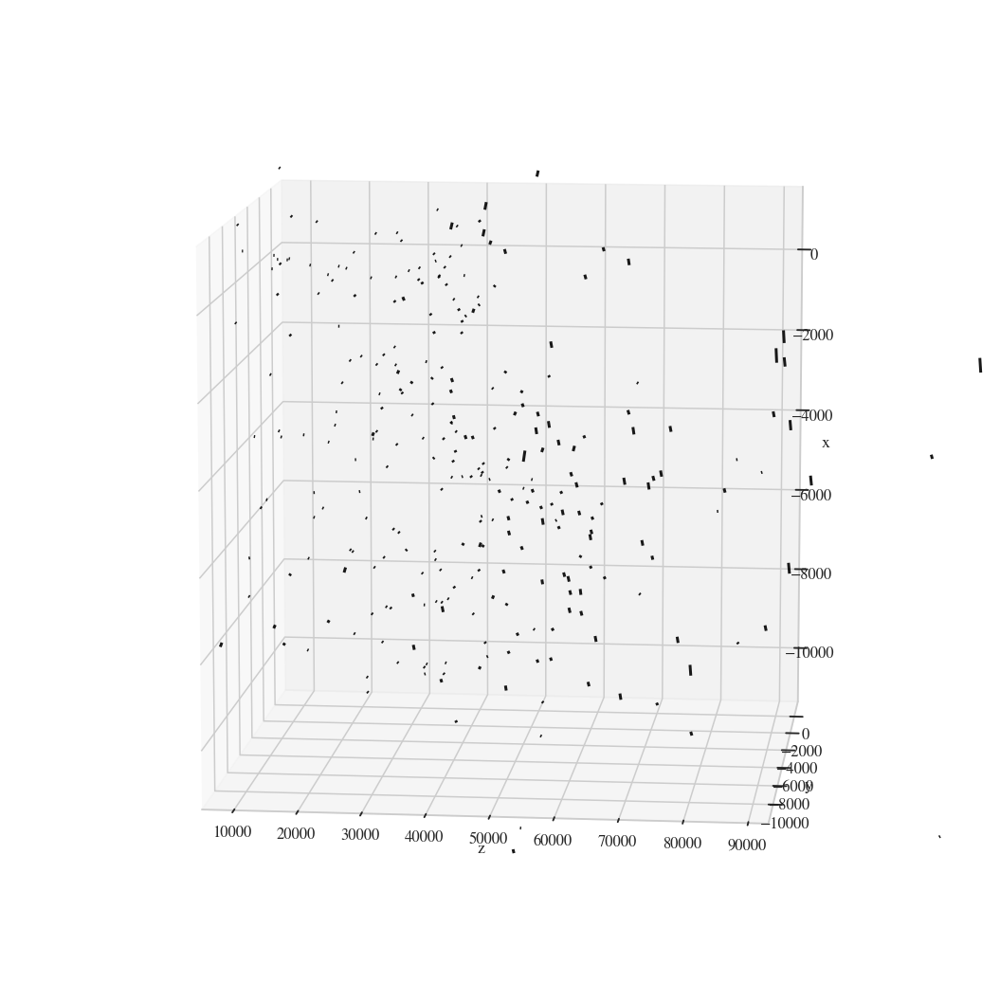

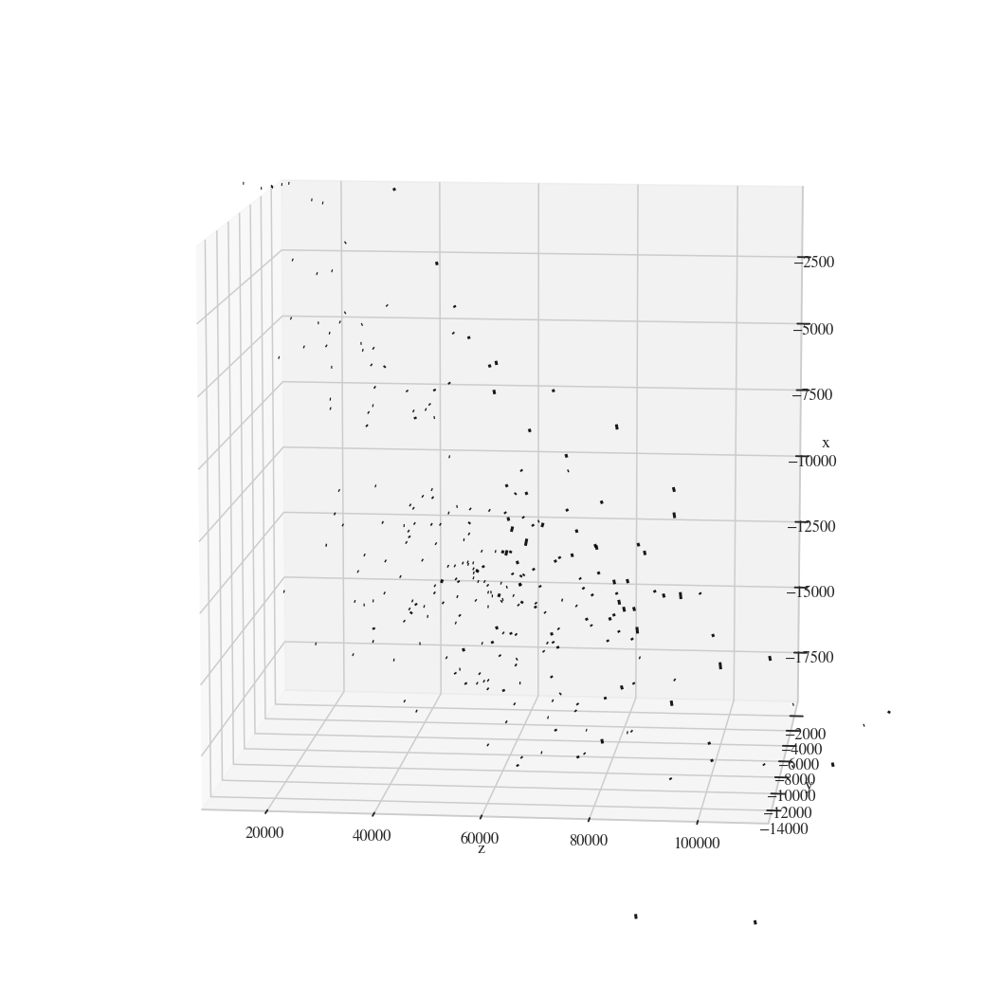

...

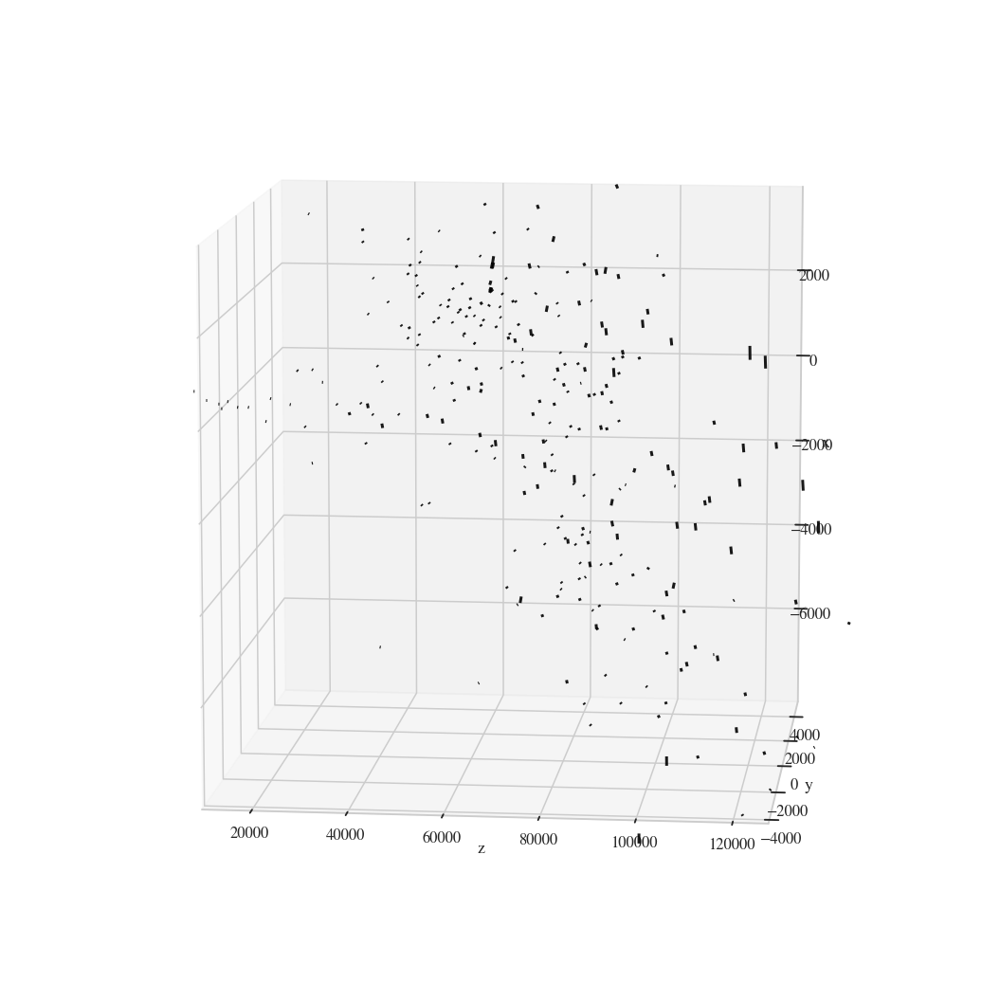

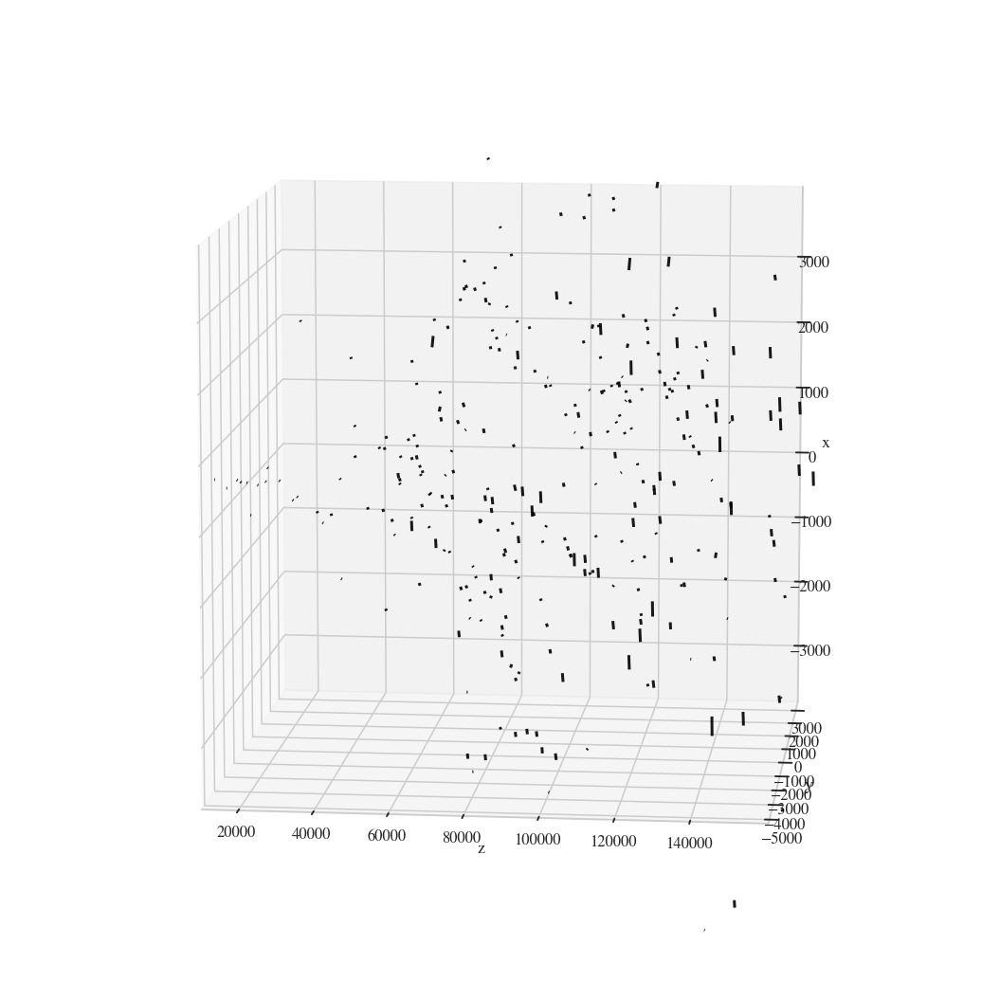

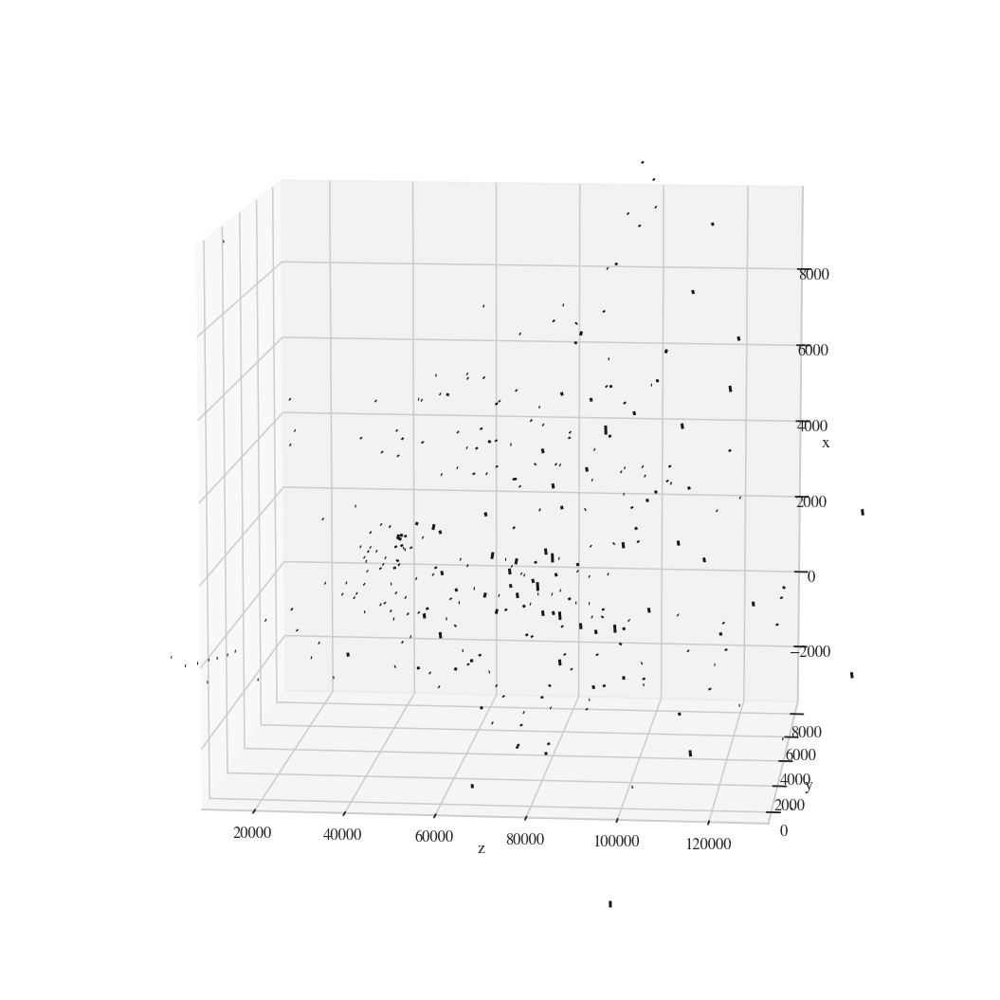

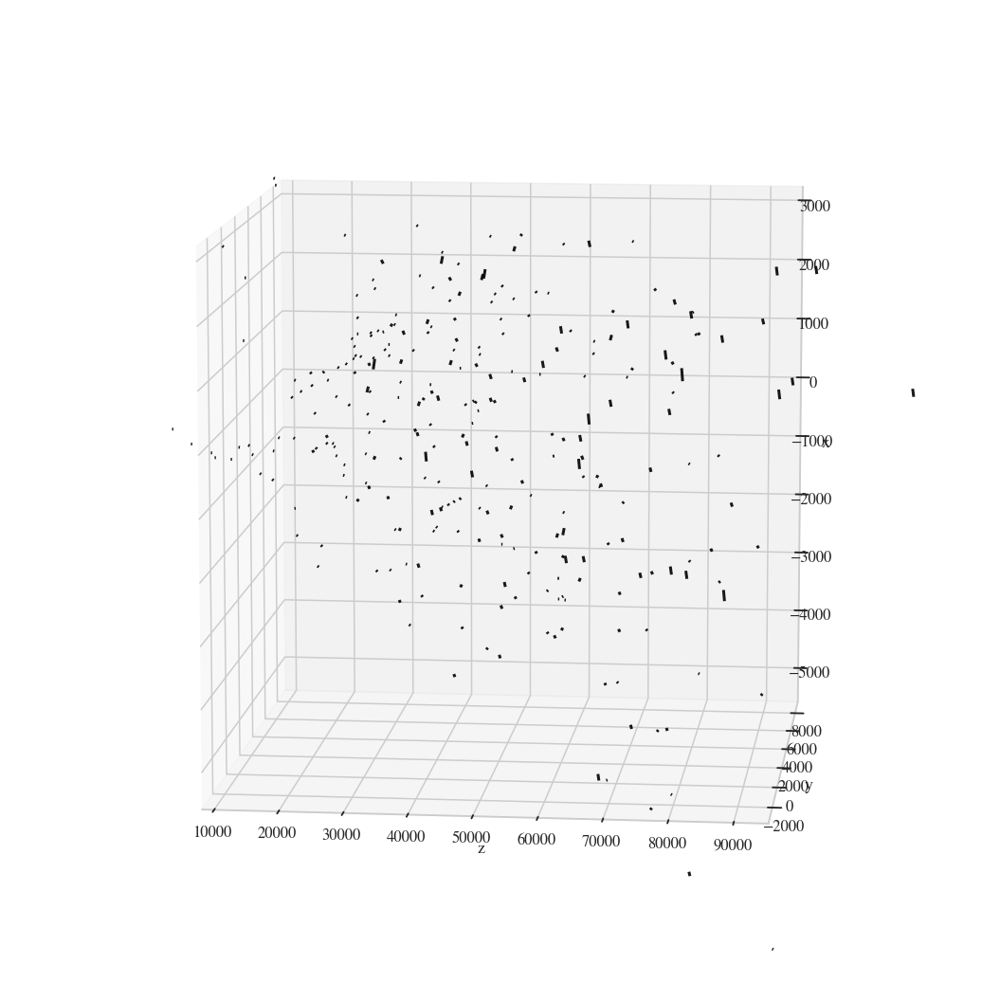

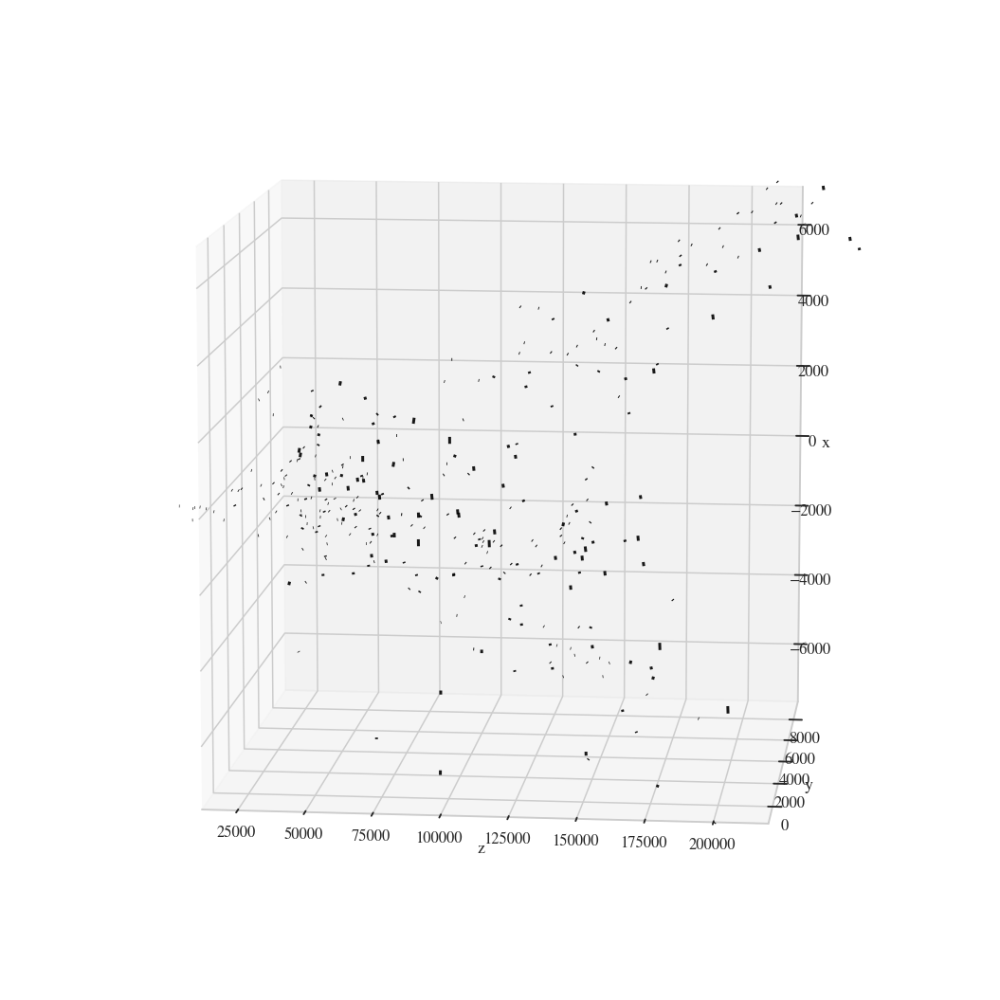

In [77]:
gen_opt = torch.optim.Adam(list(features_nn.parameters()), 
                           lr=5e-4)
disc_opt = torch.optim.RMSprop(list(discriminator_nn.parameters()),
                           lr=1e-3)


loss_average_bces = []
loss_average_gens = []
loss_average_discs = []
loss_mses = []
loss_IP_lefts = []
loss_IP_rights = []
for epoch in tqdm(range(200)):
    #train discriminator     
    for i in range(7):
        loss_average_bce, \
        loss_average_gen, \
        loss_average_disc, \
        loss_mse, \
        loss_IP_left, \
        loss_IP_right, gen_showers = train_epoch(model, edge_nn, 
                                    features_nn,
                                    discriminator_nn,
                                    dataset_loader, 
                                    optimizer=disc_opt, 
                                    weights={
                                        'll_bce': 0., 
                                        'll_gen': 0.,
                                        'll_disc': 1.,
                                        'll_mse': 0.,
                                        'll_IP_right': 0.,
                                        'll_IP_left': 0.
                                    }, signal_gen=True)
    
    #train generator
    loss_average_bce, \
        loss_average_gen, \
        loss_average_disc, \
        loss_mse, \
        loss_IP_left, \
        loss_IP_right, gen_showers = train_epoch(model, edge_nn, 
                                    features_nn,
                                    discriminator_nn,
                                    dataset_loader, 
                                    optimizer=gen_opt, 
                                    weights={
                                        'll_bce': 0., 
                                        'll_gen': 1.,
                                        'll_disc': 0.,
                                        'll_mse': 0.,
                                        'll_IP_right': 0.,
                                        'll_IP_left': 0.
                                    }, signal_gen=True)    
    
    loss_average_bces.append(loss_average_bce)
    loss_average_gens.append(loss_average_gen)
    loss_average_discs.append(loss_average_disc)
    loss_mses.append(loss_mse)
    loss_IP_lefts.append(loss_IP_left)
    loss_IP_rights.append(loss_IP_right)
    if (epoch + 1) % 50 == 0:
        torch.save(model.state_dict(), open(PATH + 'graph_nn.pcl', 'wb+'))
        torch.save(edge_nn.state_dict(), open(PATH + 'edge_nn.pcl', 'wb+'))
        torch.save(features_nn.state_dict(), open(PATH + 'features_nn.pcl', 'wb+'))
        torch.save(discriminator_nn.state_dict(), open(PATH + 'discriminator_nn.pcl', 'wb+'))
    if epoch % 1 == 0:
        clear_output()
        plot_graphs({
            'loss_average_bces': loss_average_bces,
            'loss_average_gen': loss_average_gens,
            'loss_average_disc': loss_average_discs,
            'loss_mse': loss_mses,
            'loss_IP_lefts': loss_IP_lefts,
            'loss_IP_rights': loss_IP_rights
        })
        for j in gen_showers:
            tmp_X = j.copy()
            tmp_X *= np.array([1e5, 1e5, 1e5, 1, 1])
            plot_npframe(tmp_X) 

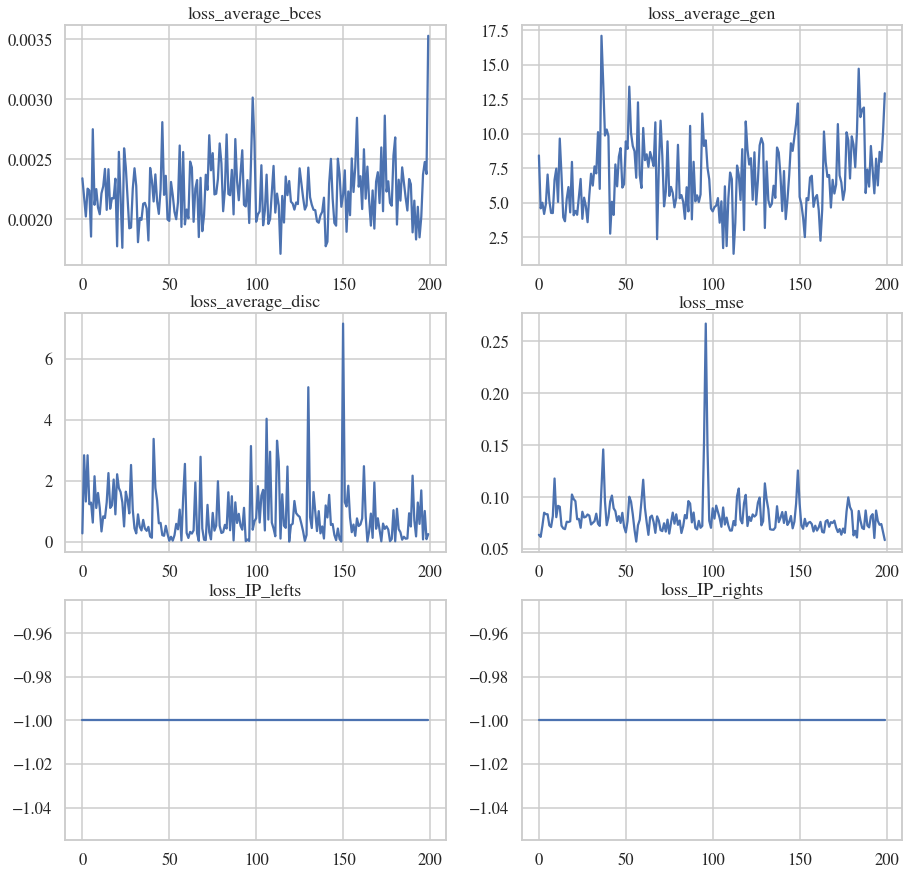

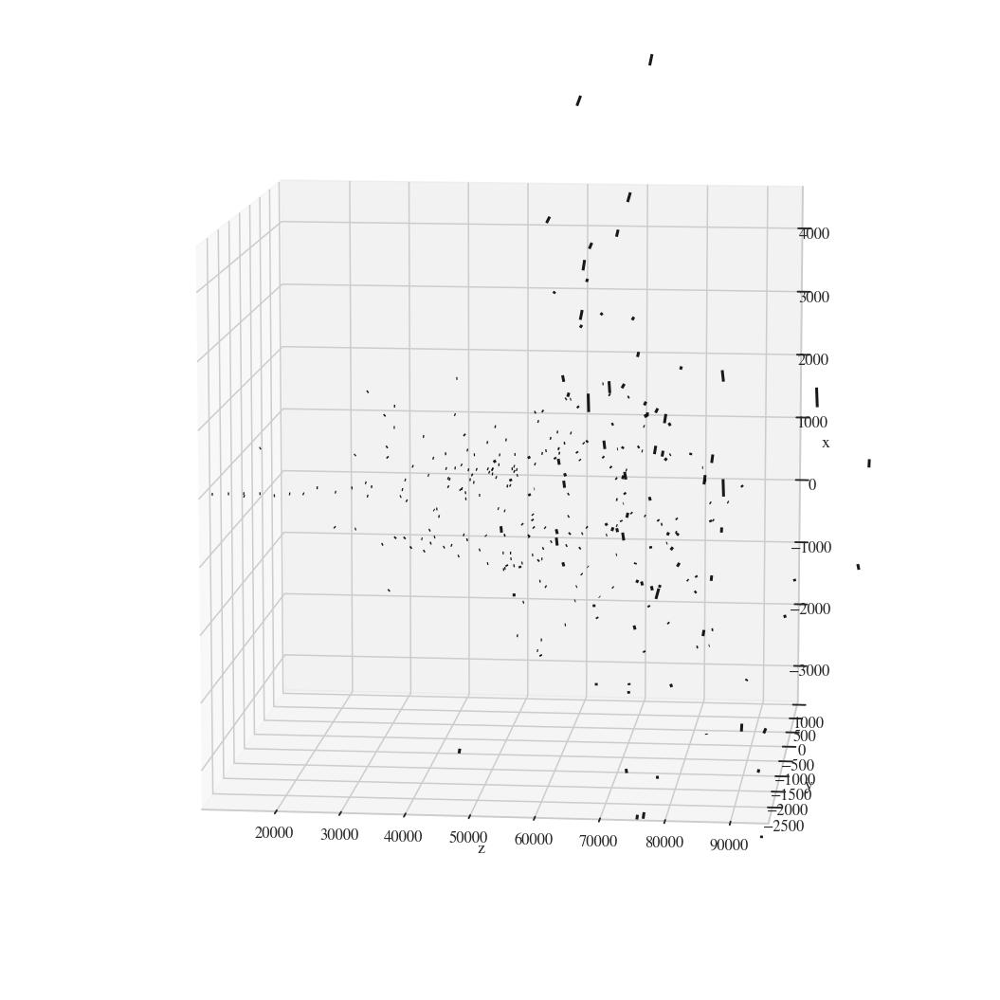

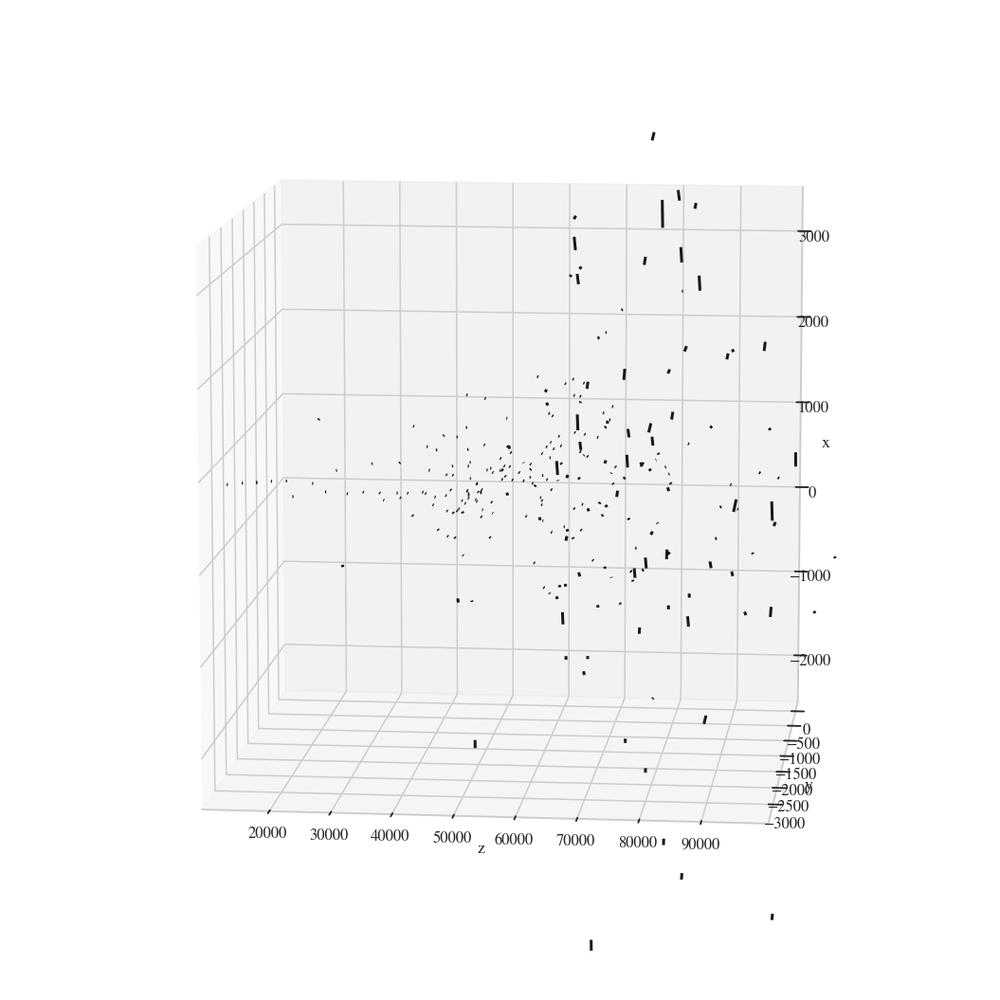

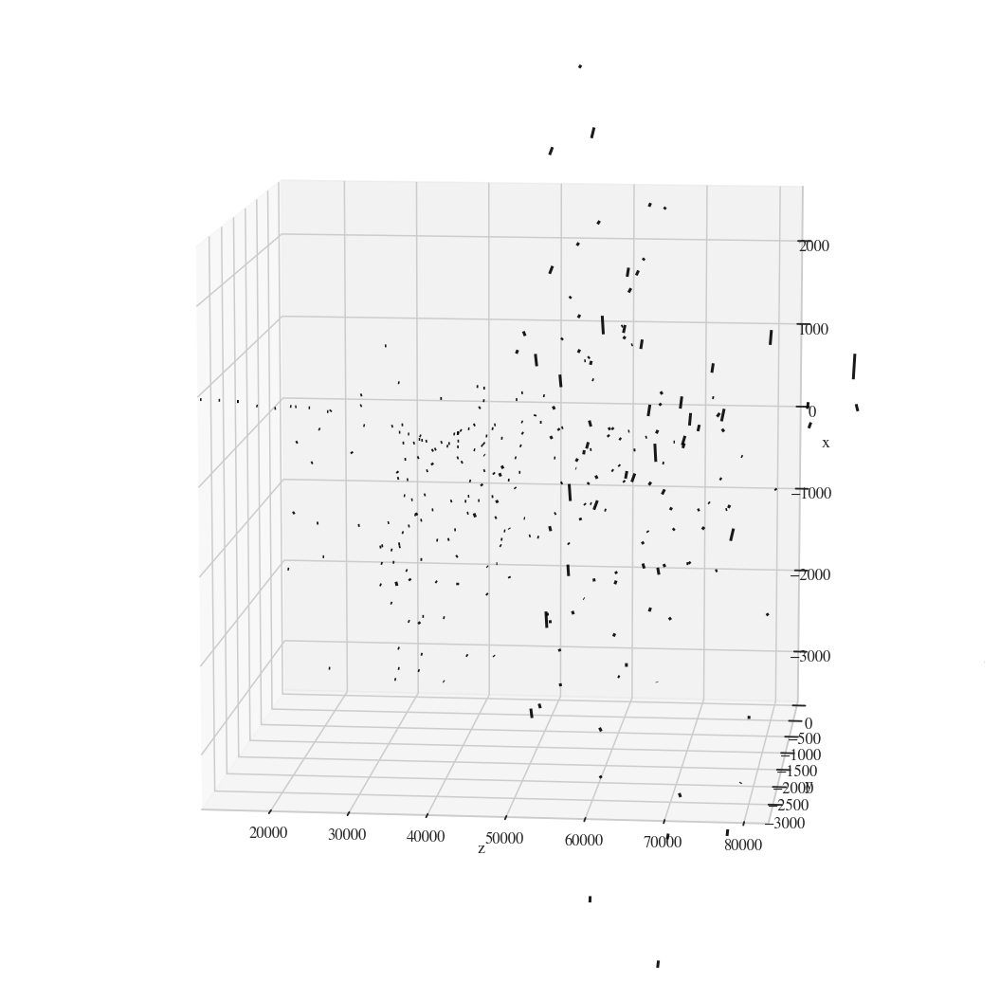

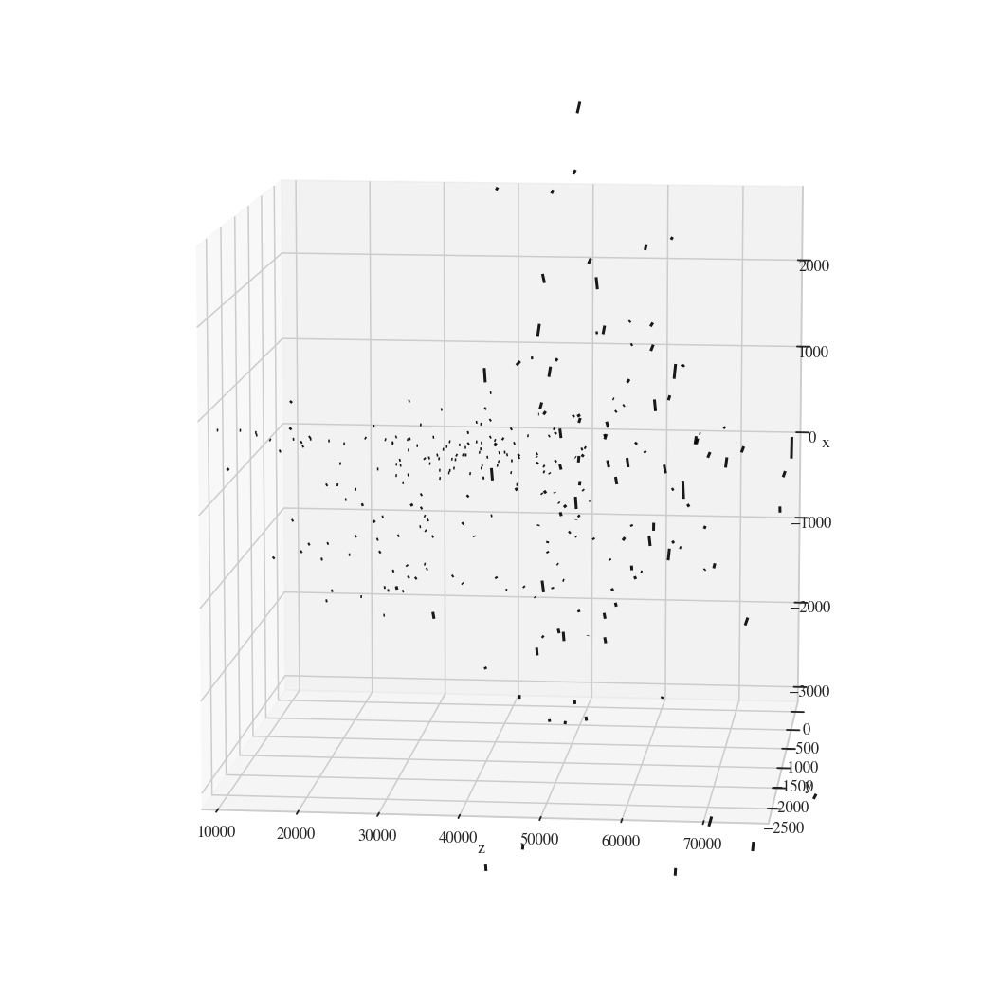

...

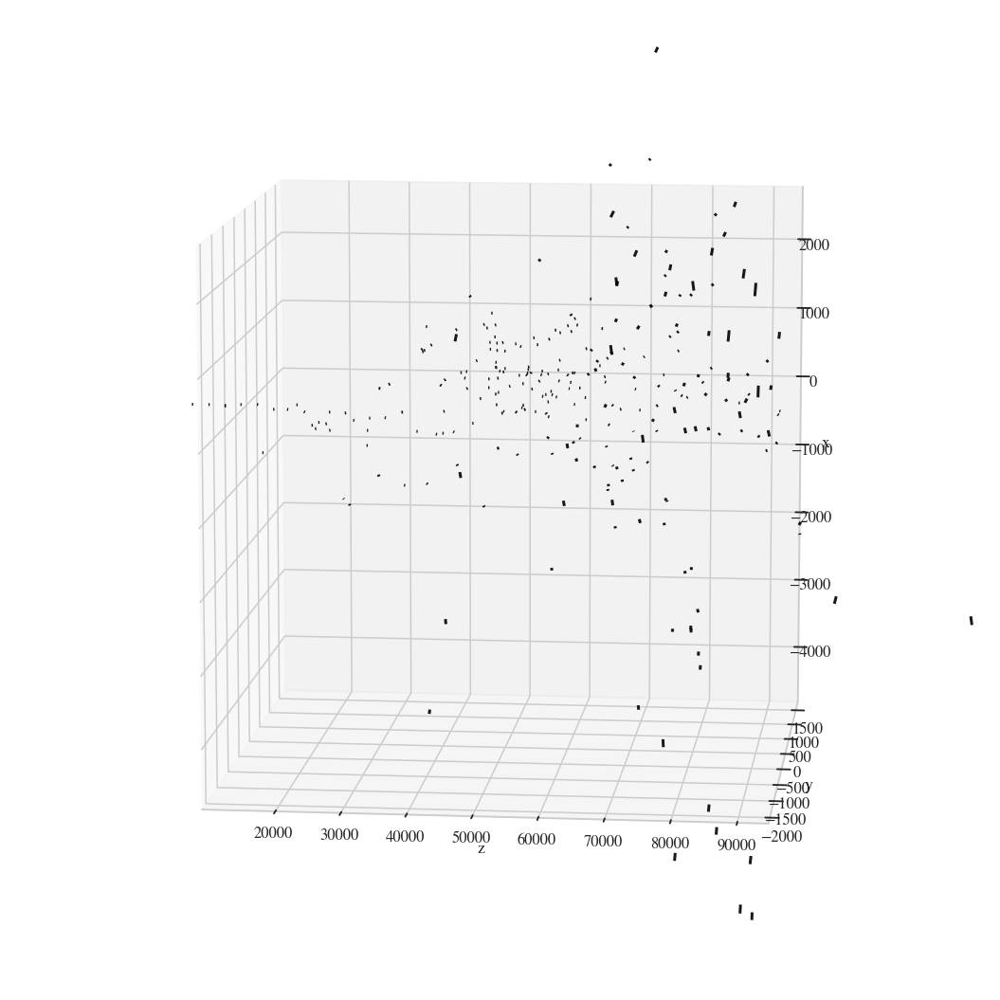

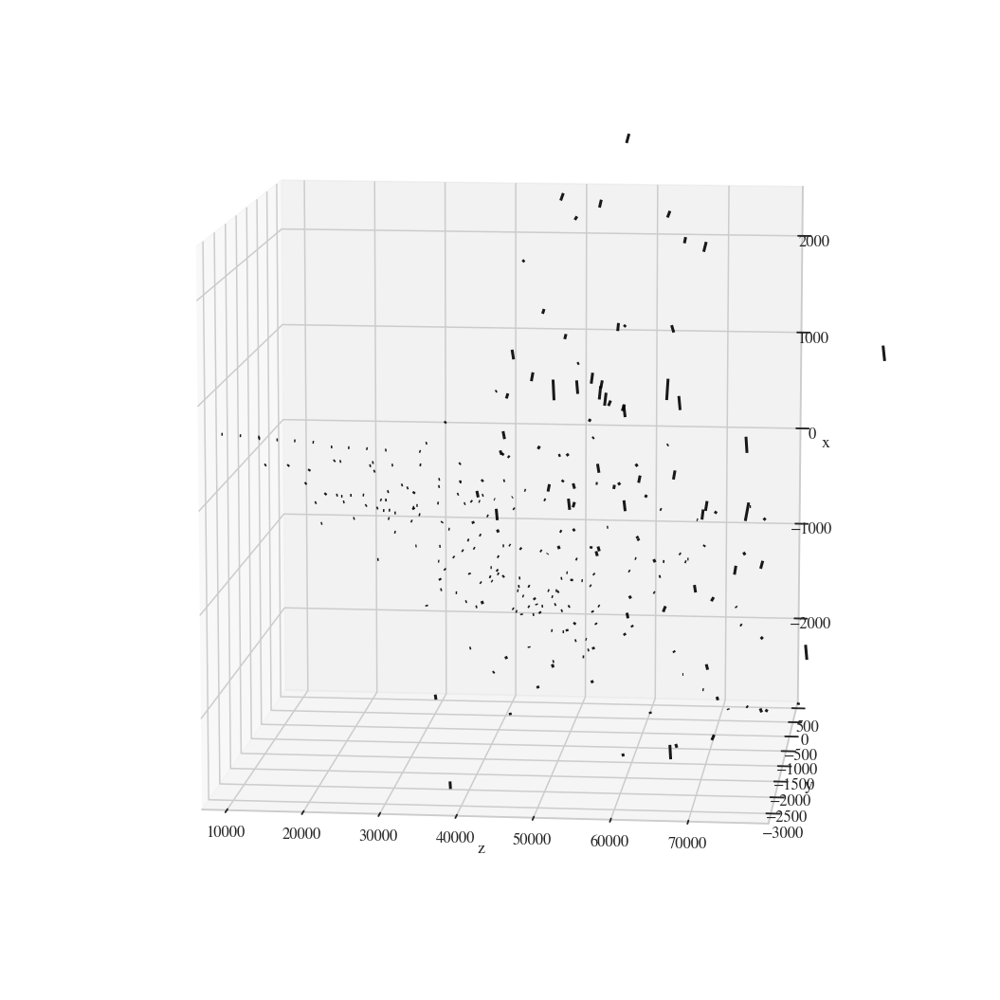

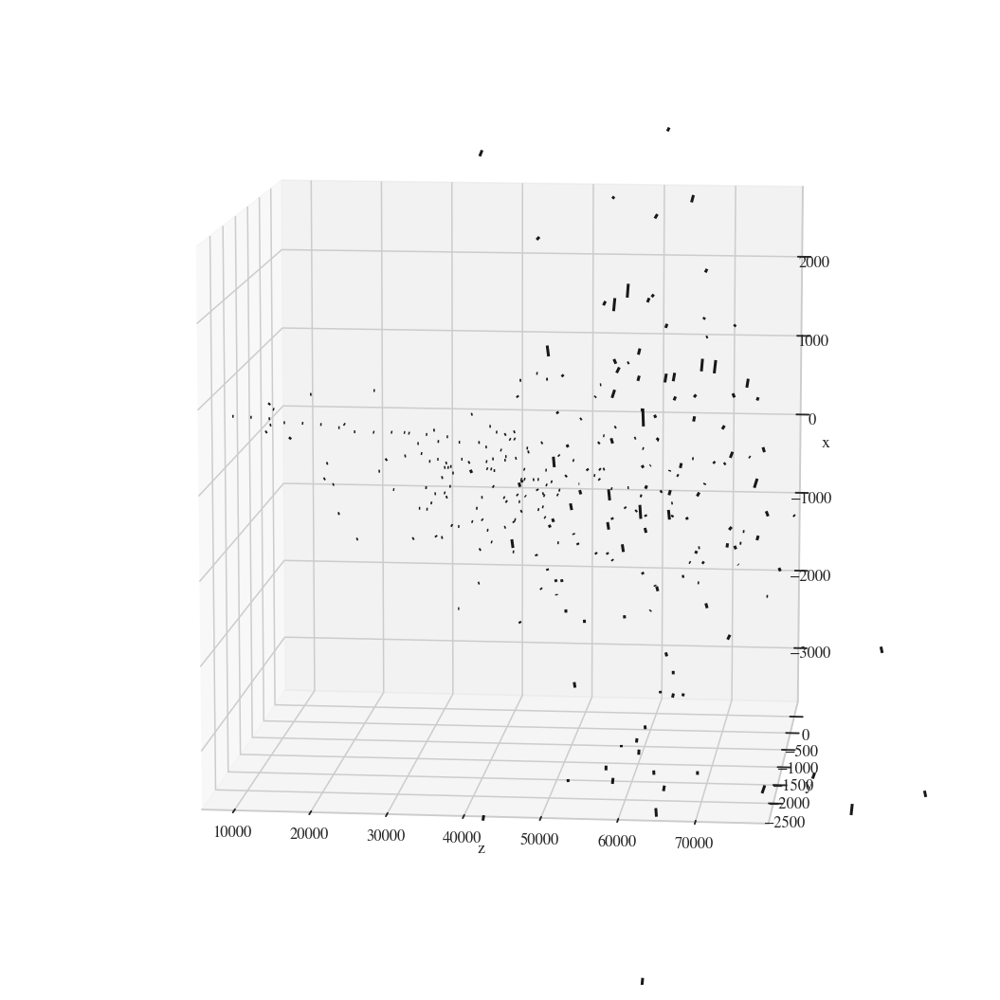

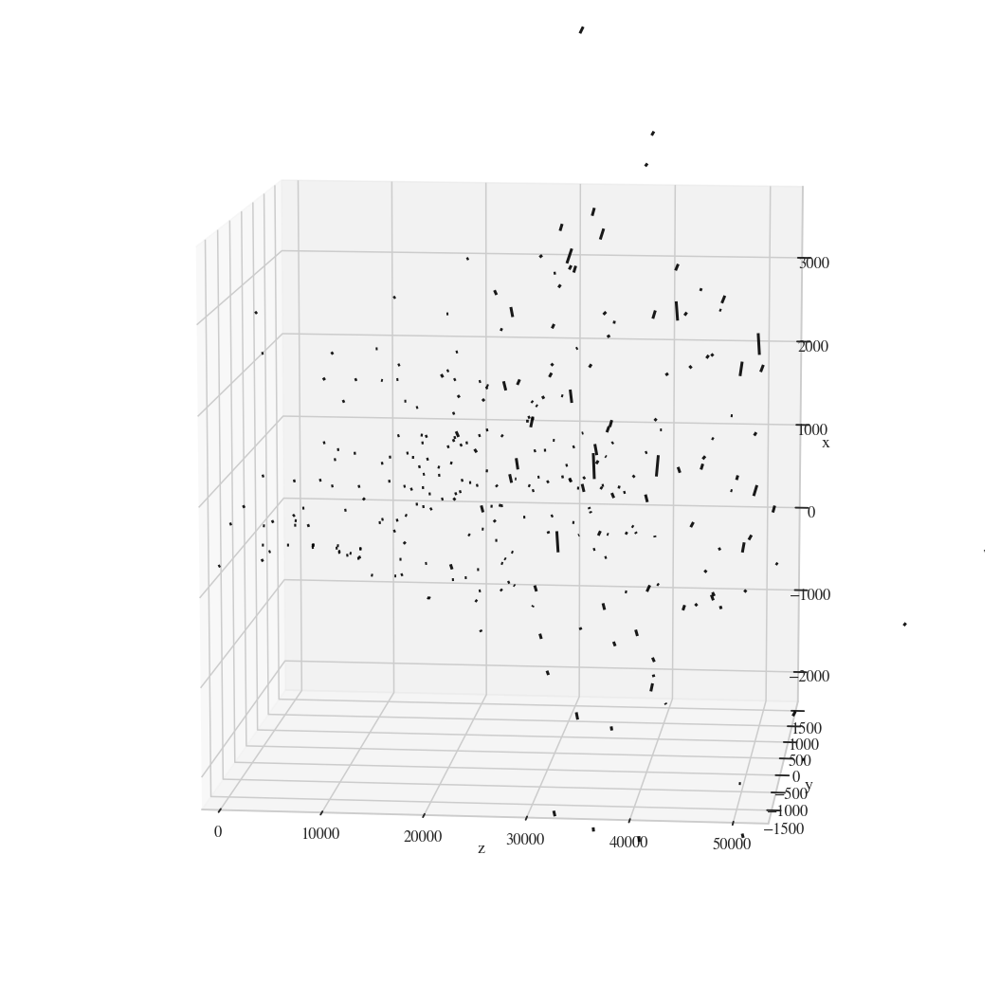

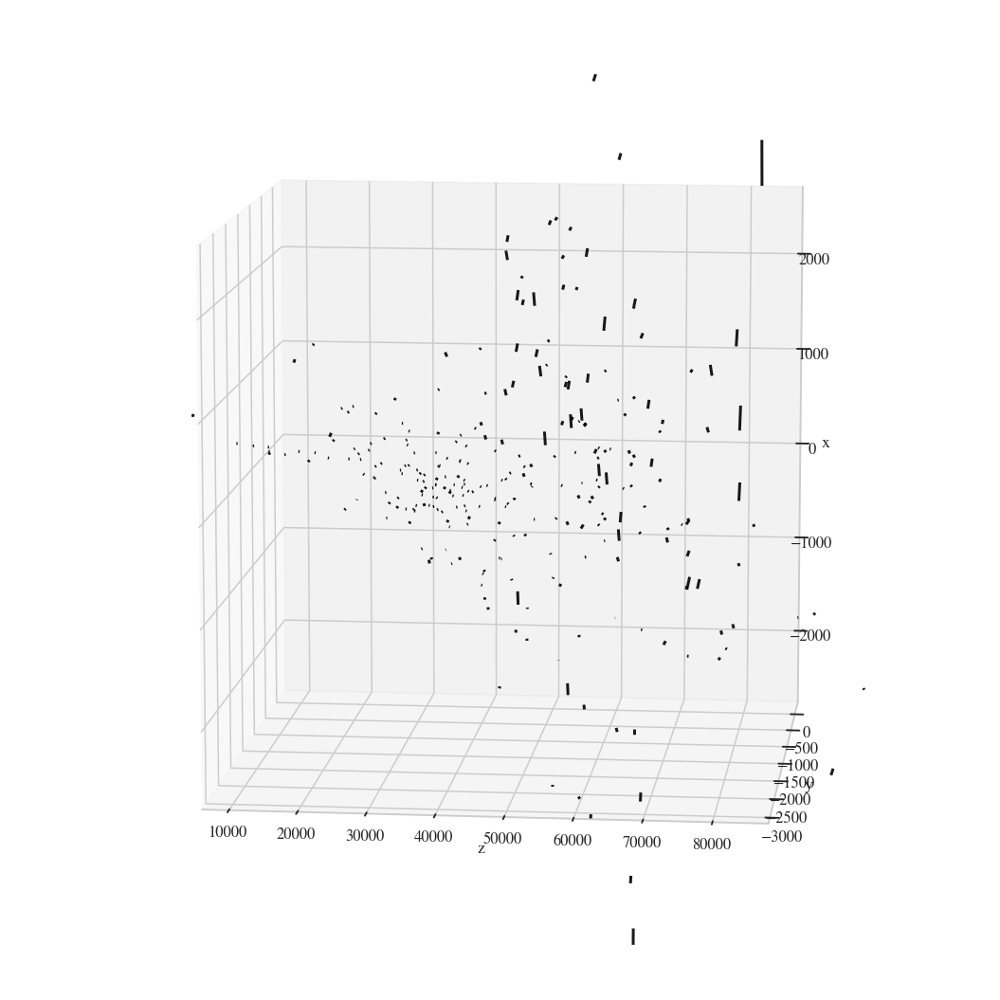

In [78]:
gen_opt = torch.optim.Adam(list(features_nn.parameters()), 
                           lr=1e-4)
disc_opt = torch.optim.RMSprop(list(discriminator_nn.parameters()),
                           lr=5e-4)


loss_average_bces = []
loss_average_gens = []
loss_average_discs = []
loss_mses = []
loss_IP_lefts = []
loss_IP_rights = []
for epoch in tqdm(range(200)):
    #train discriminator
    for i in range(7):
        loss_average_bce, \
        loss_average_gen, \
        loss_average_disc, \
        loss_mse, \
        loss_IP_left, \
        loss_IP_right, gen_showers = train_epoch(model, edge_nn, 
                                    features_nn,
                                    discriminator_nn,
                                    dataset_loader, 
                                    optimizer=disc_opt, 
                                    weights={
                                        'll_bce': 0., 
                                        'll_gen': 0.,
                                        'll_disc': 1.,
                                        'll_mse': 0.,
                                        'll_IP_right': 0.,
                                        'll_IP_left': 0.
                                    }, signal_gen=True)
    
    #train generator
    loss_average_bce, \
        loss_average_gen, \
        loss_average_disc, \
        loss_mse, \
        loss_IP_left, \
        loss_IP_right, gen_showers = train_epoch(model, edge_nn, 
                                    features_nn,
                                    discriminator_nn,
                                    dataset_loader, 
                                    optimizer=gen_opt, 
                                    weights={
                                        'll_bce': 0., 
                                        'll_gen': 1.,
                                        'll_disc': 0.,
                                        'll_mse': 0.,
                                        'll_IP_right': 0.,
                                        'll_IP_left': 0.
                                    }, signal_gen=True)    
    
    loss_average_bces.append(loss_average_bce)
    loss_average_gens.append(loss_average_gen)
    loss_average_discs.append(loss_average_disc)
    loss_mses.append(loss_mse)
    loss_IP_lefts.append(loss_IP_left)
    loss_IP_rights.append(loss_IP_right)
    if (epoch + 1) % 50 == 0:
        torch.save(model.state_dict(), open(PATH + 'graph_nn.pcl', 'wb+'))
        torch.save(edge_nn.state_dict(), open(PATH + 'edge_nn.pcl', 'wb+'))
        torch.save(features_nn.state_dict(), open(PATH + 'features_nn.pcl', 'wb+'))
        torch.save(discriminator_nn.state_dict(), open(PATH + 'discriminator_nn.pcl', 'wb+'))
    if epoch % 1 == 0:
        clear_output()
        plot_graphs({
            'loss_average_bces': loss_average_bces,
            'loss_average_gen': loss_average_gens,
            'loss_average_disc': loss_average_discs,
            'loss_mse': loss_mses,
            'loss_IP_lefts': loss_IP_lefts,
            'loss_IP_rights': loss_IP_rights
        })
        for j in gen_showers:
            tmp_X = j.copy()
            tmp_X *= np.array([1e5, 1e5, 1e5, 1, 1])
            plot_npframe(tmp_X) 

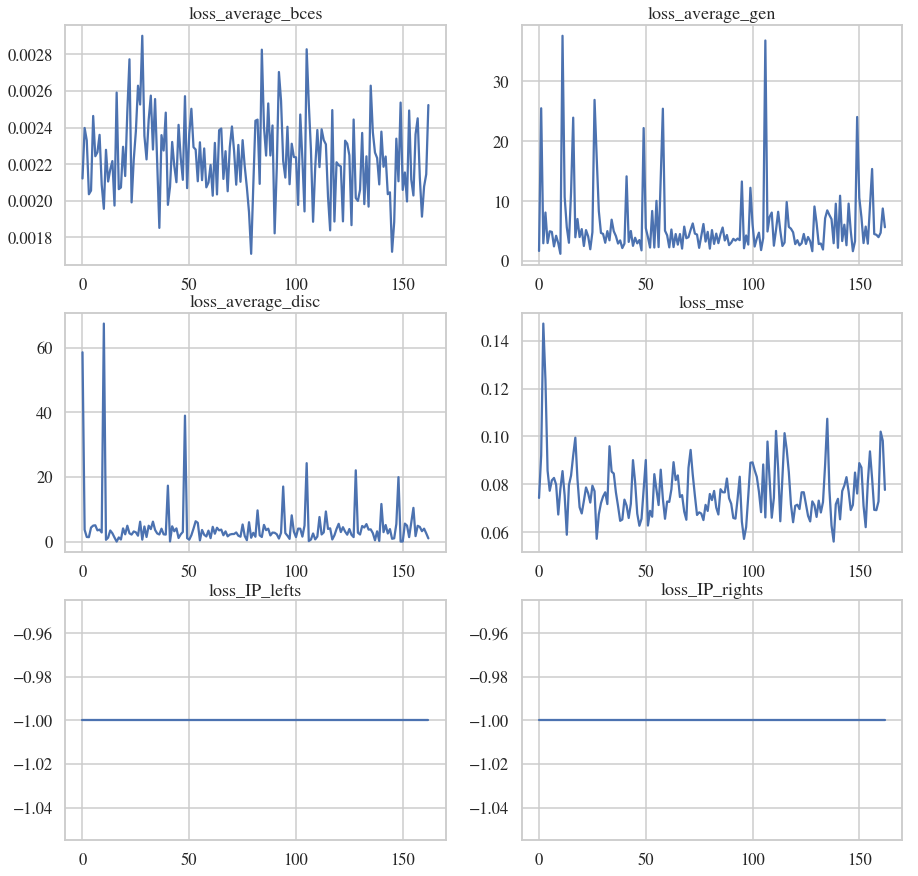

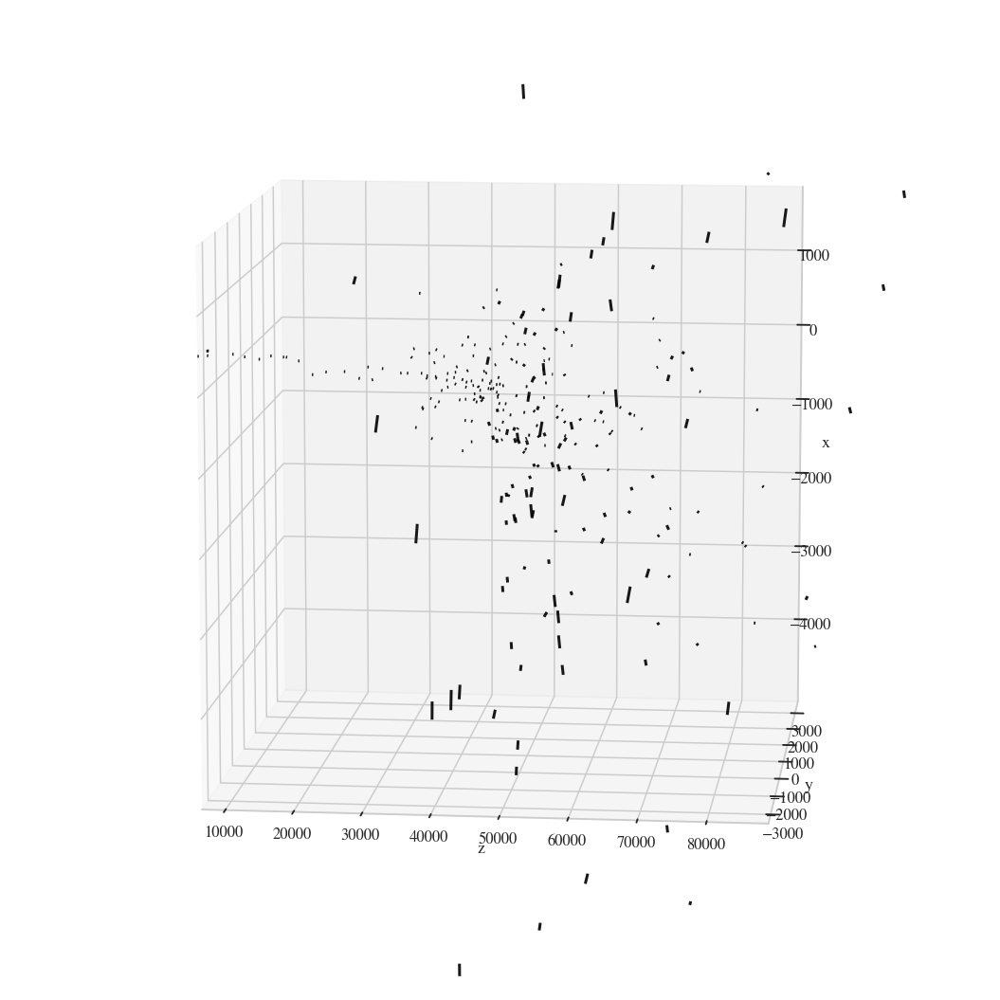

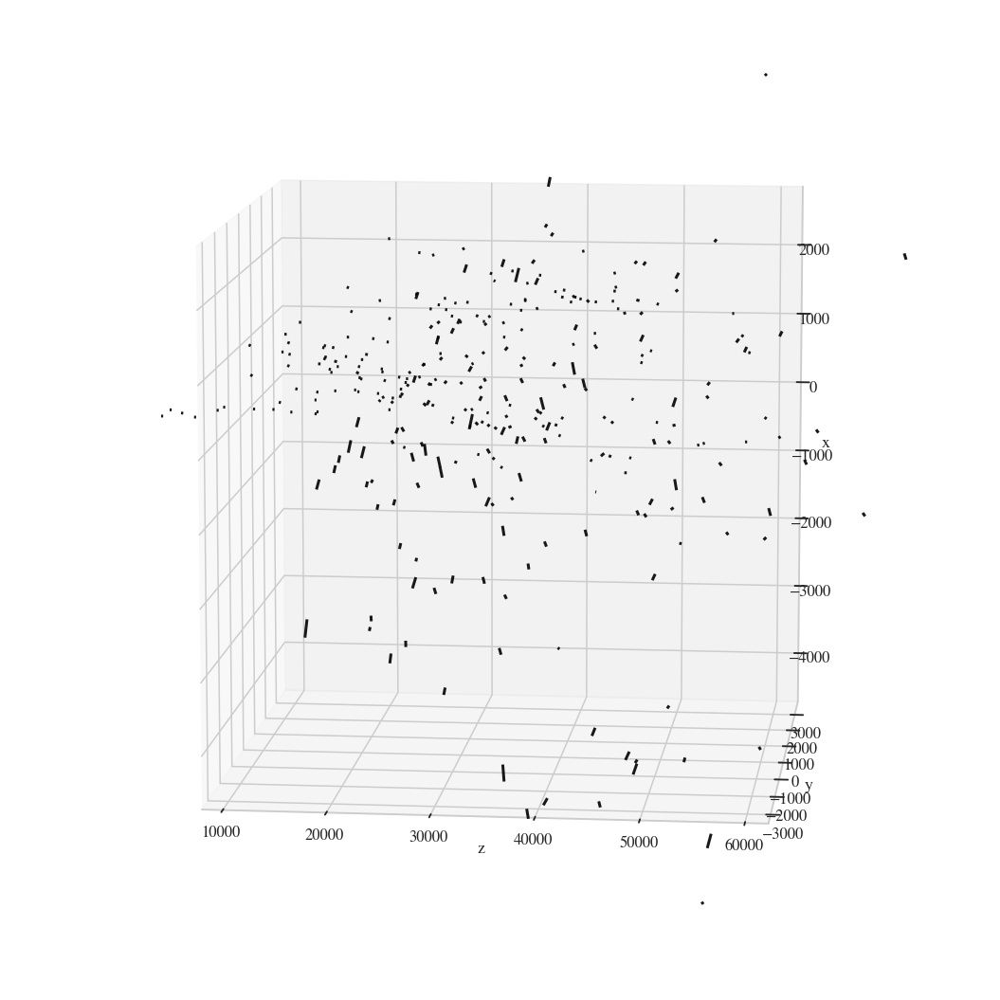

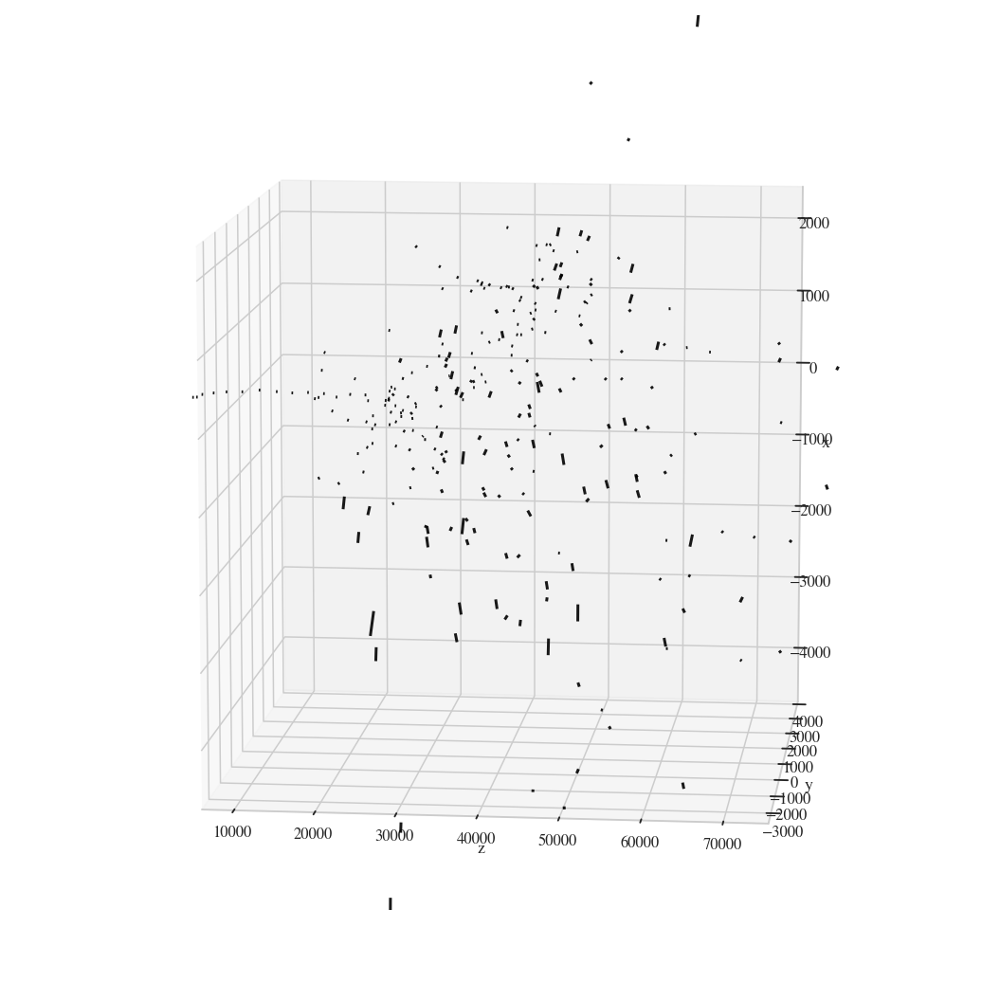

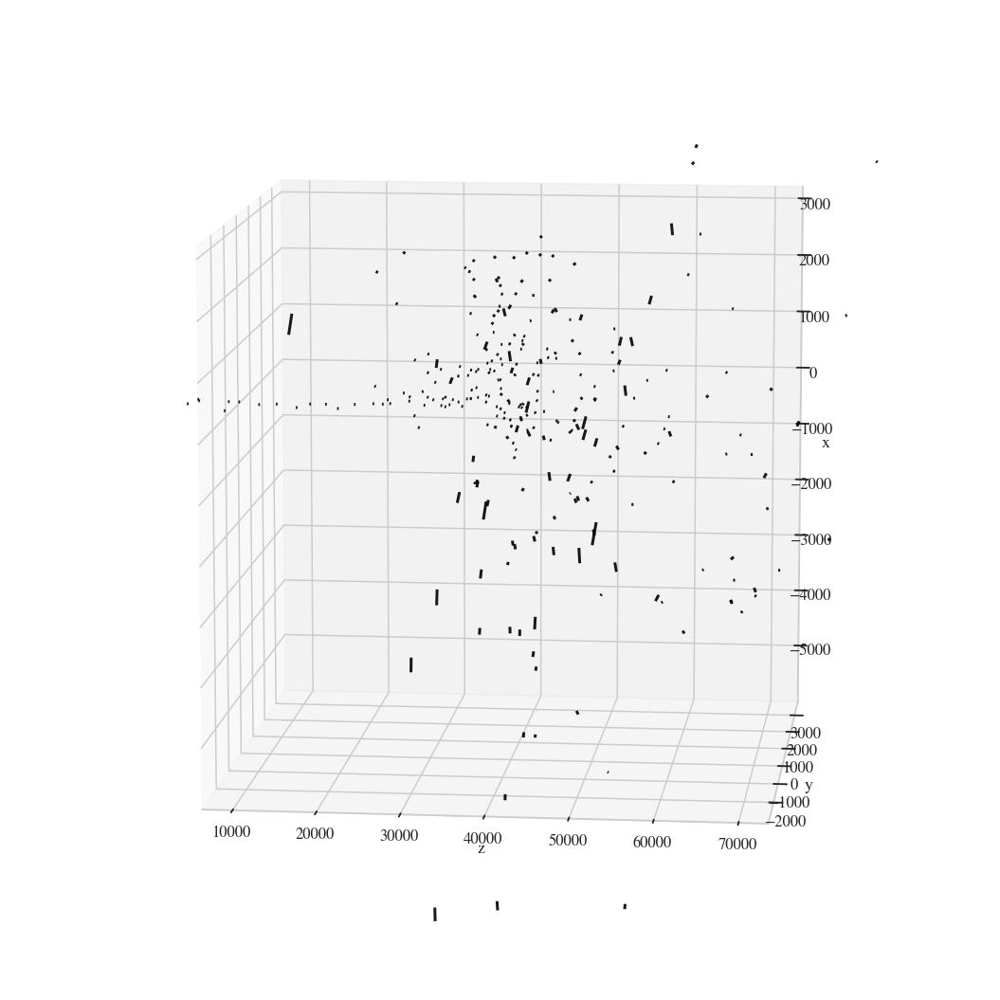

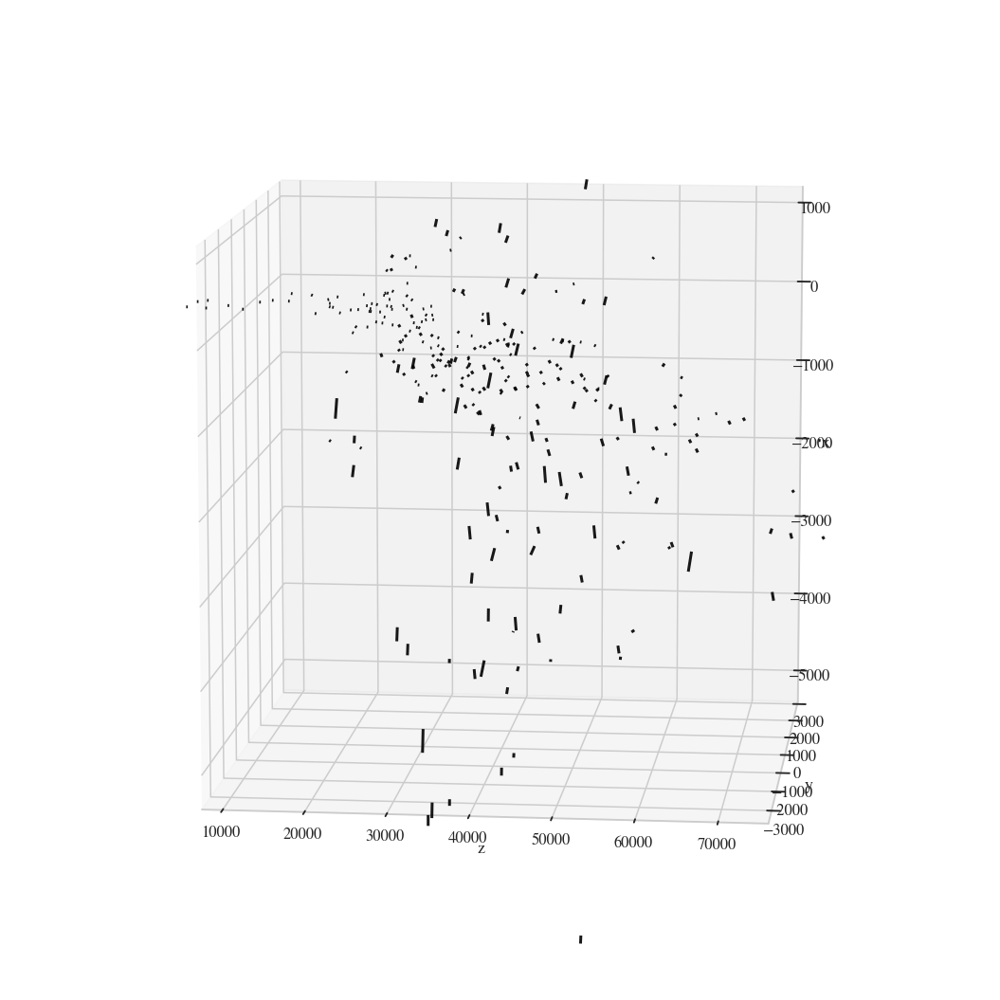

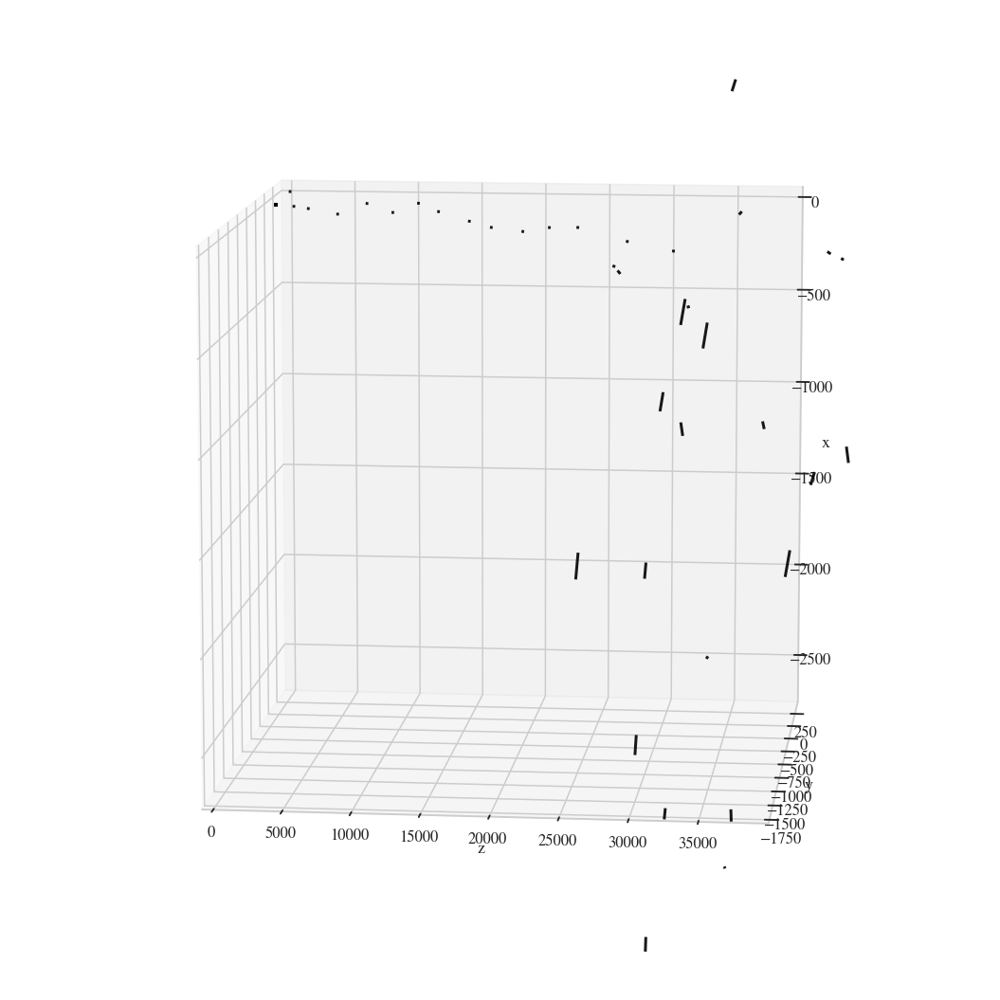

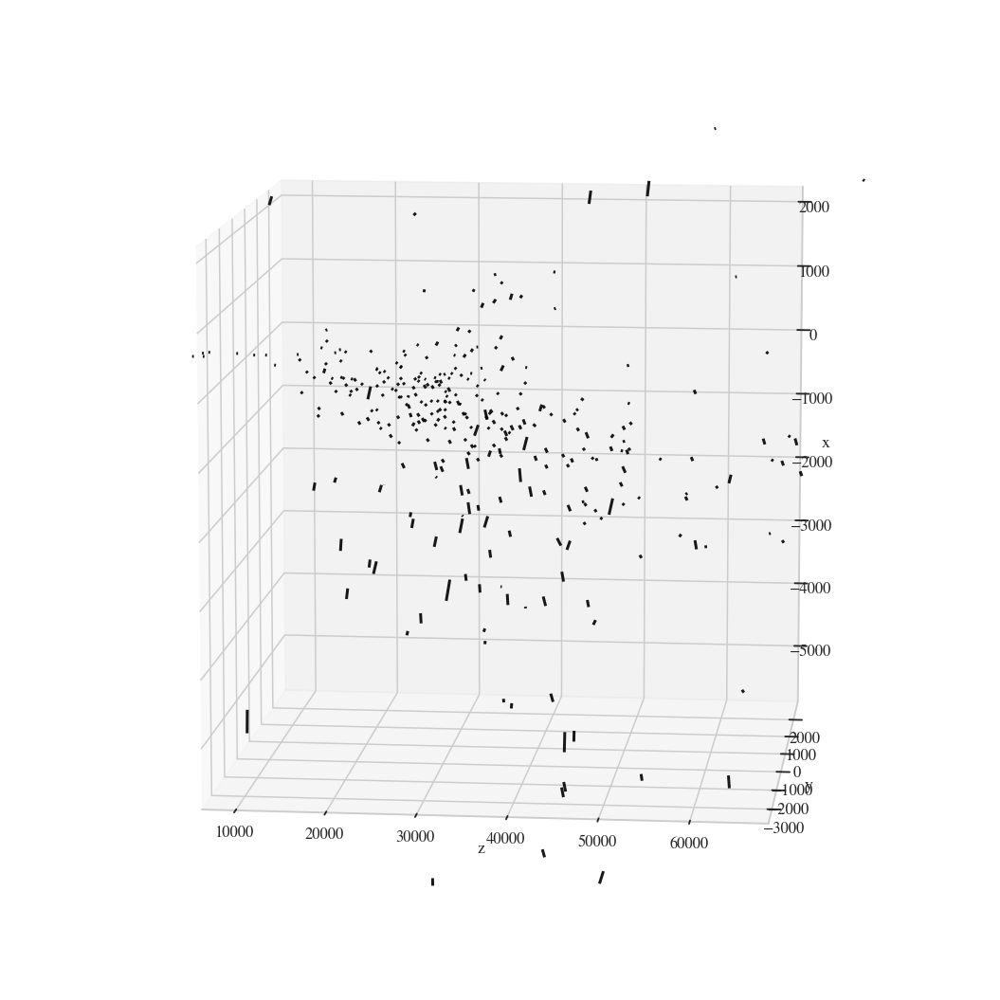

In [ ]:
gen_opt = torch.optim.Adam(list(features_nn.parameters()), 
                           lr=1e-4)
disc_opt = torch.optim.RMSprop(list(discriminator_nn.parameters()),
                           lr=1e-3)


loss_average_bces = []
loss_average_gens = []
loss_average_discs = []
loss_mses = []
loss_IP_lefts = []
loss_IP_rights = []
for epoch in tqdm(range(200)):
    #train discriminator
    for i in range(7):
        loss_average_bce, \
        loss_average_gen, \
        loss_average_disc, \
        loss_mse, \
        loss_IP_left, \
        loss_IP_right, gen_showers = train_epoch(model, edge_nn, 
                                    features_nn,
                                    discriminator_nn,
                                    dataset_loader, 
                                    optimizer=disc_opt, 
                                    weights={
                                        'll_bce': 0., 
                                        'll_gen': 0.,
                                        'll_disc': 1.,
                                        'll_mse': 0.,
                                        'll_IP_right': 0.,
                                        'll_IP_left': 0.
                                    }, signal_gen=True)
    
    #train generator
    loss_average_bce, \
        loss_average_gen, \
        loss_average_disc, \
        loss_mse, \
        loss_IP_left, \
        loss_IP_right, gen_showers = train_epoch(model, edge_nn, 
                                    features_nn,
                                    discriminator_nn,
                                    dataset_loader, 
                                    optimizer=gen_opt, 
                                    weights={
                                        'll_bce': 0., 
                                        'll_gen': 1.,
                                        'll_disc': 0.,
                                        'll_mse': 0.,
                                        'll_IP_right': 0.,
                                        'll_IP_left': 0.
                                    }, signal_gen=True)    
    
    loss_average_bces.append(loss_average_bce)
    loss_average_gens.append(loss_average_gen)
    loss_average_discs.append(loss_average_disc)
    loss_mses.append(loss_mse)
    loss_IP_lefts.append(loss_IP_left)
    loss_IP_rights.append(loss_IP_right)
    if (epoch + 1) % 50 == 0:
        torch.save(model.state_dict(), open(PATH + 'graph_nn.pcl', 'wb+'))
        torch.save(edge_nn.state_dict(), open(PATH + 'edge_nn.pcl', 'wb+'))
        torch.save(features_nn.state_dict(), open(PATH + 'features_nn.pcl', 'wb+'))
        torch.save(discriminator_nn.state_dict(), open(PATH + 'discriminator_nn.pcl', 'wb+'))
    if epoch % 1 == 0:
        clear_output()
        plot_graphs({
            'loss_average_bces': loss_average_bces,
            'loss_average_gen': loss_average_gens,
            'loss_average_disc': loss_average_discs,
            'loss_mse': loss_mses,
            'loss_IP_lefts': loss_IP_lefts,
            'loss_IP_rights': loss_IP_rights
        })
        xs = []
        for j in gen_showers:
            tmp_X = j.copy()
            tmp_X *= np.array([1e5, 1e5, 1e5, 1, 1])
            plot_npframe(tmp_X)
            x = tmp_X[:, 0]
            xs.append(x)
        plt.hist(np.concatenate(xs), bins=50, range=(-1000, 1000), density=True)

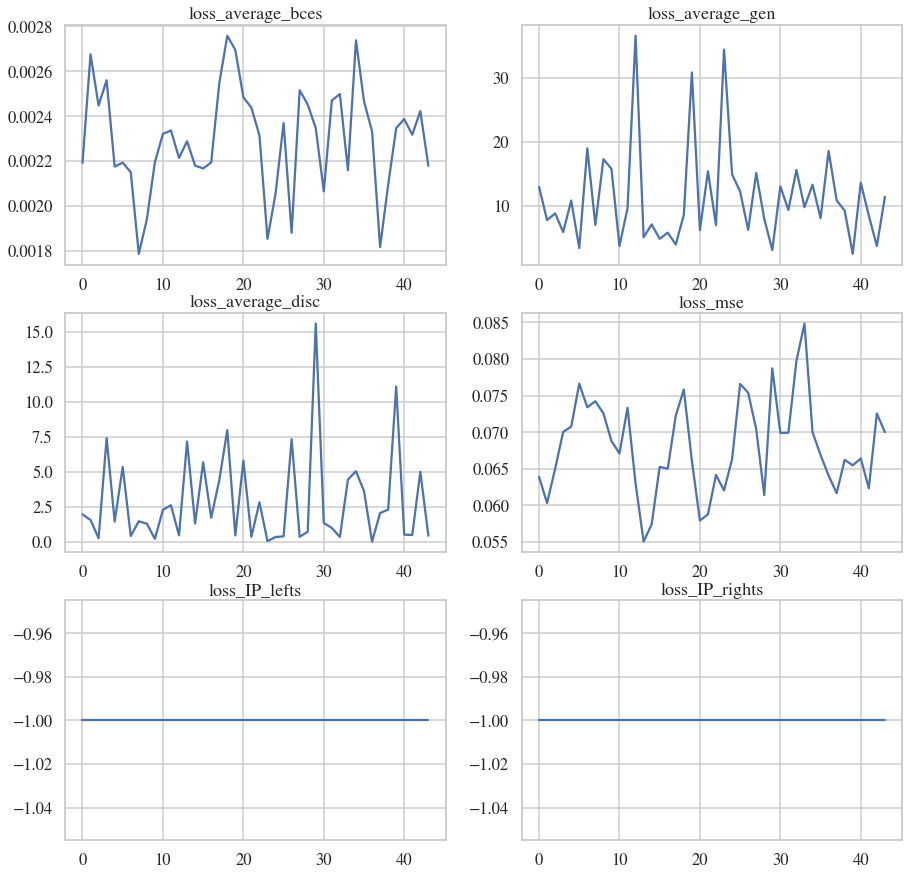

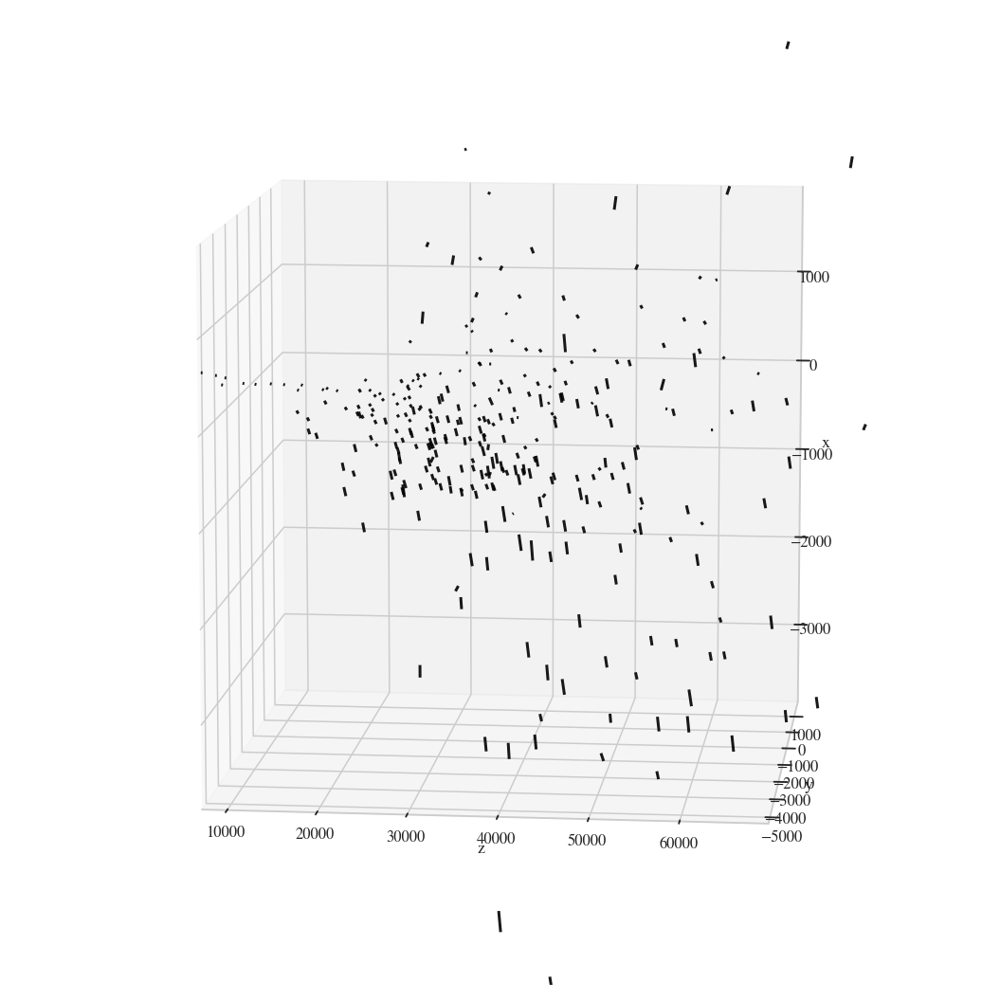

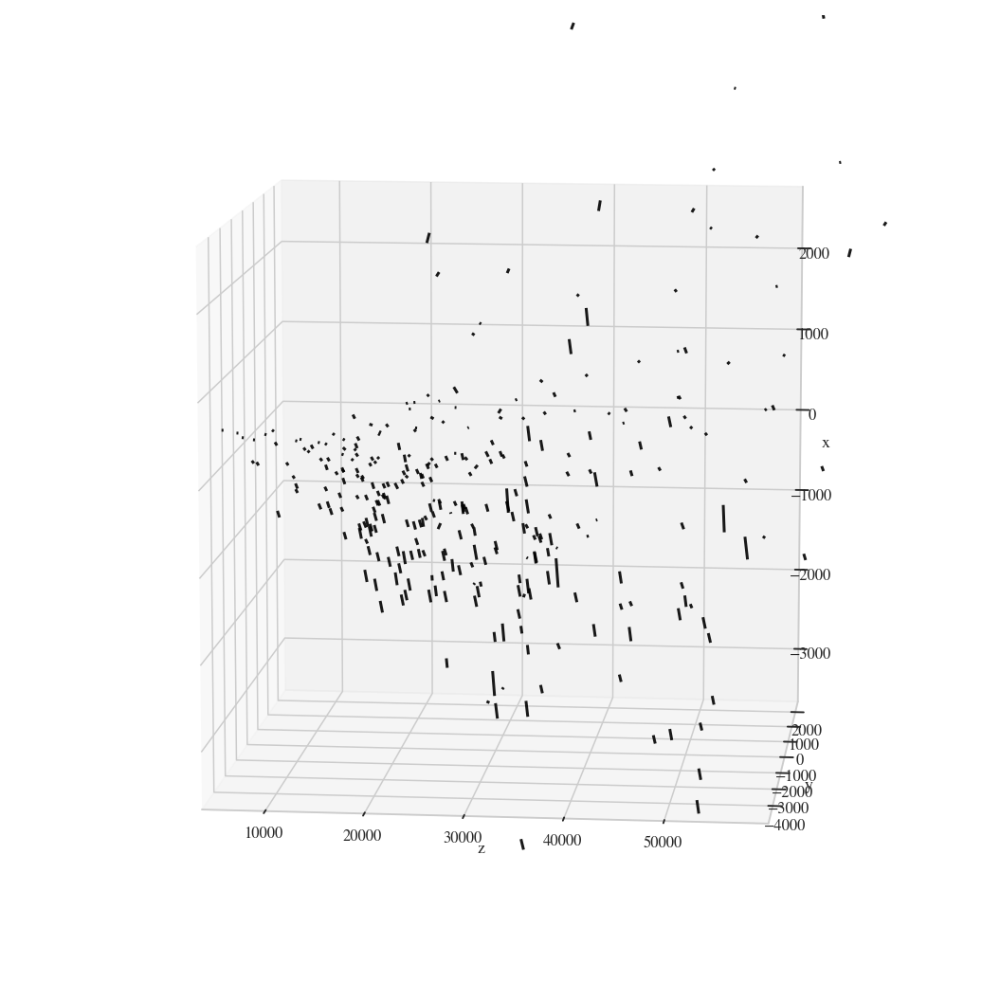

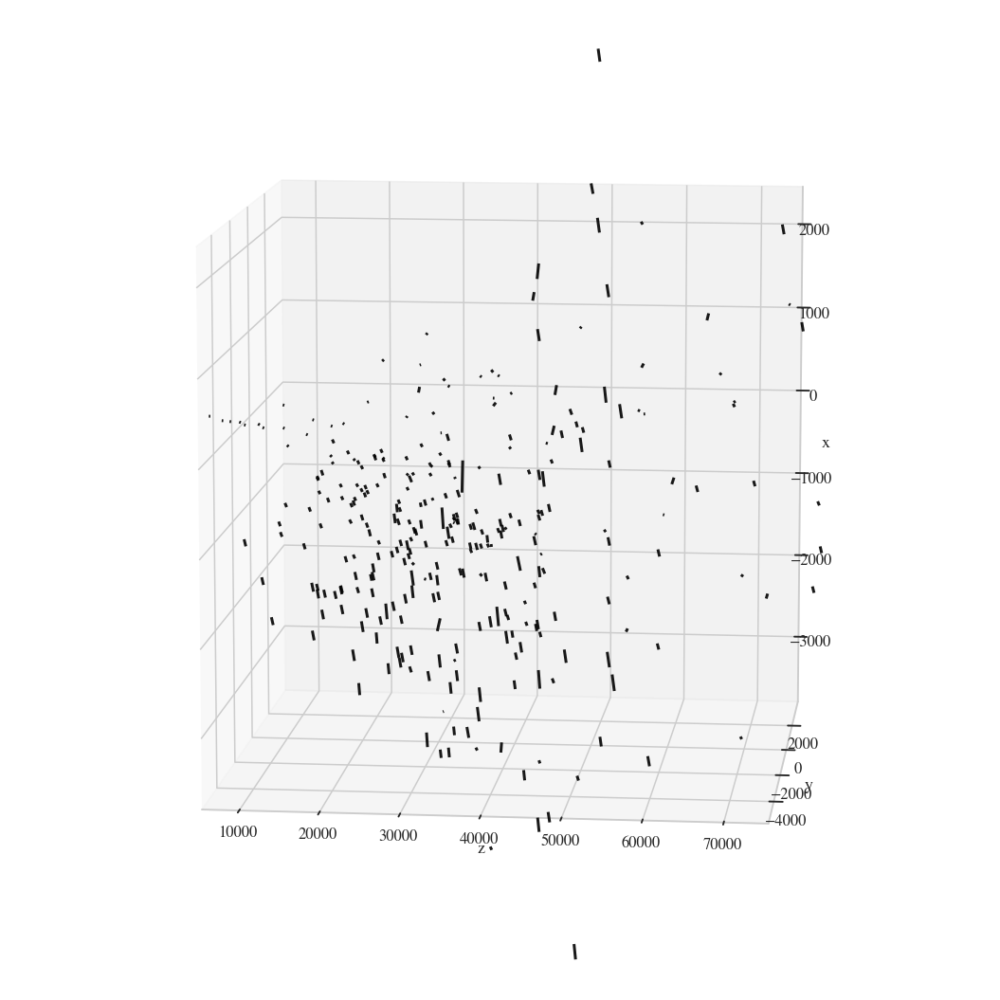

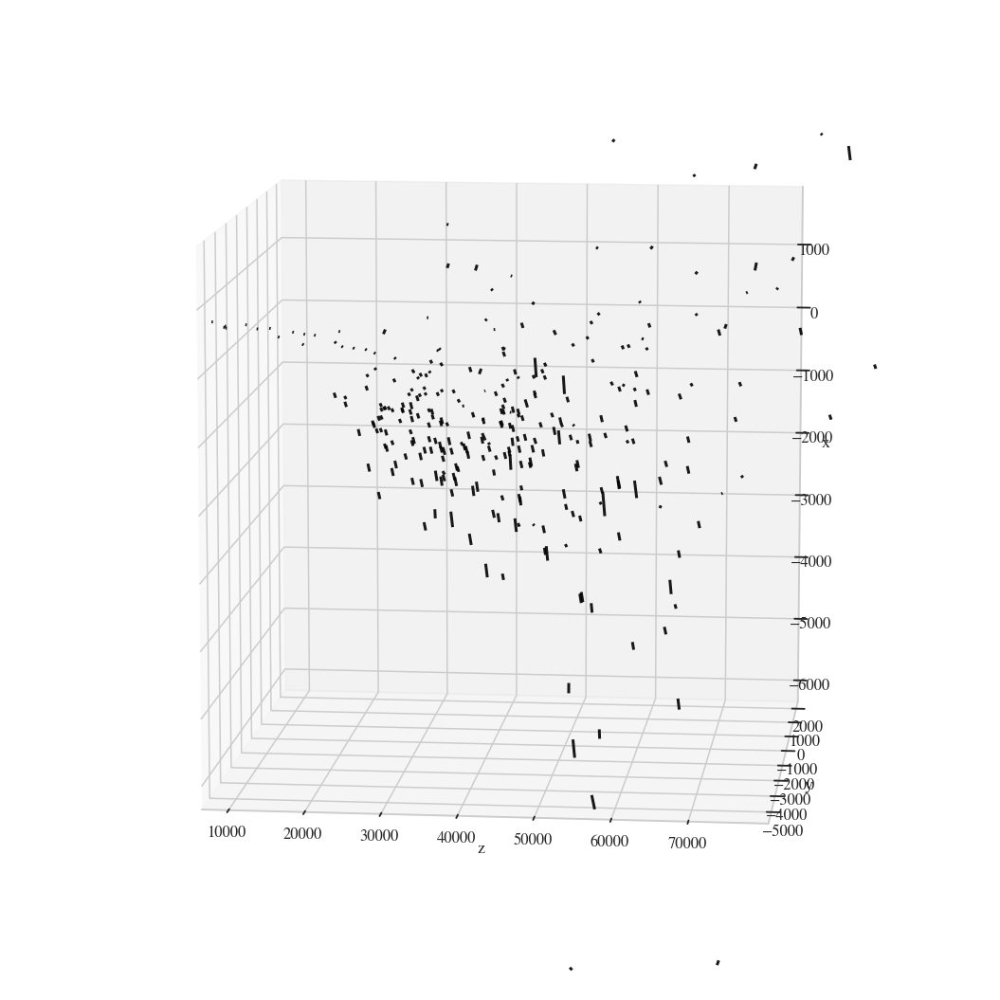

...

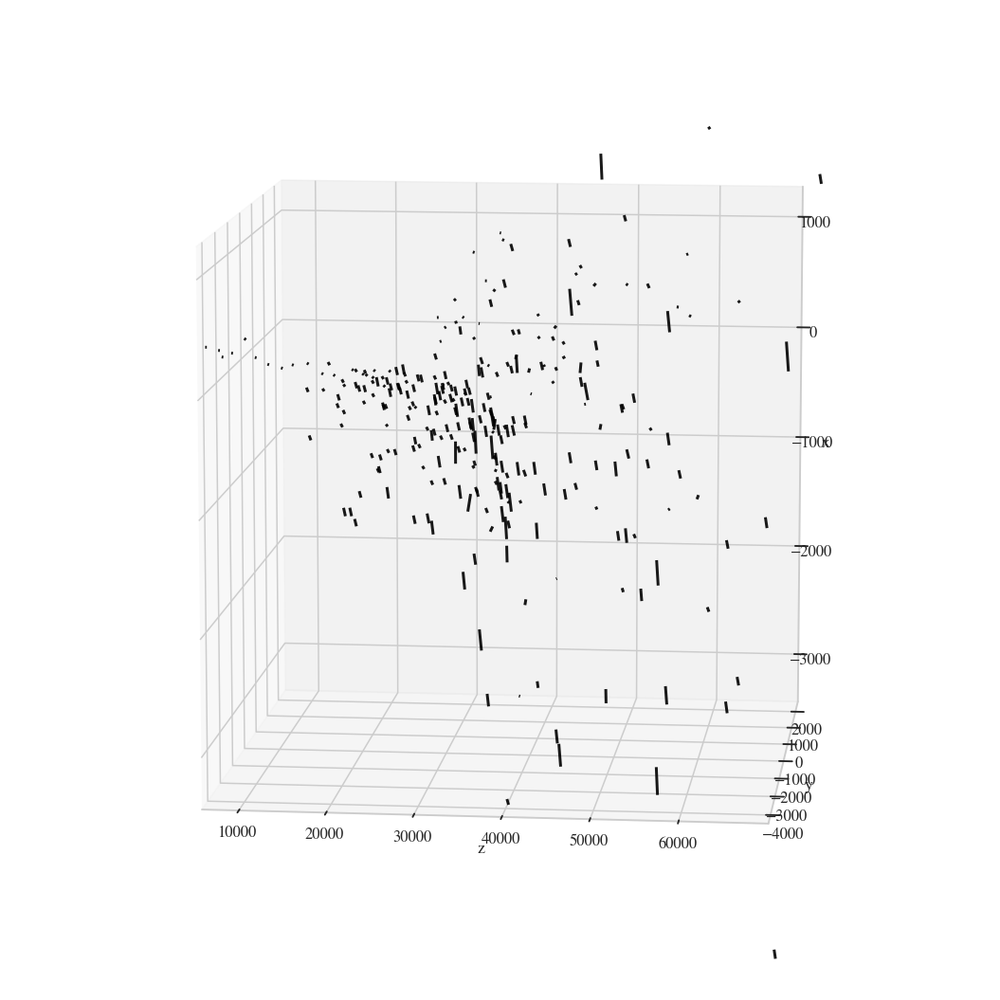

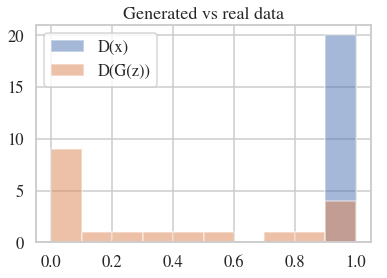

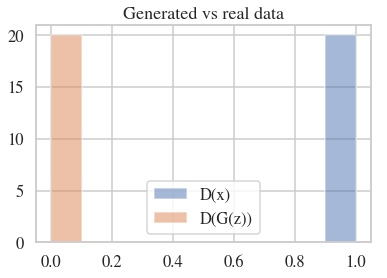

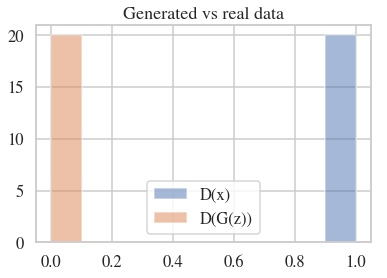

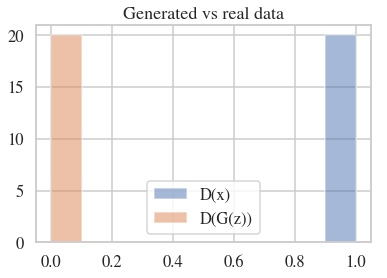

In [ ]:
gen_opt = torch.optim.Adam(list(features_nn.parameters()), 
                           lr=1e-4)
disc_opt = torch.optim.RMSprop(list(discriminator_nn.parameters()),
                           lr=1e-3)


loss_average_bces = []
loss_average_gens = []
loss_average_discs = []
loss_mses = []
loss_IP_lefts = []
loss_IP_rights = []
for epoch in tqdm(range(200)):
    #train discriminator
    for i in range(10):
        loss_average_bce, \
        loss_average_gen, \
        loss_average_disc, \
        loss_mse, \
        loss_IP_left, \
        loss_IP_right, gen_showers = train_epoch(model, edge_nn, 
                                    features_nn,
                                    discriminator_nn,
                                    dataset_loader, 
                                    optimizer=disc_opt, 
                                    weights={
                                        'll_bce': 0., 
                                        'll_gen': 0.,
                                        'll_disc': 1.,
                                        'll_mse': 0.,
                                        'll_IP_right': 0.,
                                        'll_IP_left': 0.
                                    }, signal_gen=True)
    
    #train generator
    loss_average_bce, \
        loss_average_gen, \
        loss_average_disc, \
        loss_mse, \
        loss_IP_left, \
        loss_IP_right, gen_showers = train_epoch(model, edge_nn, 
                                    features_nn,
                                    discriminator_nn,
                                    dataset_loader, 
                                    optimizer=gen_opt, 
                                    weights={
                                        'll_bce': 0., 
                                        'll_gen': 1.,
                                        'll_disc': 0.,
                                        'll_mse': 0.,
                                        'll_IP_right': 0.,
                                        'll_IP_left': 0.
                                    }, signal_gen=True)    
    
    loss_average_bces.append(loss_average_bce)
    loss_average_gens.append(loss_average_gen)
    loss_average_discs.append(loss_average_disc)
    loss_mses.append(loss_mse)
    loss_IP_lefts.append(loss_IP_left)
    loss_IP_rights.append(loss_IP_right)
    if (epoch + 1) % 50 == 0:
        torch.save(model.state_dict(), open(PATH + 'graph_nn.pcl', 'wb+'))
        torch.save(edge_nn.state_dict(), open(PATH + 'edge_nn.pcl', 'wb+'))
        torch.save(features_nn.state_dict(), open(PATH + 'features_nn.pcl', 'wb+'))
        torch.save(discriminator_nn.state_dict(), open(PATH + 'discriminator_nn.pcl', 'wb+'))
    if epoch % 1 == 0:
        clear_output()
        plot_graphs({
            'loss_average_bces': loss_average_bces,
            'loss_average_gen': loss_average_gens,
            'loss_average_disc': loss_average_discs,
            'loss_mse': loss_mses,
            'loss_IP_lefts': loss_IP_lefts,
            'loss_IP_rights': loss_IP_rights
        })
        for j in gen_showers[:10]:
            tmp_X = j.copy()
            tmp_X *= np.array([1e5, 1e5, 1e5, 1, 1])
            plot_npframe(tmp_X)

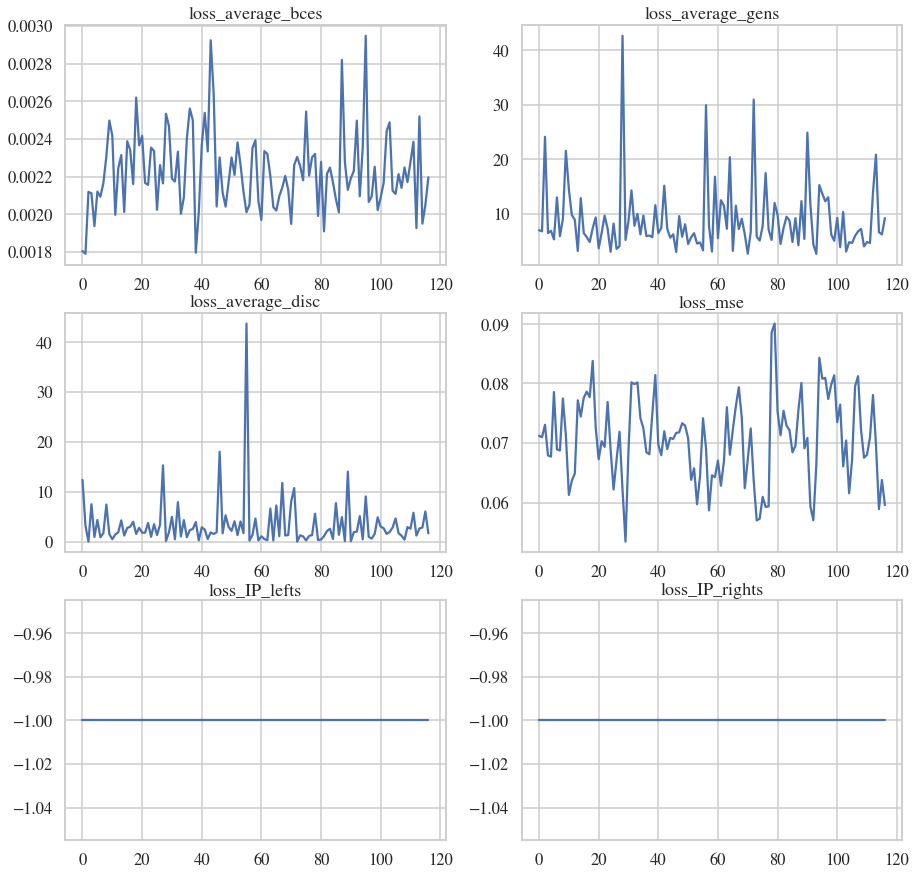

In [92]:
plot_graphs({
            'loss_average_bces': loss_average_bces,
            'loss_average_gens': loss_average_gens,
            'loss_average_disc': loss_average_discs,
            'loss_mse': loss_mses,
            'loss_IP_lefts': loss_IP_lefts,
            'loss_IP_rights': loss_IP_rights
        })

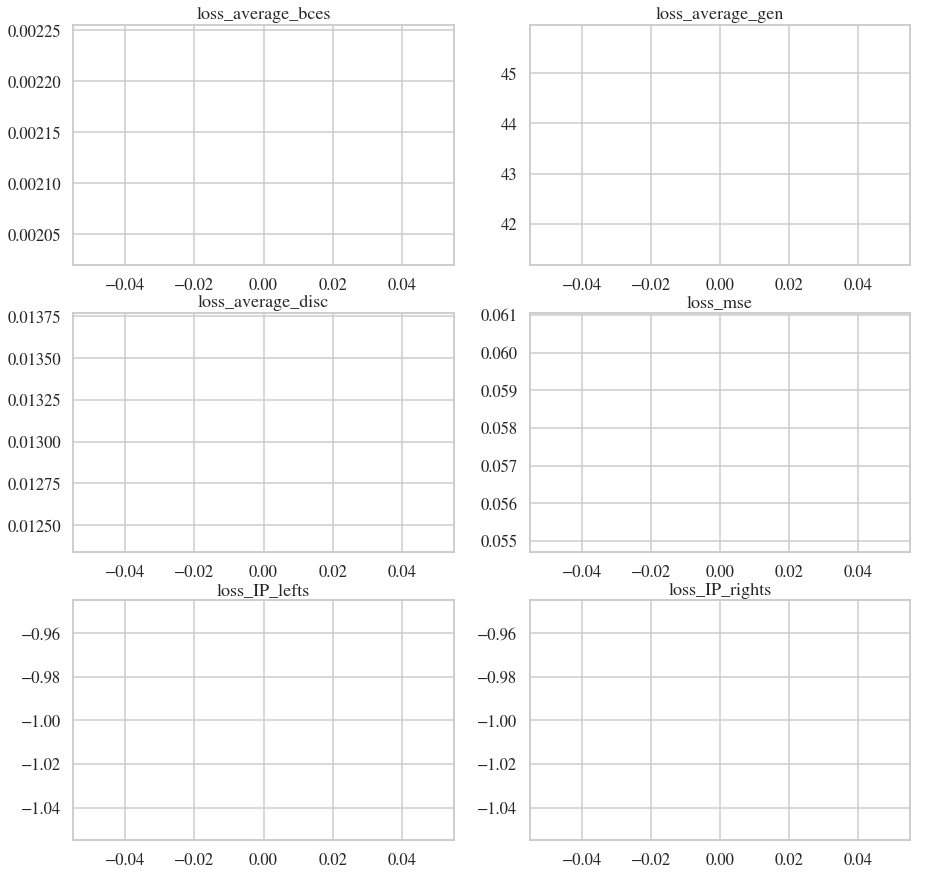

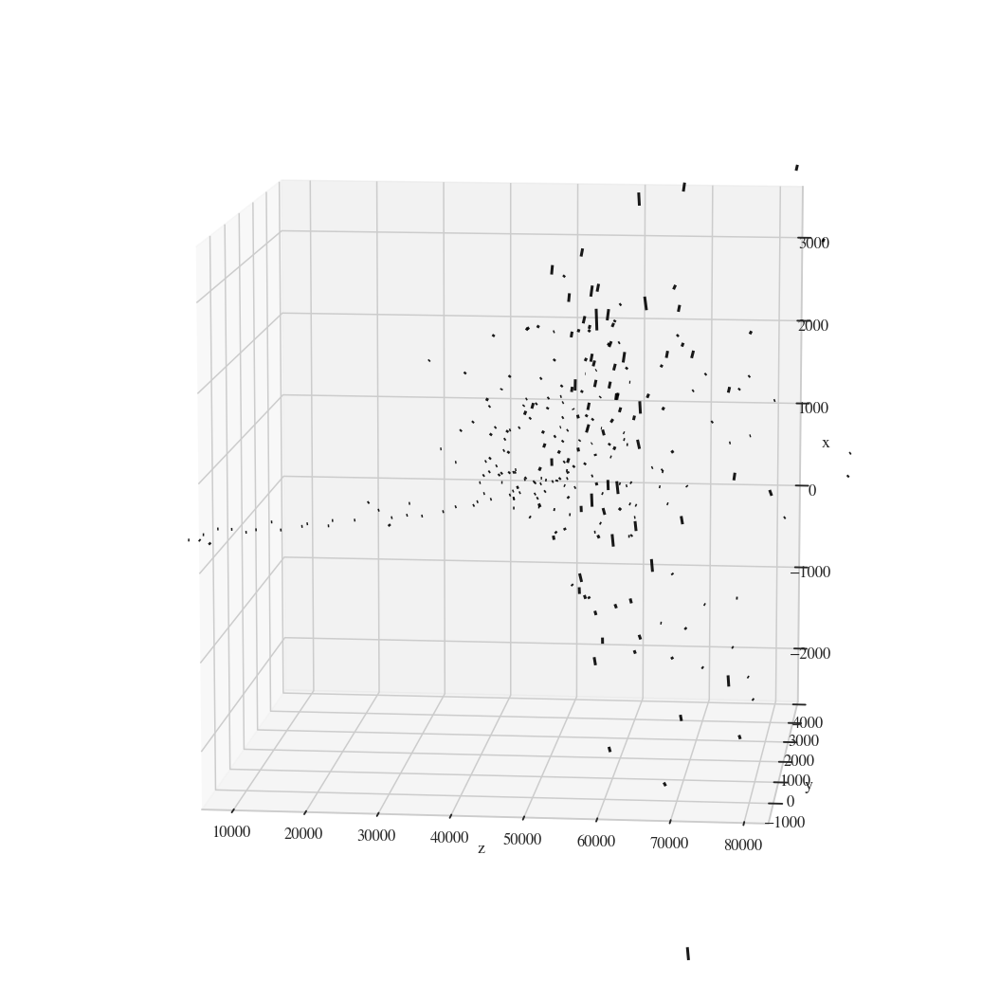

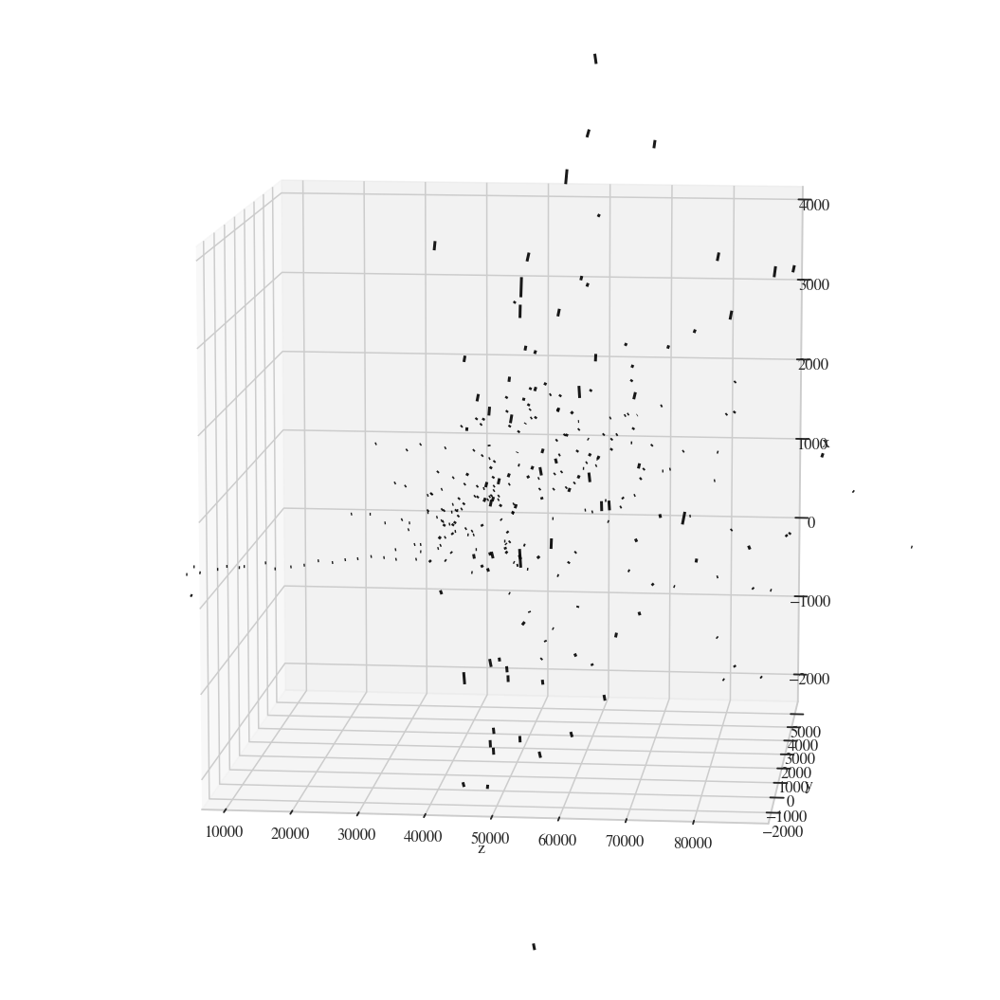

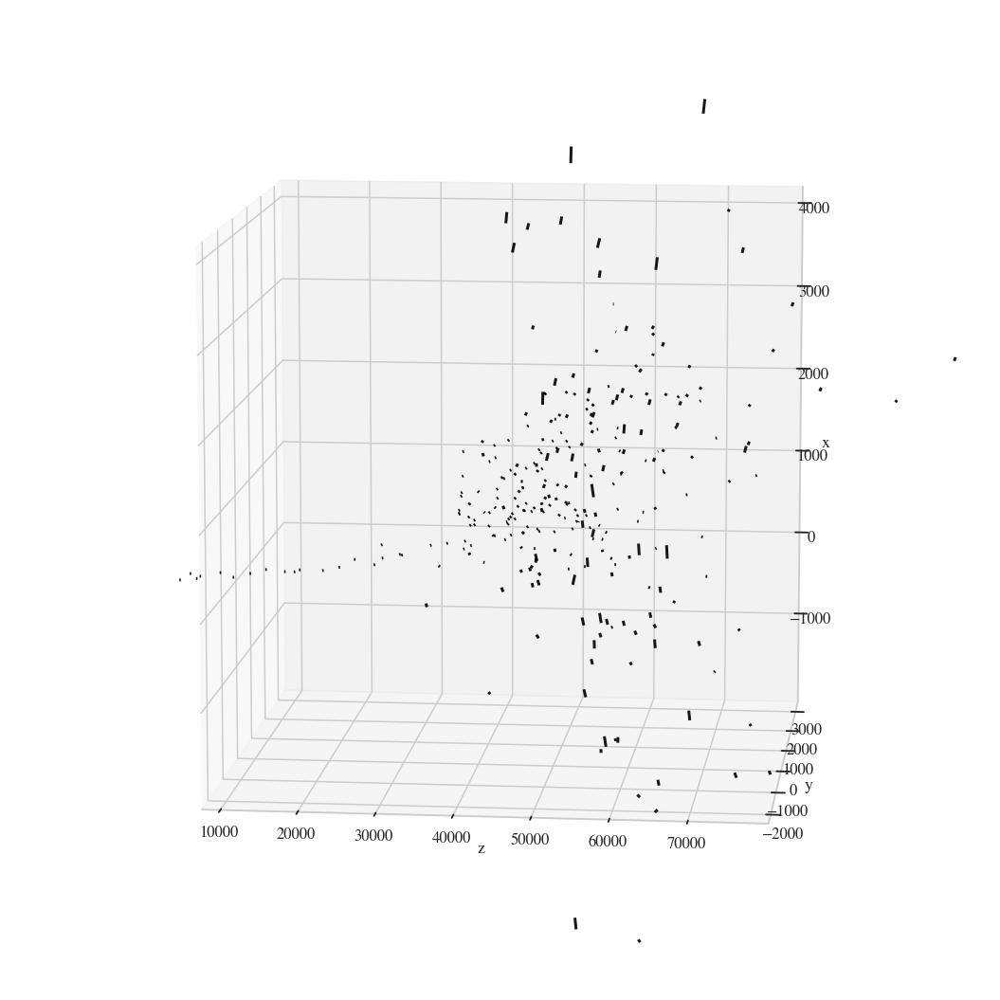

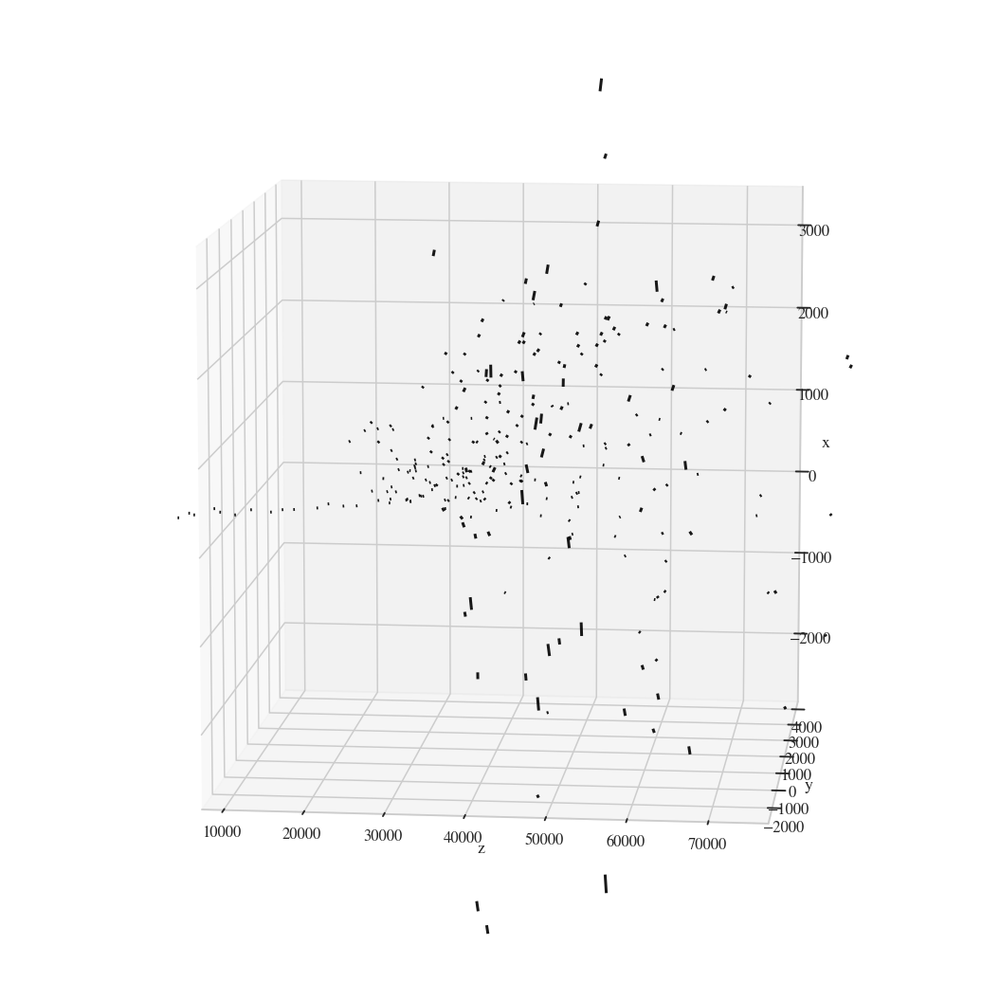

...

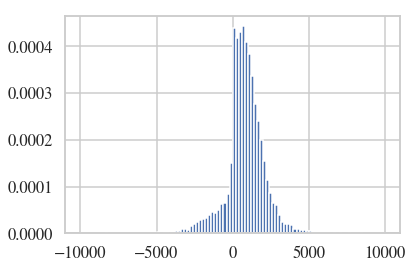

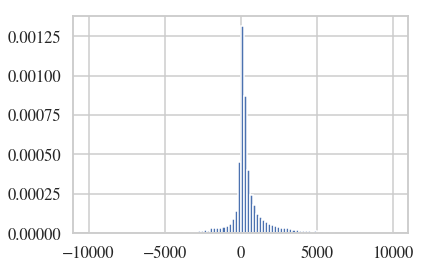

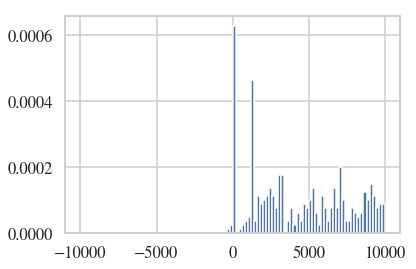

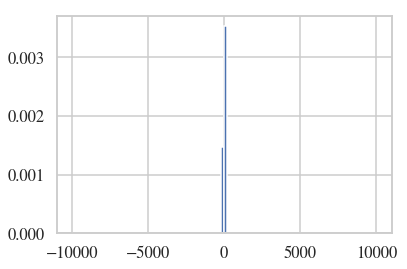

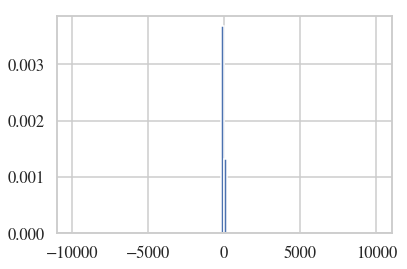

In [111]:
loss_average_bces = []
loss_average_gens = []
loss_average_discs = []
loss_mses = []
loss_IP_lefts = []
loss_IP_rights = []

#train generator
loss_average_bce, \
    loss_average_gen, \
    loss_average_disc, \
    loss_mse, \
    loss_IP_left, \
    loss_IP_right, gen_showers = train_epoch(model, edge_nn, 
                                features_nn,
                                discriminator_nn,
                                dataset_loader, 
                                optimizer=gen_opt, 
                                weights={
                                    'll_bce': 0., 
                                    'll_gen': 0.,
                                    'll_disc': 0.,
                                    'll_mse': 0.,
                                    'll_IP_right': 0.,
                                    'll_IP_left': 0.
                                }, signal_gen=True)    

loss_average_bces.append(loss_average_bce)
loss_average_gens.append(loss_average_gen)
loss_average_discs.append(loss_average_disc)
loss_mses.append(loss_mse)
loss_IP_lefts.append(loss_IP_left)
loss_IP_rights.append(loss_IP_right)
if (epoch + 1) % 50 == 0:
    torch.save(model.state_dict(), open(PATH + 'graph_nn.pcl', 'wb+'))
    torch.save(edge_nn.state_dict(), open(PATH + 'edge_nn.pcl', 'wb+'))
    torch.save(features_nn.state_dict(), open(PATH + 'features_nn.pcl', 'wb+'))
    torch.save(discriminator_nn.state_dict(), open(PATH + 'discriminator_nn.pcl', 'wb+'))
clear_output()
plot_graphs({
    'loss_average_bces': loss_average_bces,
    'loss_average_gen': loss_average_gens,
    'loss_average_disc': loss_average_discs,
    'loss_mse': loss_mses,
    'loss_IP_lefts': loss_IP_lefts,
    'loss_IP_rights': loss_IP_rights
})
xs = []
ys= []
zs= []
thetaxs= []
thetays= []
for j in gen_showers:
    tmp_X = j.copy()
    tmp_X *= np.array([1e5, 1e5, 1e5, 1, 1])
    plot_npframe(tmp_X)
    x = tmp_X[:, 0]
    xs.append(x)
    y = tmp_X[:, 1]
    ys.append(y)
    z = tmp_X[:, 2]
    zs.append(z)
    thetax = tmp_X[:, 3]
    thetaxs.append(thetax)
    thetay = tmp_X[:, 4]
    thetays.append(thetay)
plt.hist(np.concatenate(xs), bins=100, range=(-10000, 10000), density=True)
plt.show()
plt.hist(np.concatenate(ys), bins=100, range=(-10000, 10000), density=True)
plt.show()
plt.hist(np.concatenate(zs), bins=100, range=(-10000, 10000), density=True)
plt.show()
plt.hist(np.concatenate(thetaxs), bins=100, range=(-10000, 10000), density=True)
plt.show()
plt.hist(np.concatenate(thetays), bins=100, range=(-10000, 10000), density=True)
plt.show()

In [93]:
loss_mses[-1]

0.05958500117063523

In [94]:
loss_average_bces[-1]

0.002195709318984882

## Generate graph

In [99]:
def get_graph(adj):
    '''
    get a graph from zero-padded adj
    :param adj:
    :return:
    '''
    # remove all zeros rows and columns
    adj = adj[~np.all(adj == 0, axis=1)]
    adj = adj[:, ~np.all(adj == 0, axis=0)]
    
    adj = np.asmatrix(adj)
    G = nx.from_numpy_matrix(adj)
    return G

def generate_graph(model, edge_nn, max_prev_node, test_batch_energies, device):
    test_batch_size = test_batch_energies.shape[0]
    
    # hidden_state = [num_layers, batch_size, hidden_size]
    model.eval()
    edge_nn.eval()
    features_nn.eval()
    discriminator_nn.eval()

    # generate graphs
    max_num_node = 400
    
    # предсказания нейронки сэмплированные с помощью бернулли
    # y_pred = [batch_size, seq_length, max_nodes]
    y_pred_long = torch.ones(test_batch_size, 
                             max_num_node, 
                             max_prev_node).to(device) # discrete prediction
    
    # x_step = [batch_size, 1, max_nodes]
    # x_step = [batch_size, seq_length, max_nodes]
    # seq_length == 1
    model.hidden = model.init_hidden(test_batch_energies, test_batch_size)
    x_step = torch.ones(test_batch_size, 1, max_prev_node).to(device)
    embs = []
    for i in tqdm(range(max_num_node)):
        # output_raw_emb, output_raw, output_len
        # h = [test_batch, seq_length, output_size] # seq_length = 1
        emb, h, _ = model(x_step)
        embs.append(emb)
        # hidden_state = [num_layers, batch_size, hidden_size]
        hidden_null = 0.001*torch.randn(edge_nn.num_layers - 1, h.size(0), h.size(2)).to(device)
        edge_nn.hidden = torch.cat((h.permute(1, 0, 2), hidden_null), dim=0)  # num_layers, batch_size, hidden_size
        # sampling x_step from output h
        x_step = torch.zeros(test_batch_size, 1, max_prev_node).to(device)
        output_x_step = torch.ones(test_batch_size, 1, 1).to(device)
        for j in range(max_prev_node):
            # edge_emb = [batch_size, seq_length, hidden_size]
            # output_y_pred_step = [batch_size, seq_length, 1]
            edge_emb, output_y_pred_step, _ = edge_nn(output_x_step)
            # if j: edges_emb.append(edge_emb)
            if j < i + 1:
#                 print(output_y_pred_step)
#                 print(torch.sigmoid( F.softmax(output_y_pred_step /1, dim=-1)))
#                  output_x_step = Bernoulli(probs=torch.sigmoid(output_y_pred_step)).sample()
                output_x_step = Bernoulli(probs=F.softmax(output_y_pred_step /0.5, dim=-1)).sample()
                x_step[:, :, j:j+1] = output_x_step
            # edge_nn.hidden = hidden.data
        y_pred_long[:, i:i + 1, :] = x_step
    # TODO: need?
    emb, h, _ = model(x_step)
    embs.append(emb)
    embs = torch.cat(embs, dim=1)
    
    y_pred_long_data = y_pred_long.data.long()
    
    # save graphs as pickle
    # edges_emb = torch.cat(edges_emb, dim=1).view(test_batch_size, max_num_node, -1)
    # edges_emb = torch.cat([torch.ones(test_batch_size, 1, edges_emb.shape[2]).to(device), edges_emb], dim=1)
    
    showers = []
    
    for i in tqdm(range(test_batch_size)):
        #plt.figure(figsize=(12, 8))
        #plt.imshow(y_pred_long_data[i].detach().cpu().numpy().T)
        #plt.show()
        adj_pred = decode_adj(y_pred_long_data[i].detach().cpu().numpy())
        emb = embs[i]
        # G_pred = get_graph(adj_pred) # get a graph from zero-padded adj
        G_pred = nx.from_numpy_matrix(adj_pred) # get a graph from zero-padded adj
        G_pred = nx.bfs_tree(G_pred, 0)
        adj_pred = nx.adjacency_matrix(G_pred).toarray()
        nodes = list(G_pred.nodes())
        emb = emb[nodes]
        G_pred = nx.DiGraph(adj_pred)
        
        # TODO: clean from nodes with 0 degree
        # for nodes with 
        node_in_degree = list(G_pred.in_degree())
        node_in_degree = sorted(node_in_degree, key=lambda x: x[0])
        node_in_degree = torch.tensor([nid[1] for nid in node_in_degree], dtype=torch.float32).to(device).view(-1, 1)

        node_out_degree = list(G_pred.out_degree())
        node_out_degree = sorted(node_out_degree, key=lambda x: x[0])
        node_out_degree = torch.tensor([nod[1] for nod in node_out_degree], dtype=torch.float32).to(device).view(-1, 1)
        
        if len(G_pred) <= 1: # TODO: is it correct?
            print('fuu')
            continue
        # pos = nx.layout.kamada_kawai_layout(G_pred)
        # nx.draw_networkx(G_pred, pos)
        # plt.show()
        
        edges = list(nx.bfs_edges(G_pred, 0))
        
        adj_out = torch.index_select(torch.LongTensor(np.array(edges).T).to(device), 0, torch.LongTensor([1, 0]).to(device))
#         adj_out = torch.LongTensor(np.array(edges).T).to(device)
        

        print(emb.shape[0])
        shower_t = torch_geometric.data.Batch(x=torch.cat([emb, node_in_degree, node_out_degree], dim=1), 
                                             edge_index=adj_out).to(device)
        
        # GCN to recover shower features
        x, edge_index, batch = features_nn.forward(shower_t)
        # x = features_nn.get_distr(shower_t); return x
        predictions = torch.zeros(len(shower_t.x), 5).to(device)
        for i, (k, j) in enumerate(shower_t.edge_index.t()):
            predictions[j] = predictions[k] + x[i]

        showers.append(predictions.cpu().detach().numpy())

    return showers

In [100]:
g = generate_graph(model=model, 
                   edge_nn=edge_nn,
                   max_prev_node=max_prev_node, 
                   test_batch_energies=0.1*torch.randn(5,1).to(device), 
                   device=device)

401
401
401
401
401


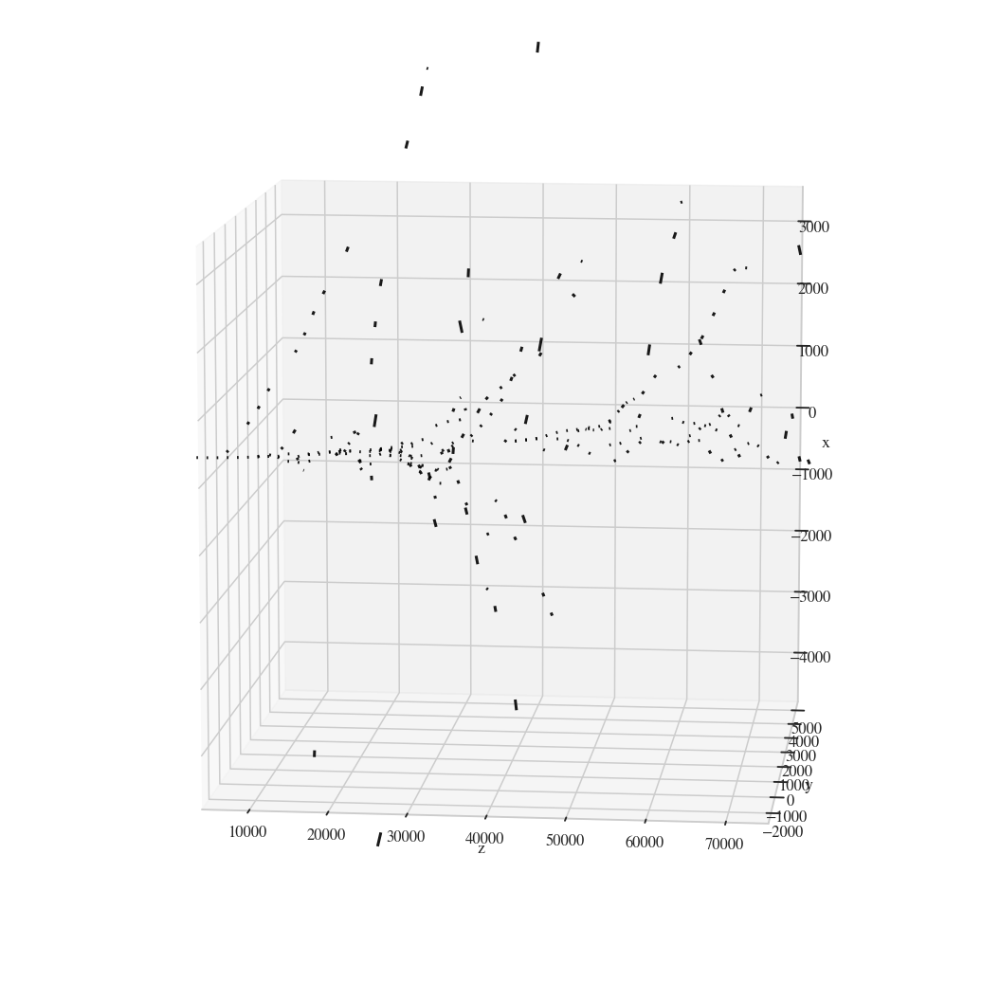

In [39]:
plot_npframe(np.array(shower.x))

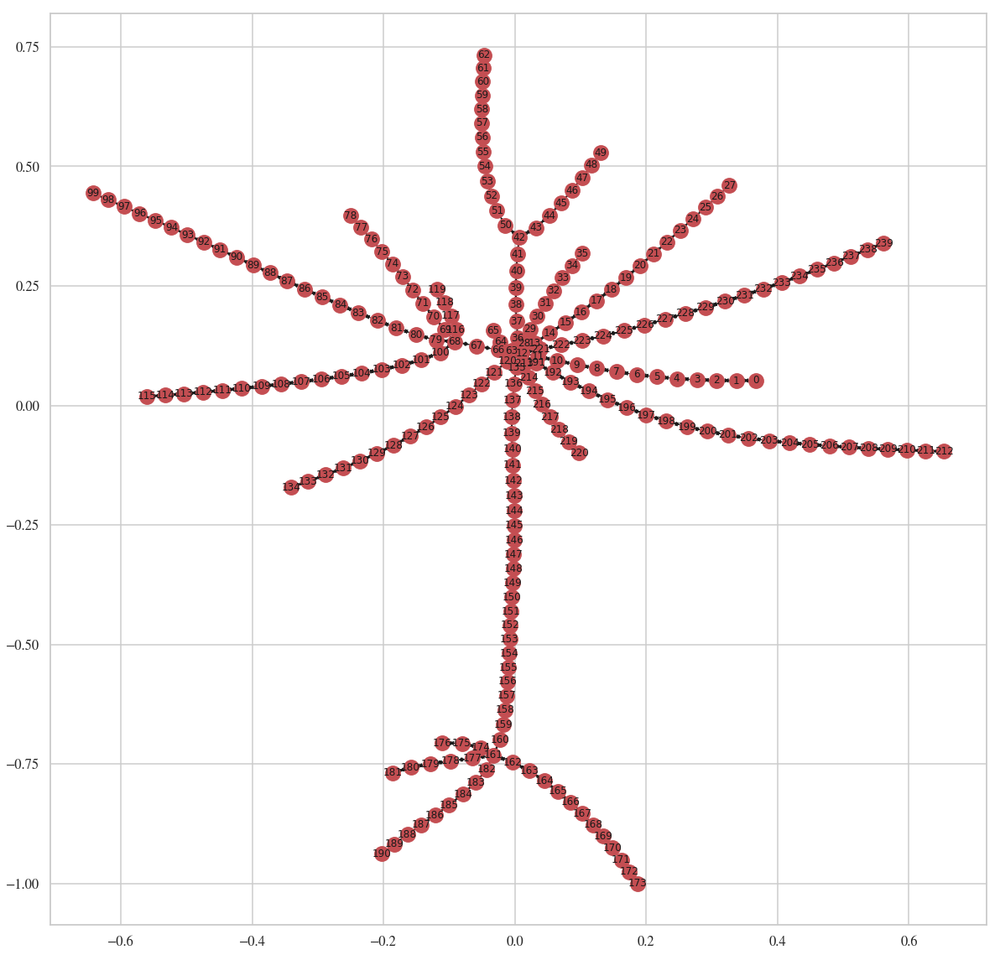

In [52]:
G = nx.from_numpy_matrix(shower[2].adj)
G = nx.DiGraph(G)
plt.figure(figsize=(20, 20))
pos = nx.drawing.layout.kamada_kawai_layout(G)
nx.draw_networkx(G, pos)
plt.autoscale(tight=True)
plt.show()

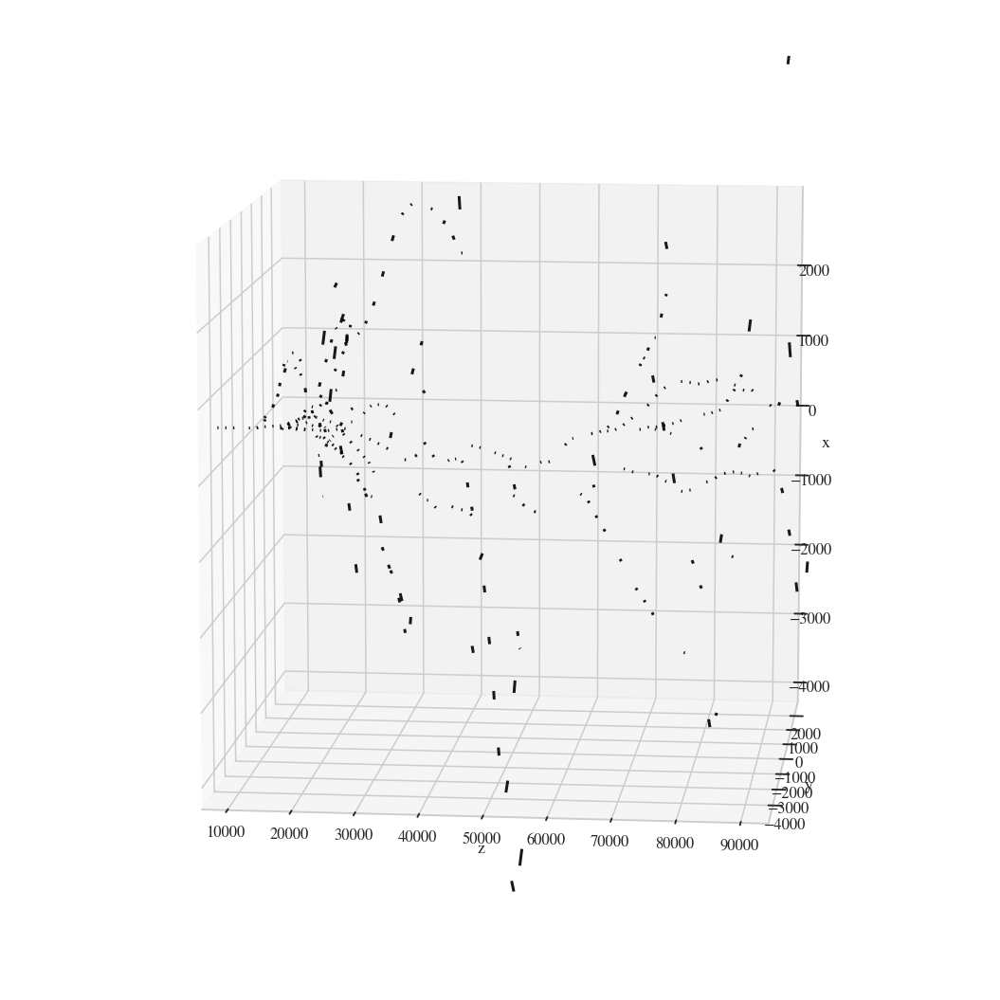

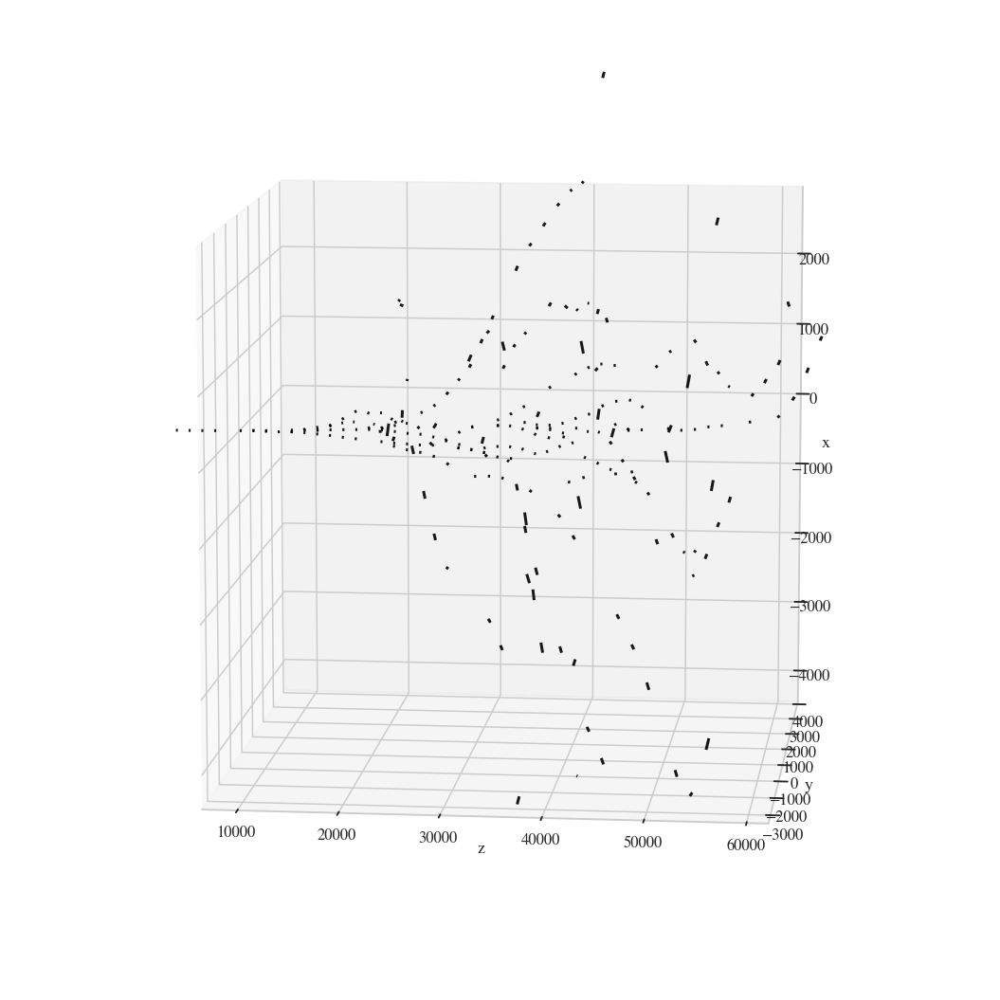

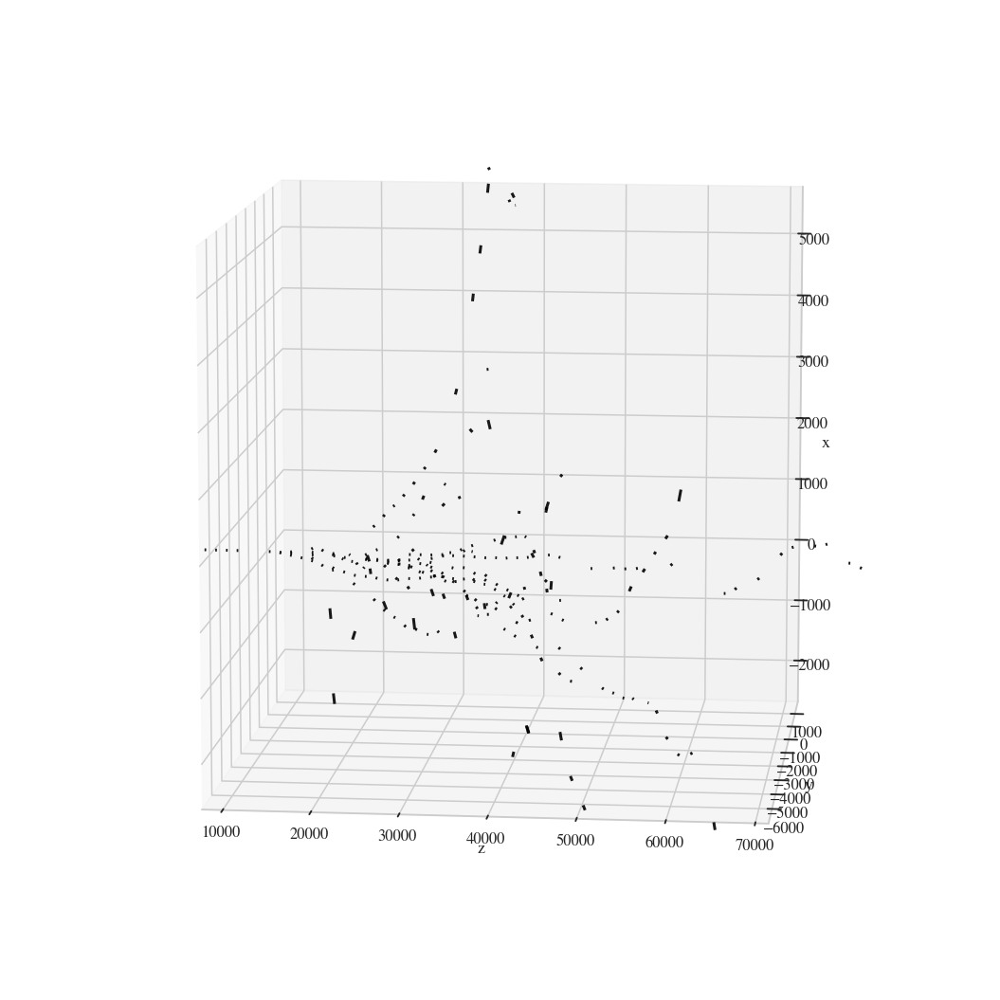

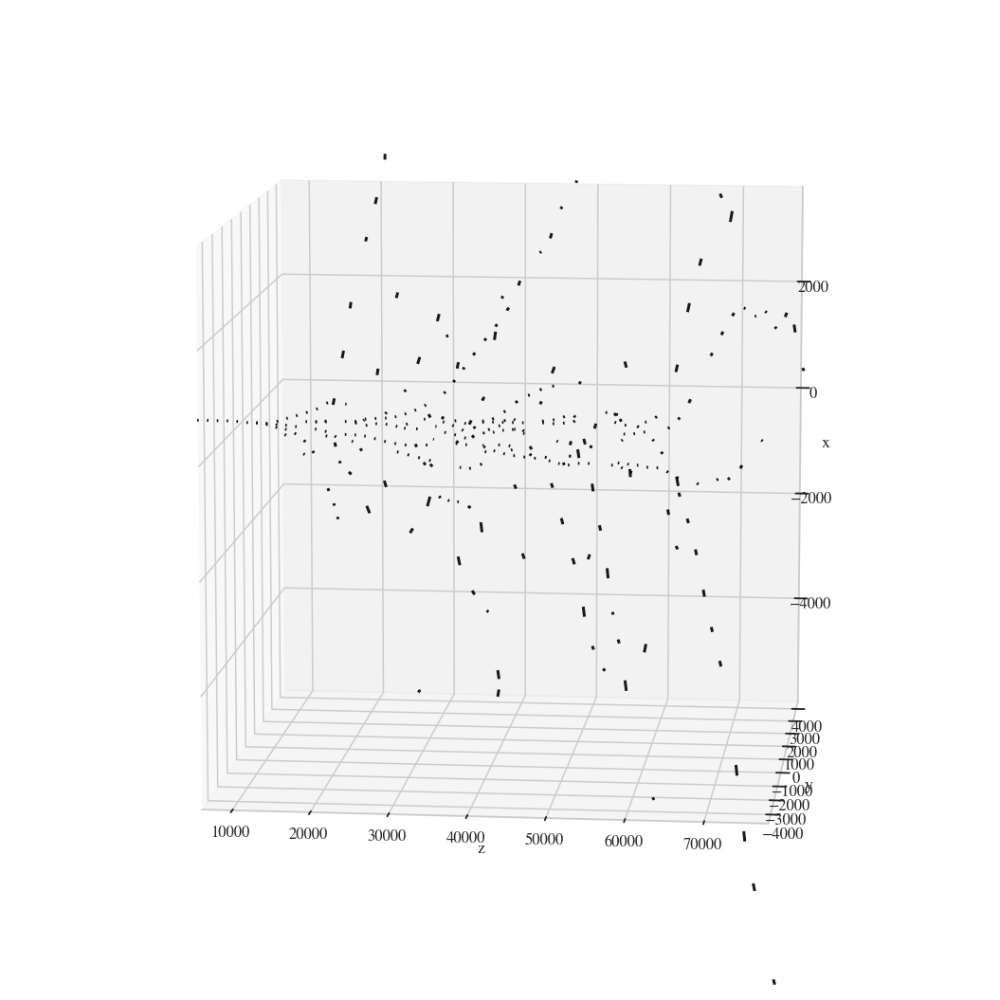

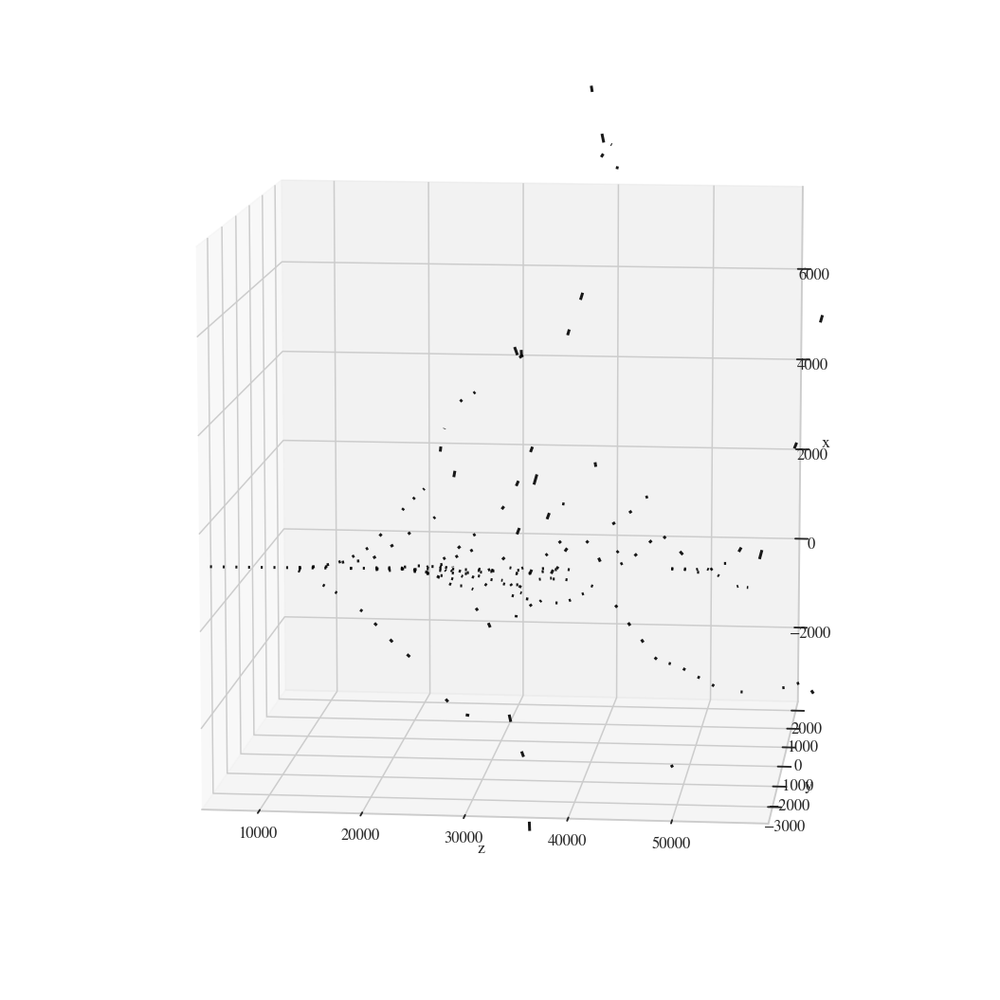

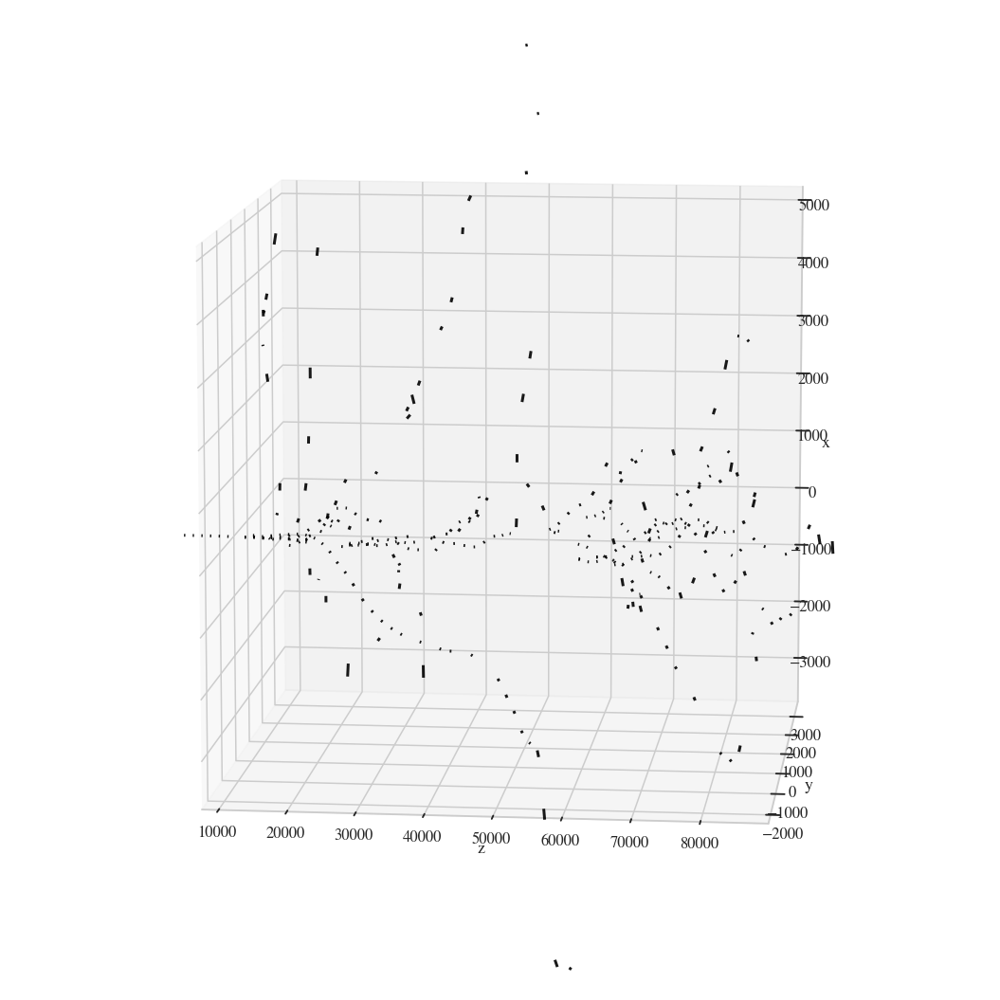

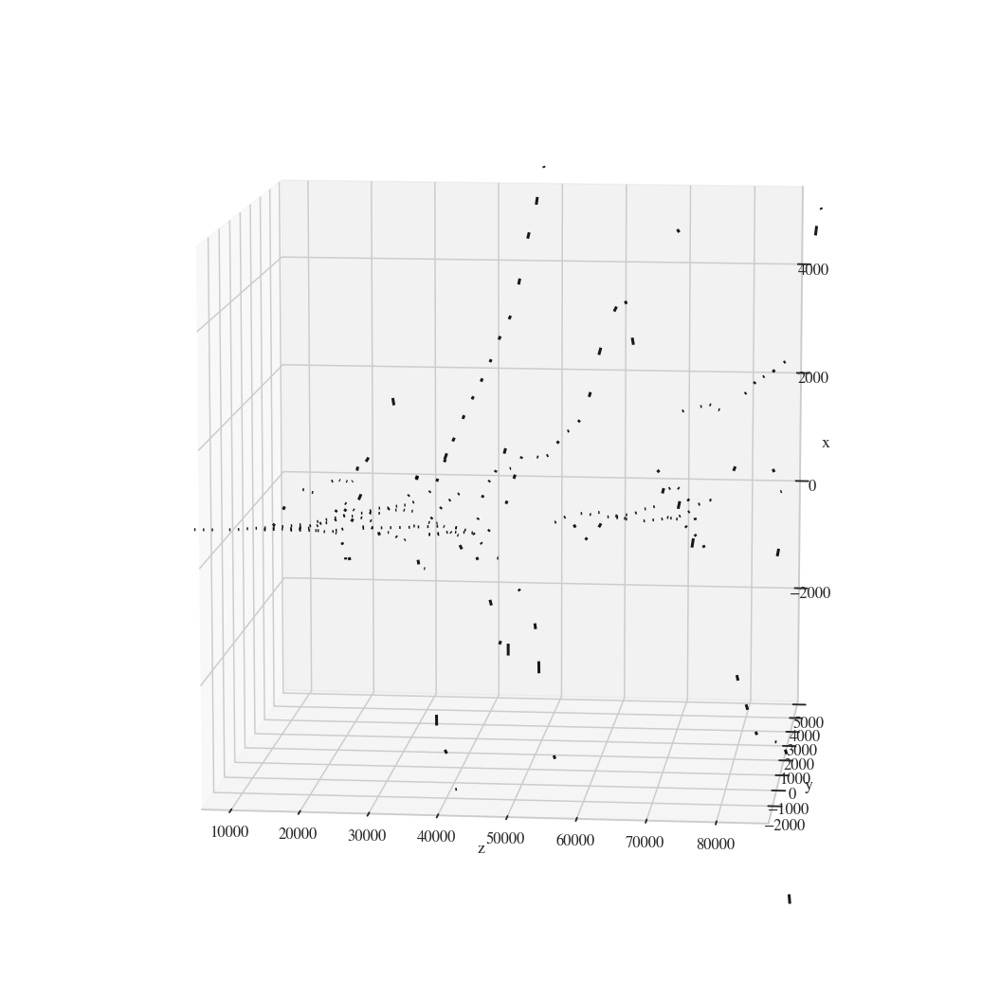

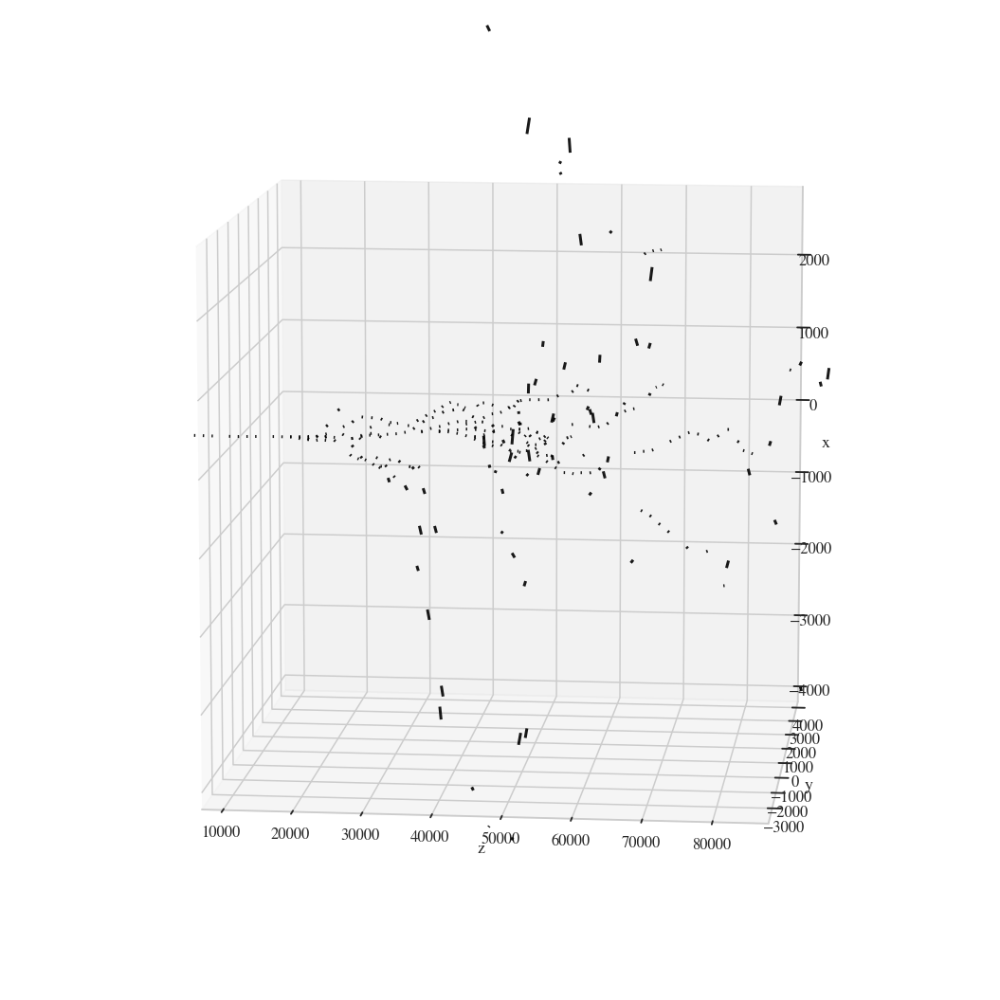

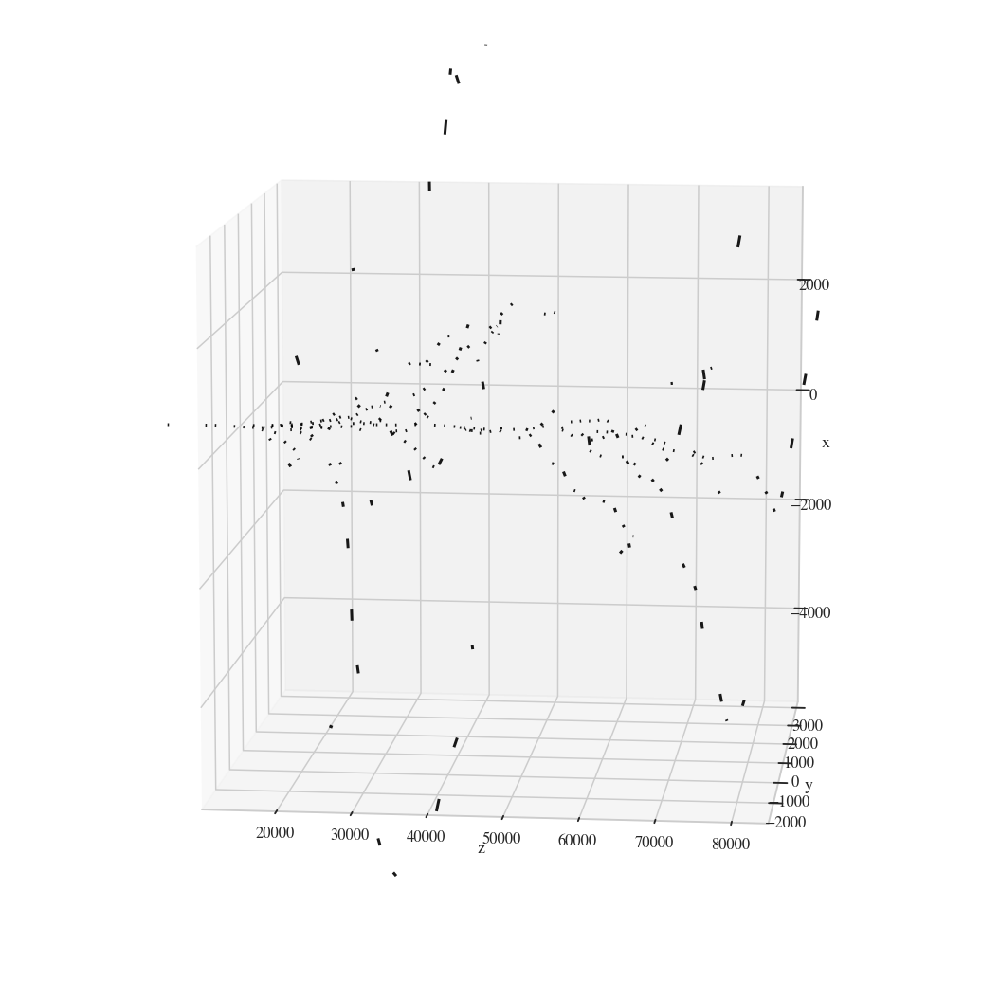

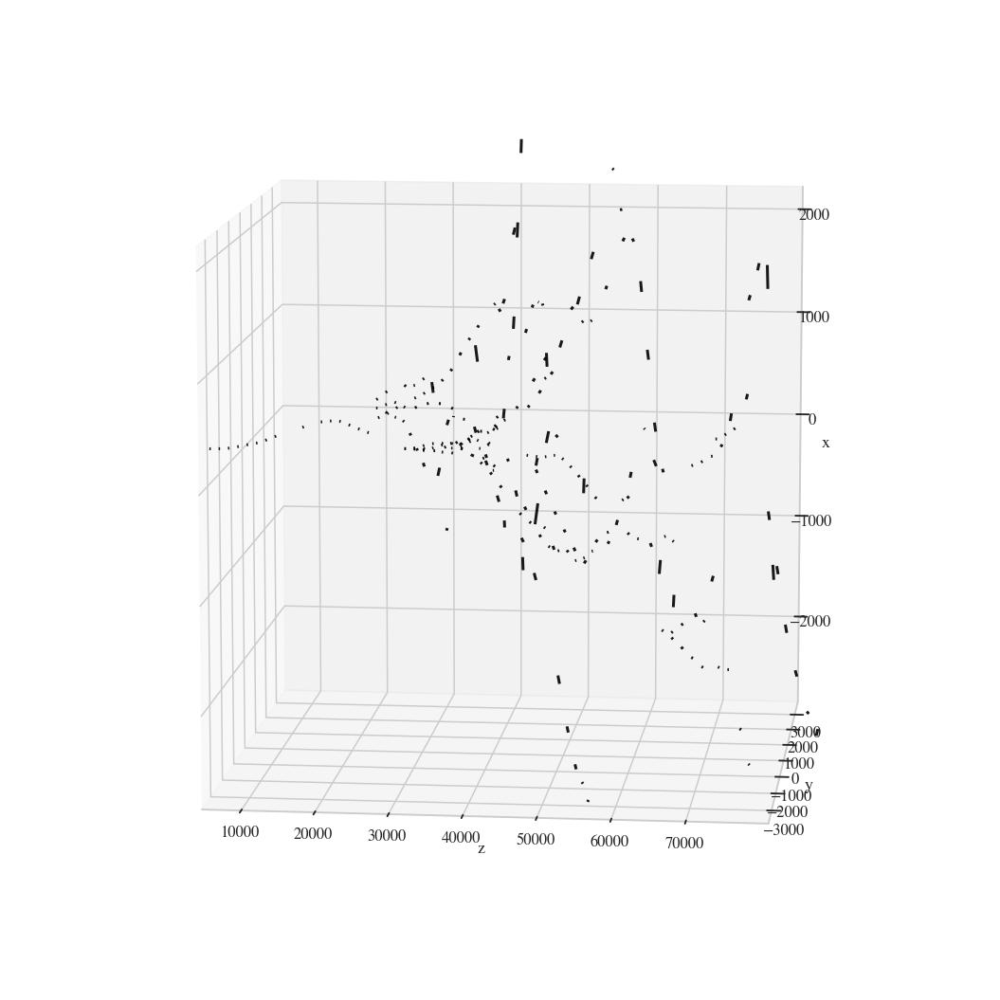

In [43]:
xs = []
for j in shower:
    tmp_X = j.x.copy()
#     tmp_X *= np.array([1e5, 1e5, 1e5, 1, 1])
    plot_npframe(np.array(tmp_X))    
#     x = tmp_X[:, 0]
#     xs.append(x)

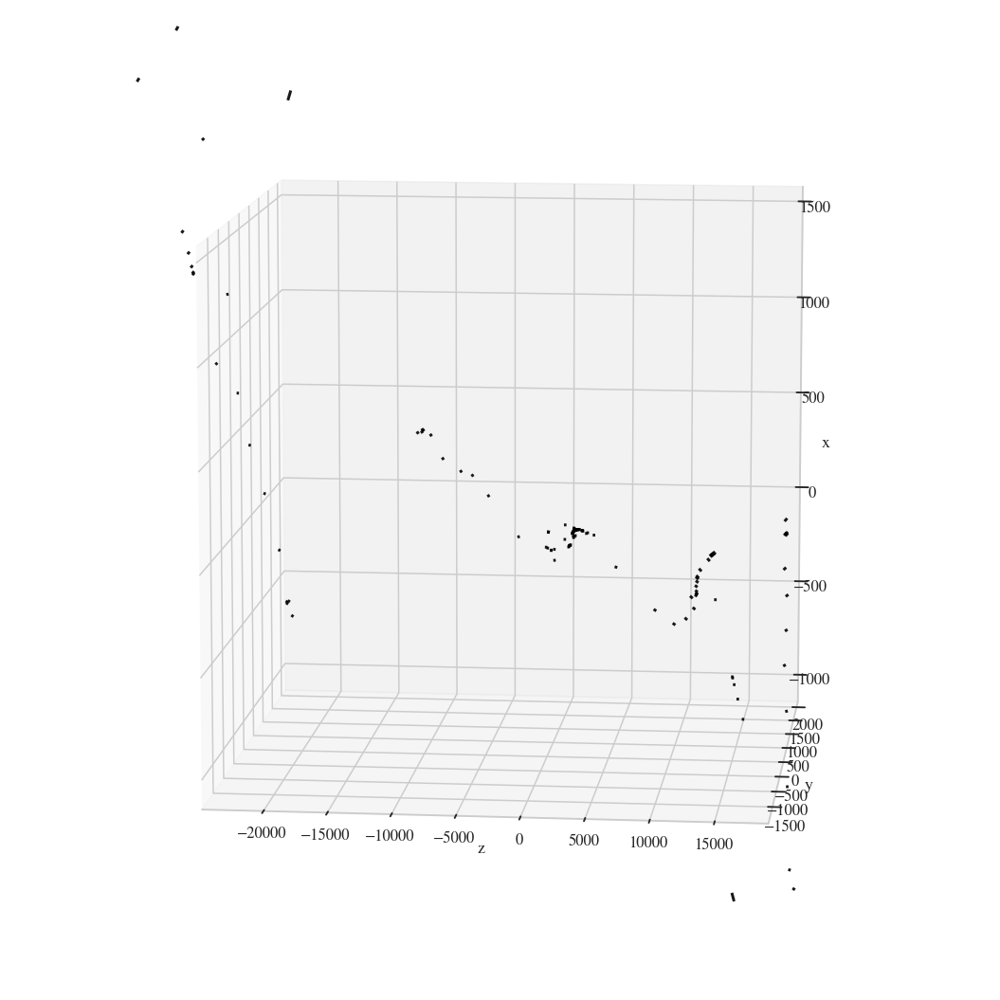

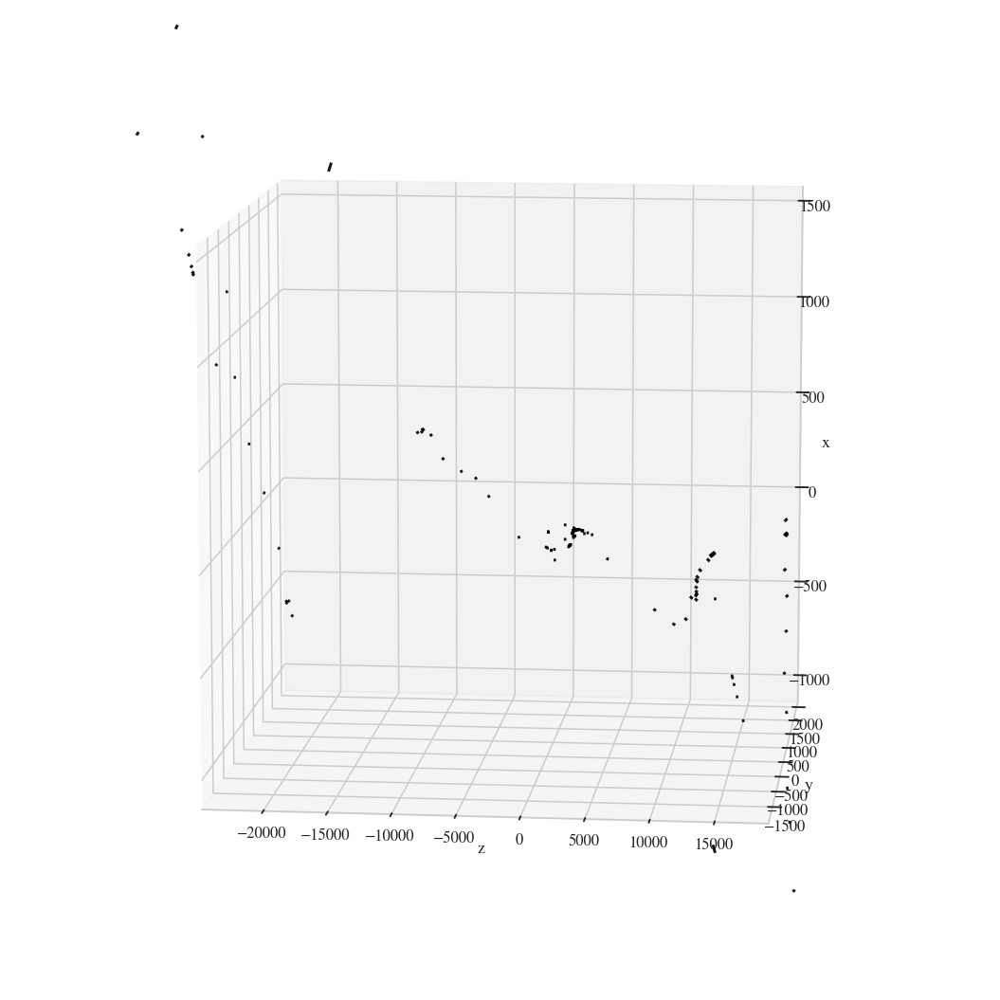

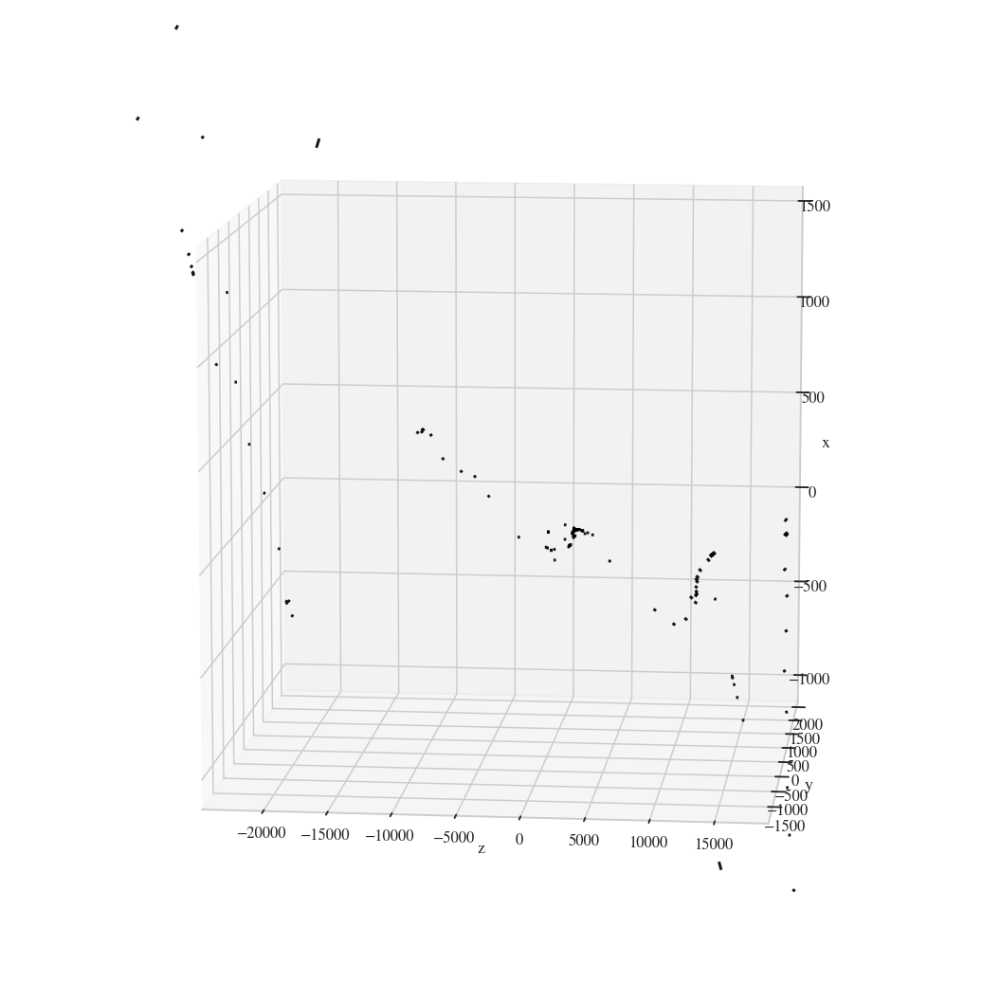

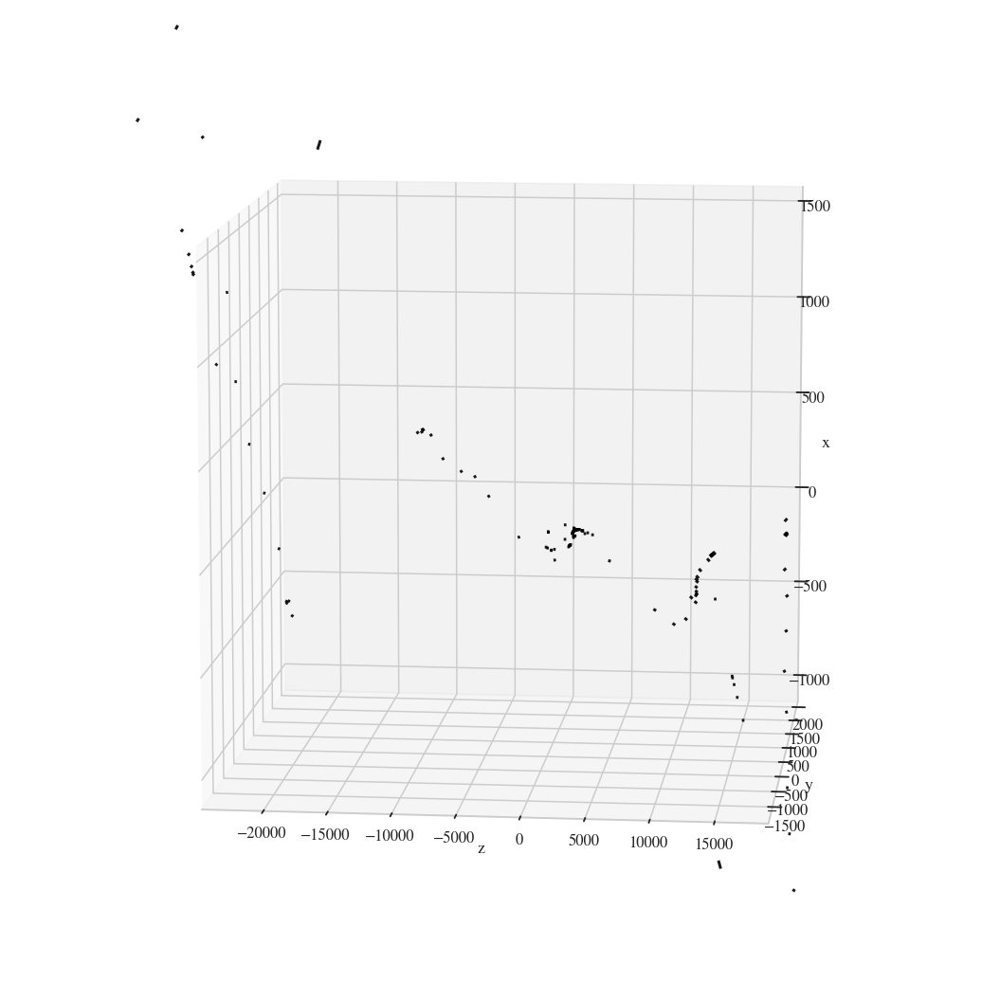

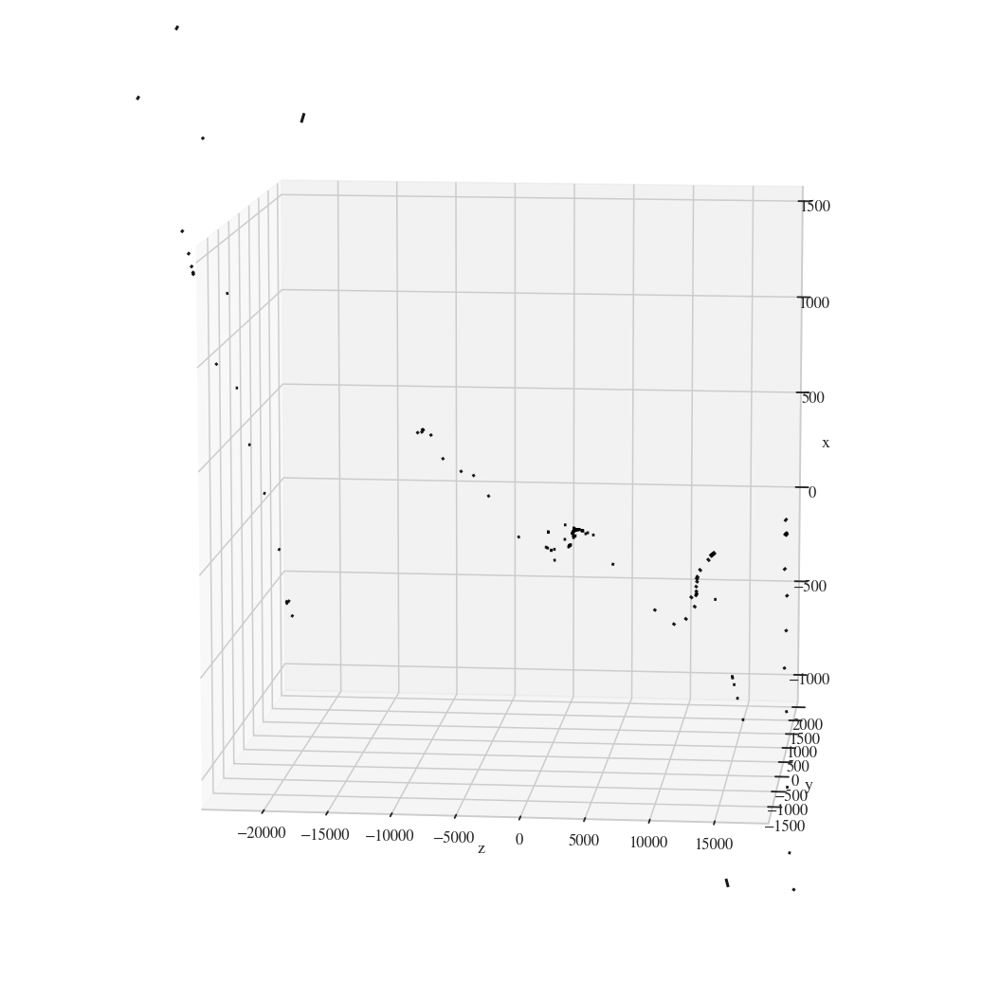

In [101]:
xs = []
for j in g:
    tmp_X = j.copy()[::-1]
    tmp_X *= np.array([1e5, 1e5, 1e5, 1, 1])
    plot_npframe(tmp_X)    
    x = tmp_X[:, 0]
    xs.append(x)

In [ ]:
xs = []
for j in g:
    tmp_X = j
    tmp_X *= np.array([1e5, 1e5, 1e5, 1, 1])
    plot_npframe(tmp_X)    
    x = tmp_X[:, 0]
    xs.append(x)

In [114]:
showers[0].x.head()

,SX,SY,SZ,TX,TY
0,0.000000,0.000000,0.000000,0.000000,0.000000
1,1.113531,-0.242892,1315.918937,0.001003,0.000010
2,2.010452,-1.078679,2629.396394,0.000211,-0.001078
3,5.122602,-9.413658,5258.802117,0.006088,-0.004949
4,28.850914,-23.121724,7890.722286,0.011713,-0.003233


In [115]:
xs_real = []
ys_real = []
zs_real = []
txs_real = []
tys_real = []
for shower in showers:
    xs_real.append(shower.x['SX'].values)
    ys_real.append(shower.x['SY'].values)
    zs_real.append(shower.x['SZ'].values)
    txs_real.append(shower.x['TX'].values)
    tys_real.append(shower.x['TY'].values)

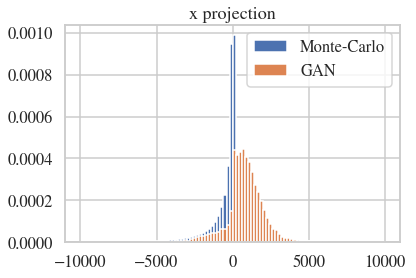

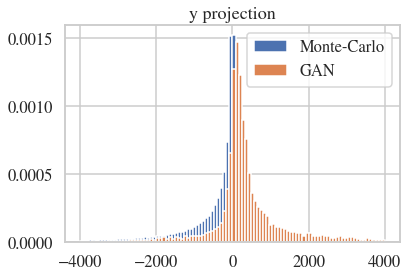

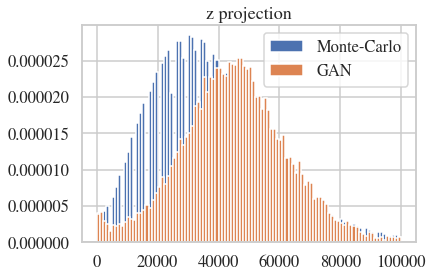

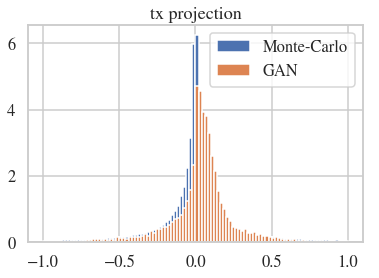

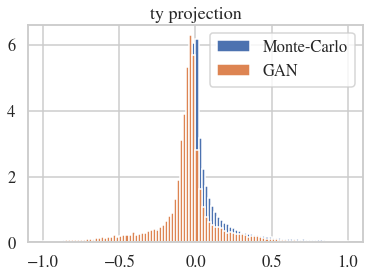

In [129]:
plt.hist(np.concatenate(xs_real), bins=100, range=(-10000, 10000), density=True, label='Monte-Carlo')
plt.hist(np.concatenate(xs), bins=100, range=(-10000, 10000), density=True, label='GAN')
plt.title('x projection')
plt.legend()
plt.show()
plt.hist(np.concatenate(ys_real), bins=100, range=(-4000, 4000), density=True, label='Monte-Carlo')
plt.hist(np.concatenate(ys), bins=100, range=(-4000, 4000), density=True, label='GAN')
plt.title('y projection')
plt.legend()
plt.show()
plt.hist(np.concatenate(zs_real), bins=100, range=(0, 100000), density=True, label='Monte-Carlo')
plt.hist(np.concatenate(zs), bins=100, range=(0, 100000), density=True, label='GAN')
plt.title('z projection')
plt.legend()
plt.show()
plt.hist(np.concatenate(txs_real), bins=100, range=(-1, 1), density=True, label='Monte-Carlo')
plt.hist(np.concatenate(thetaxs), bins=100, range=(-1, 1), density=True, label='GAN')
plt.title('tx projection')
plt.legend()
plt.show()
plt.hist(np.concatenate(tys_real), bins=100, range=(-1, 1), density=True, label='Monte-Carlo')
plt.hist(np.concatenate(thetays), bins=100, range=(-1, 1), density=True, label='GAN')
plt.title('ty projection')
plt.legend()
plt.show()

In [139]:
from scipy import stats
print(stats.ks_2samp(np.concatenate(xs_real), np.concatenate(xs)))
print(stats.ks_2samp(np.concatenate(ys_real), np.concatenate(ys)))
print(stats.ks_2samp(np.concatenate(zs_real), np.concatenate(zs)))
print(stats.ks_2samp(np.concatenate(txs_real), np.concatenate(thetaxs)))
print(stats.ks_2samp(np.concatenate(tys_real), np.concatenate(thetays)))

Ks_2sampResult(statistic=0.45602905371311536, pvalue=0.0)
Ks_2sampResult(statistic=0.31749735517669336, pvalue=0.0)
Ks_2sampResult(statistic=0.24023763369426193, pvalue=0.0)
Ks_2sampResult(statistic=0.2343562381728687, pvalue=0.0)
Ks_2sampResult(statistic=0.2585454816656619, pvalue=0.0)


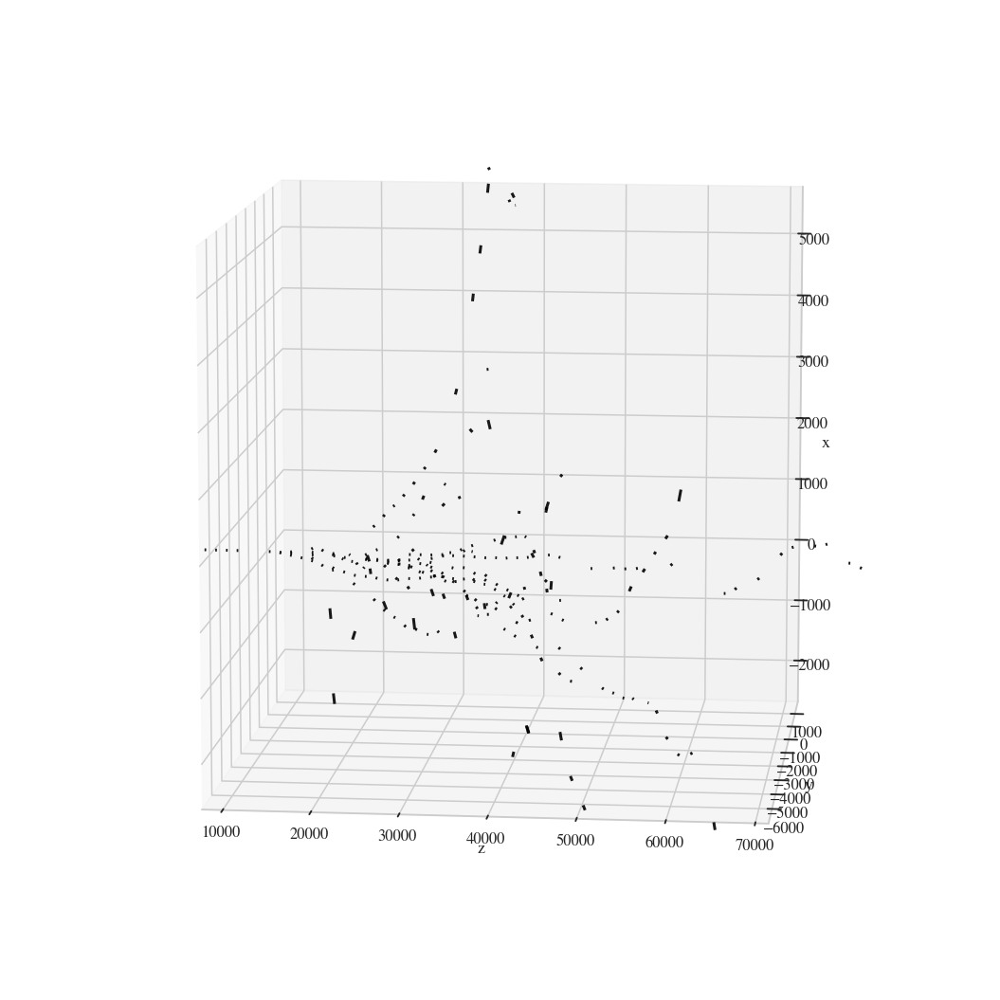

In [78]:
plot_npframe(showers[2].x[['SX', 'SY', 'SZ', 'TX', 'TY']].values)

In [79]:
len(showers[2].x[['SX', 'SY', 'SZ', 'TX', 'TY']].values)

240

## 